In [38]:
import numpy as np
import pandas as pd
pd.set_option('display.max_rows', 30)
pd.set_option('display.max_columns', 500)
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
%matplotlib inline
plt.rcParams['figure.dpi'] = 200
plt.rcParams['savefig.dpi'] = 200
plt.rcParams['figure.figsize'] = (10, 5)
plt.style.use("seaborn-v0_8-darkgrid")
import seaborn as sns
sns.set(rc={"figure.dpi":200, 'savefig.dpi':200 , 'figure.figsize': (10, 5)})
sns.set_context('notebook')
sns.set_style("ticks")
sns.set_style('darkgrid')

from pycaret.regression import *

import warnings
warnings.filterwarnings('ignore')

from IPython.display import display, HTML

In [39]:
# ADD TIME FEATURES
def add_time_features(df, time_column):
    
    df[time_column] = pd.to_datetime(df[time_column])  # Make sure the time column is in datetime format
    
    # Extract various time features
    #df['hour'] = df[time_column].dt.hour
    df['day_of_week'] = df[time_column].dt.dayofweek
    df['month'] = df[time_column].dt.month
    df['day_of_year'] = df[time_column].dt.dayofyear
    df['week_of_year'] = df[time_column].dt.isocalendar().week 
    df['year'] = df[time_column].dt.year

    df['sin_hour'] = np.sin(2*np.pi * df[time_column].dt.hour/24.)
    df['cos_hour'] = np.cos(2*np.pi * df[time_column].dt.hour/24.)
    
    return df

In [40]:
def add_interactions(df): 
    df['sun_elev_cloud_cover_interaction'] = df['sun_elevation:d'] * df['total_cloud_cover:p']

    df['radiation_interaction'] = df['clear_sky_rad:W'] * df['diffuse_rad:W'] * df['direct_rad:W']

    df['atmospheric_interaction'] = df['air_density_2m:kgm3'] * df['msl_pressure:hPa']

    df['temp_humidity_interaction'] = df['dew_point_2m:K'] * df['t_1000hPa:K']

    df['snow_radiation_interaction'] = df['fresh_snow_1h:cm'] * df['clear_sky_rad:W']  # Replace 'clear_sky_rad:W' with 'albedo' if available

    return df

In [41]:
from sklearn.preprocessing import PolynomialFeatures
import pandas as pd

def add_polynomial_features(df, feature_list, degree=2):
    """
    Adds polynomial features for specified features in a DataFrame.

    Parameters:
    - df: pandas.DataFrame - The original DataFrame.
    - feature_list: list - A list of column names to create polynomial features for.
    - degree: int - The degree of the polynomial features to create.

    Returns:
    - df: pandas.DataFrame - The DataFrame with added polynomial features.
    """

    # Initialize the PolynomialFeatures transformer
    poly_transformer = PolynomialFeatures(degree=degree, include_bias=False)

    for feature in feature_list:
        # Check if the feature exists in the dataframe to avoid KeyError
        if feature in df.columns:
            # Reshape the feature column to a 2D array for PolynomialFeatures
            feature_data = df[[feature]].values
            
            # Create polynomial features for the selected feature
            feature_poly = poly_transformer.fit_transform(feature_data)
            
            # Generate new feature names
            feature_names = [f"{feature}^{i}" for i in range(1, degree + 1)]
            
            # Convert the output array to a DataFrame with new feature names
            feature_poly_df = pd.DataFrame(feature_poly, columns=feature_names)
            
            # Concatenate the new polynomial features to the original DataFrame
            df = pd.concat([df, feature_poly_df.iloc[:, 1:]], axis=1)  # Skip the original feature column
            
    return df

def add_rolling_average(df, window_size, fill_method='ffill'):
    """
    Adds rolling average columns to the dataframe based on the specified window size.
    Args:
    - df: The input dataframe.
    - window_size: The number of periods to consider for calculating the rolling average.
    
    Returns:
    - df with new columns for the rolling averages of selected features.
    """
    rolling_features = ['absolute_humidity_2m:gm3', 'air_density_2m:kgm3',
       'clear_sky_energy_1h:J', 'clear_sky_rad:W',
       'cloud_base_agl:m', 'dew_point_2m:K',
       'diffuse_rad:W', 'diffuse_rad_1h:J', 'direct_rad:W', 'direct_rad_1h:J',
       'effective_cloud_cover:p', 'fresh_snow_12h:cm', 'fresh_snow_1h:cm',
       'fresh_snow_24h:cm', 'fresh_snow_3h:cm', 'fresh_snow_6h:cm',
       'is_in_shadow:idx', 'msl_pressure:hPa', 'precip_5min:mm',
       'pressure_100m:hPa', 'pressure_50m:hPa',
       'prob_rime:p', 'relative_humidity_1000hPa:p',
       'sfc_pressure:hPa', 'snow_depth:cm',
       'snow_melt_10min:mm', 'snow_water:kgm2', 'sun_azimuth:d',
       'sun_elevation:d', 'super_cooled_liquid_water:kgm2', 't_1000hPa:K',
       'total_cloud_cover:p', 'visibility:m', 'wind_speed_10m:ms',
       'wind_speed_u_10m:ms', 'wind_speed_v_10m:ms']
    for feature in rolling_features:
        rolling_name = f'{feature}_rolling_avg_{window_size}'
        df[rolling_name] = df[feature].rolling(window=window_size, min_periods=1, center=True).mean()

        # Handle NaN values at the edges
        if fill_method == 'ffill':
            df[rolling_name].fillna(method='ffill', inplace=True)
        elif fill_method == 'bfill':
            df[rolling_name].fillna(method='bfill', inplace=True)
    return df

In [42]:

def plot_targets(targets, start_date, end_date):
    # Slice the dataframe based on the provided start and end dates
    targets_subset = targets[(targets['time'] >= start_date) & (targets['time'] <= end_date)]

    # Plotting
    plt.figure(figsize=(10, 5))
    plt.plot(targets_subset['time'], targets_subset['pv_measurement'], label='PV Measurement')
    plt.xlabel('Time')
    plt.ylabel('PV Measurement')
    plt.title('PV Measurement Over Time')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

In [43]:
def make_categorical(df, feature_list):
    for feature in feature_list:
        df[feature] = df[feature].astype('category')
    return df

In [44]:
def add_time_delta(observed, estimated, test):
    estimated['time_delta'] = (estimated['date_forecast'] - estimated['date_forecast'].dt.normalize()).dt.total_seconds() / 3600
    observed['time_delta'] = 0
    test['time_delta'] = (test['date_forecast'] - test['date_forecast'].dt.normalize()).dt.total_seconds() / 3600
    return observed, estimated, test

def add_is_estimated(observed, estimated, test):
    estimated['is_estimated'] = 1
    observed['is_estimated'] = 0
    test['is_estimated'] = 1
    return observed, estimated, test

def process_data(observed, estimated, test):
    observed, estimated, test = add_time_delta(observed, estimated, test)
    observed, estimated, test = add_is_estimated(observed, estimated, test)
    train = pd.concat([observed, estimated], axis=0).sort_values(by='date_forecast')
    return train, test

def set_date_time(targets, observed, estimated, test):
    targets['time'] = pd.to_datetime(targets['time'])
    observed['date_forecast'] = pd.to_datetime(observed['date_forecast'])
    estimated['date_forecast'] = pd.to_datetime(estimated['date_forecast'])
    test['date_forecast'] = pd.to_datetime(test['date_forecast'])
    return targets, observed, estimated, test

def resample_data(observed, estimated, test):
    observed_resampled = observed.set_index('date_forecast').resample('1H').mean().dropna(how='all').reset_index()
    estimated_resampled = estimated.set_index('date_forecast').resample('1H').mean().dropna(how='all').reset_index()
    test_resampled = test.set_index('date_forecast').resample('1H').mean().dropna(how='all').reset_index()
    return observed_resampled, estimated_resampled, test_resampled

def extract_is_day_feature(test):
    is_day_feature = test[['date_forecast', 'is_day:idx']]
    is_day_feature['is_day:idx'] = is_day_feature['is_day:idx'].replace({0.25: 1, 0.5: 1, 0.75: 1, 1: 1, 0: 0})
    return is_day_feature

def extract_time_limit(targets):
    first_date = targets['time'].min()
    last_date = targets['time'].max()
    return first_date, last_date

def drop_features(train, test):
    train = train.drop(columns=['time', 'date_forecast', 'pv_measurement'])
    test = test.drop(columns=['date_forecast'])
    return train, test

def add_several_rolling_average(train, test, lst_of_window_sizes):
    for size in lst_of_window_sizes: 
        train = add_rolling_average(train, window_size=size)
        test = add_rolling_average(test, window_size=size)
    return train, test

In [45]:
def calculate_incidence_angles(df, latitude = 60):
    # Define a function to calculate the angle of incidence for a given row
    def angle_of_incidence(row, tilt_angle_rad, panel_azimuth_rad):
        sun_elevation_rad = np.radians(row['sun_elevation:d'])
        sun_azimuth_rad = np.radians(row['sun_azimuth:d'])
        cos_theta = (
            np.sin(sun_elevation_rad) * np.sin(tilt_angle_rad) +
            np.cos(sun_elevation_rad) * np.cos(tilt_angle_rad) * np.cos(sun_azimuth_rad - panel_azimuth_rad)
        )
        cos_theta = np.clip(cos_theta, -1, 1)  # Ensure cos_theta is within valid range
        return np.degrees(np.arccos(cos_theta))
    
    # Calculate the tilt angle and panel azimuth assuming Norway is in the northern hemisphere
    tilt_angle_rad = np.radians(latitude)
    panel_azimuth_rad = 0  # True south

    # Apply the angle_of_incidence function to each row
    df['angle_of_incidence'] = df.apply(angle_of_incidence, axis=1, tilt_angle_rad=tilt_angle_rad, panel_azimuth_rad=panel_azimuth_rad)
    
    return df

In [46]:
def add_wind_features(train, test):
    for df in [train, test]:
        # Horizontal wind speed magnitude at 10 meters
        df['wind_speed_10m_vector_magnitude:ms'] = np.sqrt(df['wind_speed_u_10m:ms']**2 + df['wind_speed_v_10m:ms']**2)

        # Wind direction at 10 meters
        df['wind_direction_10m:degrees'] = np.degrees(np.arctan2(df['wind_speed_v_10m:ms'], df['wind_speed_u_10m:ms']))

        # Temperature-adjusted wind speed at 10 meters
        df['temp_adjusted_wind_speed_10m:ms'] = df['wind_speed_10m:ms'] * (df['t_1000hPa:K'] / 273.15)

        # Vertical wind shear between surface and 1000 hPa
        # Note: this requires careful interpretation as mentioned earlier
        df['wind_shear_1000hPa_10m:ms'] = df['wind_speed_w_1000hPa:ms'] - df['wind_speed_10m:ms']

        # Wind energy density at 10 meters
        df['wind_energy_density_10m:Wm2'] = 0.5 * 1.225 * (df['wind_speed_10m:ms']**3)  # Using 1.225 kg/m3 as air density at sea level

    return train, test

In [47]:
def remove_constant_blocks(df):
    '''
    Remove constant blocks from the dataframe, i.e. where the value in pv_measurement is constant
    Ex: 0,0,1 -> 0,1
    '''
    df['diff'] = df['pv_measurement'].diff().fillna(0)
    df['constant'] = (df['diff'] == 0).astype(int)
    df['block'] = (df['constant'].diff() != 0).astype(int).cumsum()
    df['block_size'] = df.groupby('block')['constant'].transform('sum') # This gets the size per block

    # Keep the first occurrence by ensuring the block size is greater than 1 and that it's a constant value.
    df = df[~((df['block_size'] >= 1) & (df['pv_measurement'] != 0))]

    # Drop the helper columns
    df.drop(['diff', 'constant', 'block', 'block_size'], axis=1, inplace=True)
    
    return df

In [48]:
def preprocessing(targets, observed, estimated, test):
    targets, observed, estimated, test = set_date_time(targets, observed, estimated, test)
    
    observed, estimated, test = resample_data(observed, estimated, test)

    is_day_feature = extract_is_day_feature(test)

    first_date, last_date = extract_time_limit(targets)
    start_date, end_date = '2017-07-01', '2024-08-30'  
   
    
    train, test = process_data(observed, estimated, test)

    train, test = add_several_rolling_average(train, test, lst_of_window_sizes = [3, 5, 7])

    merged_data = pd.merge(targets, train, how='inner', left_on='time', right_on='date_forecast')

    # Remove constant blocks from the data
    train = remove_constant_blocks(merged_data)

    ###### This one should be double checked ########
    # Remove rows where pv_measurement is 0
    train = train[merged_data['pv_measurement'] != 0]

    # Add the time-based features
    train = add_time_features(train, 'time')  
    test = add_time_features(test, 'date_forecast') 

    targets = train[['time', 'pv_measurement']]
    
    plot_targets(targets, start_date, end_date)

    train, test = drop_features(train, test)

    # train = calculate_incidence_angles(train)
    # test = calculate_incidence_angles(test)

    # train, test = add_wind_features(train, test)

    return train, test, is_day_feature, targets

In [49]:
from pycaret.regression import *
def process_location_catboost(exp_reg, seed):
    catboost = exp_reg.create_model('catboost', random_state = seed)
    return catboost

def process_location_lightgbm(exp_reg, seed):
    lightgbm = exp_reg.create_model('lightgbm', random_state = seed)
    return lightgbm



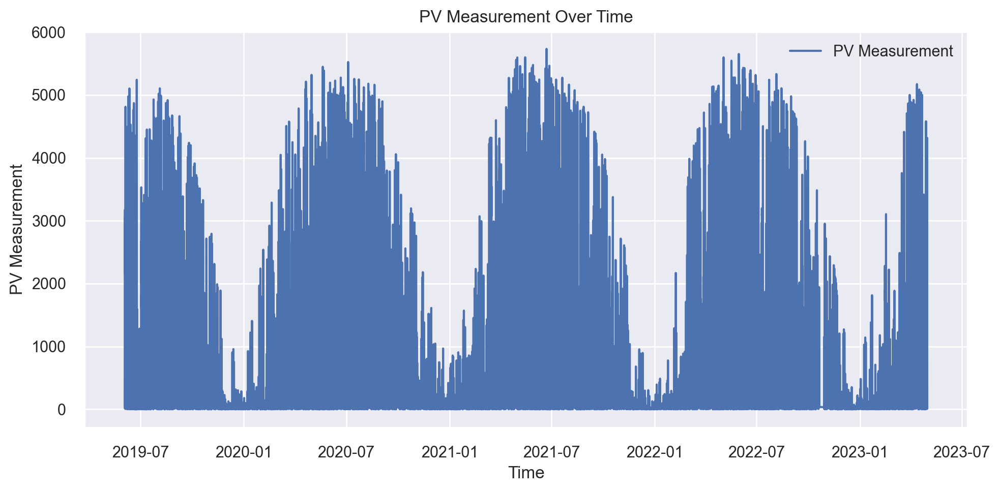

18036 X
18036 y


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     308.4843  250114.0044  500.1140  0.8705  0.9575  4.1965
1     314.8229  258994.6777  508.9152  0.8602  0.9537  2.9475
2     332.9522  268873.4317  518.5301  0.8663  0.9758  3.7505
3     303.4564  244044.7877  494.0089  0.8640  0.9163  3.4811
4     314.6205  252898.7917  502.8904  0.8669  0.9234  4.0318
5     312.5175  253058.7163  503.0494  0.8688  0.9827  4.2233
6     340.9852  295880.8063  543.9493  0.8457  0.9744  4.5586
7     333.9095  283649.9228  532.5879  0.8451  0.9799  4.5600
8     316.2524  254870.6845  504.8472  0.8692  0.9840  4.6993
9     310.0004  264216.9629  514.0204  0.8659  0.9164  3.2827
Mean  318.8001  262660.2786  512.2913  0.8622  0.9564  3.9731
Std    11.9134   15332.0960   14.7622  0.0089  0.0265  0.5613
#############################################
Catboost Done


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     315.3685  269357.5492  518.9967  0.8605  0.8340  2.3430
1     322.6237  274100.9905  523.5466  0.8520  0.8014  2.0151
2     346.1413  301171.2474  548.7907  0.8503  0.8539  2.5057
3     306.6604  253712.7327  503.6990  0.8586  0.7963  1.9601
4     319.5723  265690.0167  515.4513  0.8601  0.8315  3.1271
5     323.7549  271280.4807  520.8459  0.8593  0.8717  2.6644
6     344.4363  305025.7852  552.2914  0.8409  0.8873  3.2820
7     340.9732  303039.6307  550.4904  0.8345  0.8980  3.6504
8     314.9607  256854.8426  506.8085  0.8682  0.8487  2.8797
9     312.7134  270462.9205  520.0605  0.8627  0.8357  2.9383
Mean  324.7205  277069.6196  526.0981  0.8547  0.8458  2.7366
Std    13.4037   18072.0925   17.0416  0.0099  0.0317  0.5180
#############################################
LGBM Done


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     306.1665  253166.8433  503.1569  0.8689  0.8468  2.7568
1     312.9894  260751.6039  510.6384  0.8592  0.8428  2.0310
2     334.4400  278228.7435  527.4739  0.8617  0.8617  2.4913
3     299.5430  242757.4946  492.7043  0.8647  0.8319  2.2216
4     310.7934  252805.9370  502.7981  0.8669  0.8358  2.9856
5     311.5296  254881.0535  504.8575  0.8678  0.8829  3.0587
6     337.1847  293697.7056  541.9388  0.8468  0.8781  2.9822
7     332.3950  287119.9356  535.8357  0.8432  0.8964  3.4653
8     309.7158  249256.5089  499.2560  0.8721  0.8873  3.0991
9     306.2528  261925.0850  511.7862  0.8670  0.8337  2.7172
Mean  316.1010  263459.0911  513.0446  0.8618  0.8597  2.7809
Std    12.7110   16202.8019   15.6318  0.0091  0.0234  0.4115
#############################################
Blended
#############################################
Finalized
float64
date_forecast 

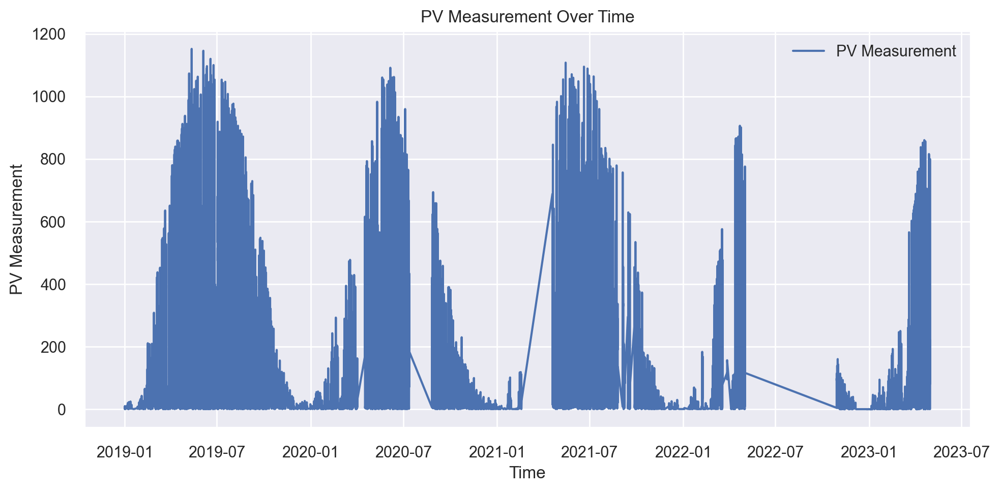

12274 X
12274 y


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     47.9184  6677.1764  81.7140  0.9007  0.7105  1.3636
1     51.2428  7031.6603  83.8550  0.8929  0.7316  1.8620
2     50.7554  6667.8019  81.6566  0.9110  0.6465  1.0665
3     49.6599  6331.3476  79.5698  0.9079  0.7556  1.8957
4     49.0103  6844.2501  82.7300  0.9012  0.7305  1.4471
5     46.3099  6170.9962  78.5557  0.9096  0.7286  2.6548
6     51.8103  7360.9293  85.7959  0.8930  0.7398  1.5520
7     51.9179  7368.9777  85.8427  0.9007  0.7264  1.9472
8     50.7480  7162.2337  84.6300  0.8983  0.6875  1.4026
9     51.2082  6885.1156  82.9766  0.8842  0.7405  1.4567
Mean  50.0581  6850.0489  82.7326  0.8999  0.7198  1.6648
Std    1.7350   381.4779   2.3156  0.0079  0.0300  0.4211
#############################################
Catboost Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     48.8033  6802.8288  82.4793  0.8988  0.7010  1.3304
1     50.2410  6645.0830  81.5174  0.8988  0.7521  1.9409
2     50.9864  6967.0804  83.4690  0.9070  0.6388  1.2003
3     51.3668  6723.2868  81.9957  0.9022  0.7447  1.8370
4     50.0815  7203.3086  84.8723  0.8960  0.7332  2.4455
5     48.0141  6721.5324  81.9850  0.9015  0.7194  2.0086
6     52.3255  8020.4156  89.5568  0.8834  0.6946  1.7121
7     53.6742  8327.2733  91.2539  0.8877  0.7127  1.8764
8     52.3636  7542.2547  86.8462  0.8929  0.7102  1.5006
9     53.4740  7243.2616  85.1074  0.8782  0.7531  1.5520
Mean  51.1330  7219.6325  84.9083  0.8947  0.7160  1.7404
Std    1.7890   550.9183   3.1964  0.0086  0.0324  0.3451
#############################################
LGBM Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     47.5274  6562.0972  81.0068  0.9024  0.6871  1.2825
1     49.7471  6639.1520  81.4810  0.8989  0.7211  1.8228
2     49.9803  6648.0452  81.5355  0.9112  0.6259  1.0803
3     49.5885  6356.4227  79.7272  0.9076  0.7305  1.8040
4     48.6608  6857.9861  82.8130  0.9010  0.7148  1.8158
5     46.2804  6287.0110  79.2907  0.9079  0.7077  2.2462
6     51.2740  7514.4729  86.6861  0.8908  0.6981  1.5814
7     51.8707  7671.3715  87.5864  0.8966  0.7011  1.8125
8     50.5372  7161.1188  84.6234  0.8983  0.6887  1.3912
9     51.5427  6876.7806  82.9264  0.8844  0.7272  1.4410
Mean  49.7009  6857.4458  82.7676  0.8999  0.7002  1.6278
Std    1.6992   440.6703   2.6392  0.0077  0.0286  0.3214
#############################################
Blended
#############################################
Finalized
float64
date_forecast    datetime64[ns]
is_day:idx              float32
dtype:

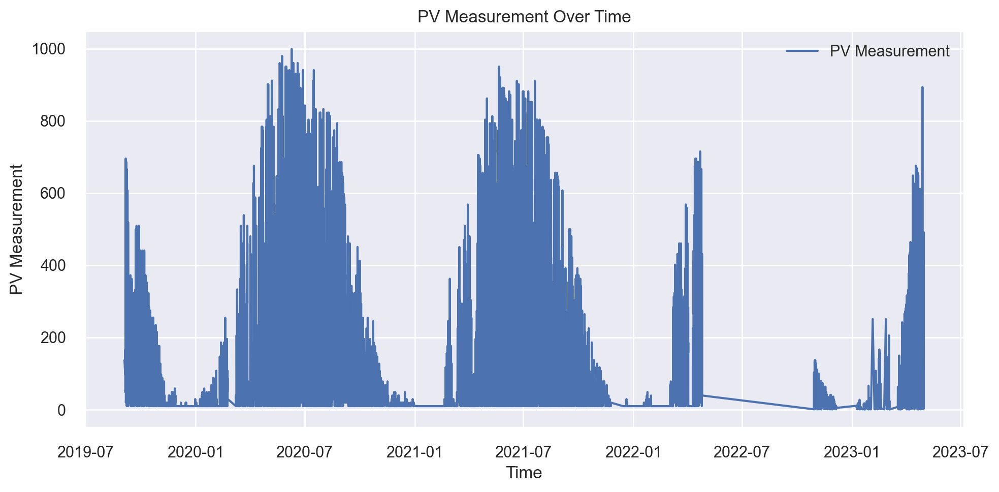

9676 X
9676 y


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     47.7684  5500.1572  74.1630  0.8805  0.5469  0.5390
1     44.6419  5640.2777  75.1018  0.8798  0.4907  0.5468
2     42.3836  4162.4663  64.5172  0.9144  0.4938  0.5130
3     45.4356  5091.5327  71.3550  0.9009  0.4914  0.5025
4     43.7844  4952.0973  70.3711  0.8943  0.5483  0.6443
5     43.0889  5406.0040  73.5255  0.8758  0.5357  0.5784
6     45.8240  5802.9921  76.1774  0.8809  0.5102  0.6090
7     45.4298  5389.8401  73.4155  0.8846  0.5250  0.5756
8     42.7915  4878.2860  69.8447  0.8942  0.4720  0.4519
9     47.0472  6003.4532  77.4820  0.8595  0.5598  0.6033
Mean  44.8195  5282.7107  72.5953  0.8865  0.5174  0.5564
Std    1.7194   505.6025   3.5538  0.0144  0.0284  0.0544
#############################################
Catboost Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     49.3174  5986.0927  77.3698  0.8699  0.5174  0.5677
1     45.1374  5589.5269  74.7631  0.8808  0.5116  0.6079
2     43.0990  4321.9078  65.7412  0.9111  0.5129  0.5552
3     46.7627  5237.8403  72.3729  0.8981  0.4892  0.5165
4     46.0946  5312.8669  72.8894  0.8866  0.5590  0.7582
5     44.2924  5353.0940  73.1648  0.8770  0.5297  0.5794
6     45.0939  5578.4052  74.6887  0.8855  0.5487  0.6870
7     46.7188  5630.6757  75.0378  0.8794  0.5318  0.6317
8     44.5346  5209.4010  72.1762  0.8871  0.5090  0.5455
9     48.0951  6251.1001  79.0639  0.8537  0.5797  0.7084
Mean  45.9146  5447.0911  73.7268  0.8829  0.5289  0.6158
Std    1.7741   490.0367   3.3838  0.0146  0.0256  0.0751
#############################################
LGBM Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     47.7330  5576.4597  74.6757  0.8788  0.5190  0.5389
1     43.9223  5485.0696  74.0613  0.8831  0.4963  0.5496
2     41.9958  4111.6864  64.1224  0.9154  0.4855  0.5029
3     45.3736  5005.2725  70.7480  0.9026  0.4728  0.4804
4     44.3555  4974.5915  70.5308  0.8939  0.5418  0.6853
5     43.1716  5262.1648  72.5408  0.8791  0.5166  0.5523
6     44.7727  5543.8922  74.4573  0.8863  0.5180  0.6265
7     45.3304  5372.4247  73.2968  0.8849  0.5208  0.5890
8     43.0001  4901.3901  70.0099  0.8937  0.4761  0.4777
9     46.7373  5982.1396  77.3443  0.8600  0.5439  0.6308
Mean  44.6392  5221.5091  72.1787  0.8878  0.5091  0.5633
Std    1.6562   484.1778   3.4264  0.0142  0.0240  0.0655
#############################################
Blended
#############################################
Finalized
float64
date_forecast    datetime64[ns]
is_day:idx              float32
dtype:

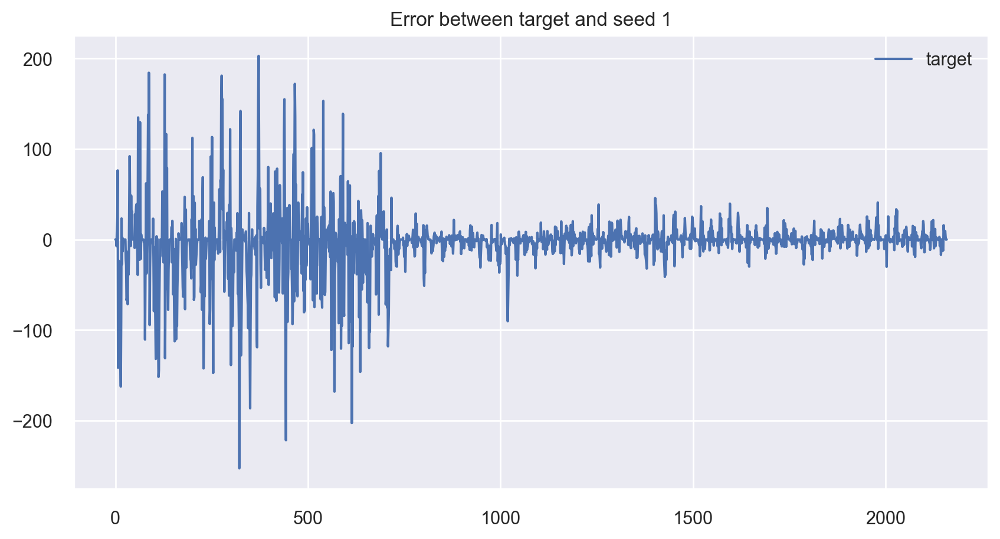

MAE for seed 1: 16.386978418156552


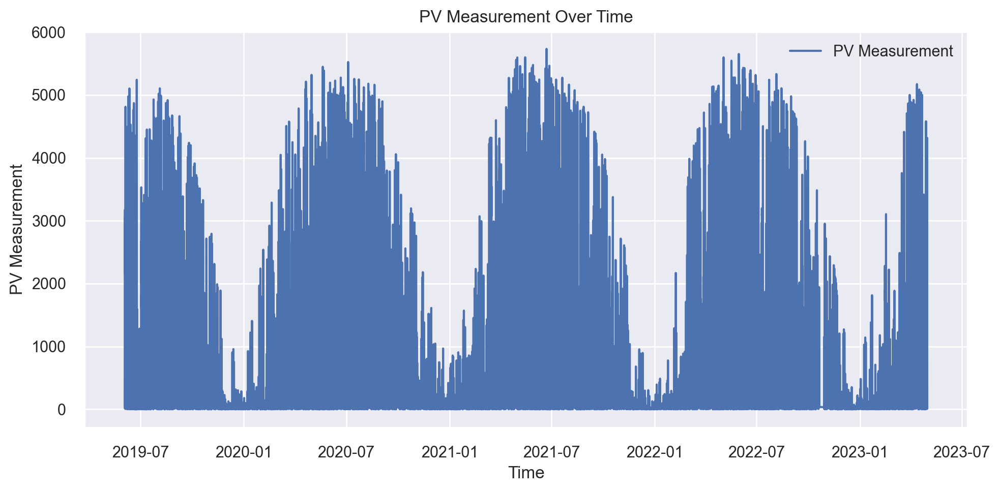

18036 X
18036 y


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     293.2996  233843.7850  483.5740  0.8688  0.9849  4.8203
1     319.9333  254933.6292  504.9095  0.8620  1.0280  5.6628
2     329.8001  273854.8435  523.3114  0.8506  0.9475  3.5503
3     337.2168  306876.2550  553.9641  0.8479  0.9286  3.7147
4     320.4940  257864.8456  507.8039  0.8611  0.8952  3.2346
5     331.5098  278920.8136  528.1295  0.8543  0.9014  3.4047
6     305.8874  234118.5807  483.8580  0.8764  0.9224  3.7843
7     336.5465  285244.0698  534.0825  0.8537  0.9485  3.4202
8     312.4162  244740.8752  494.7129  0.8655  0.8668  3.0303
9     307.5805  247621.4395  497.6158  0.8661  0.9063  3.9624
Mean  319.4684  261801.9137  511.1962  0.8606  0.9330  3.8585
Std    13.8563   22632.7713   21.9178  0.0085  0.0445  0.7606
#############################################
Catboost Done


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     297.8021  239617.4211  489.5073  0.8656  0.8921  3.0998
1     321.3814  265806.9456  515.5647  0.8561  0.8809  3.2275
2     331.9389  279351.2401  528.5369  0.8476  0.8888  2.8065
3     336.3042  309688.1195  556.4963  0.8465  0.8451  2.6028
4     324.8224  269050.7972  518.7011  0.8551  0.8322  2.5153
5     338.5796  296008.1339  544.0663  0.8454  0.8441  3.1825
6     317.1848  253330.6854  503.3197  0.8662  0.8542  2.5749
7     333.7412  287515.6373  536.2048  0.8526  0.8366  2.3233
8     322.4407  265499.1000  515.2660  0.8541  0.7694  1.9926
9     310.8857  263123.5871  512.9557  0.8577  0.7926  2.1886
Mean  323.5081  272899.1667  522.0619  0.8547  0.8436  2.6514
Std    11.9757   19618.2426   18.7231  0.0069  0.0377  0.4027
#############################################
LGBM Done


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     290.6894  231443.3720  481.0856  0.8702  0.8914  3.2695
1     314.5968  254260.2463  504.2422  0.8624  0.9318  3.8393
2     324.7753  270719.3438  520.3070  0.8523  0.8639  2.6625
3     330.7544  301682.0360  549.2559  0.8505  0.8469  2.4285
4     316.9298  256848.0033  506.8017  0.8616  0.8117  2.2763
5     330.4672  281785.4120  530.8346  0.8529  0.8410  2.6622
6     306.5877  237776.8035  487.6236  0.8744  0.8400  2.6522
7     328.6116  279863.4411  529.0212  0.8565  0.8381  2.2121
8     312.3626  248542.2751  498.5401  0.8634  0.7719  2.0944
9     303.6862  249155.4355  499.1547  0.8653  0.8157  2.6287
Mean  315.9461  261207.6369  510.6867  0.8609  0.8453  2.6726
Std    12.4897   20755.6942   20.1681  0.0075  0.0418  0.4983
#############################################
Blended
#############################################
Finalized
float64
date_forecast 

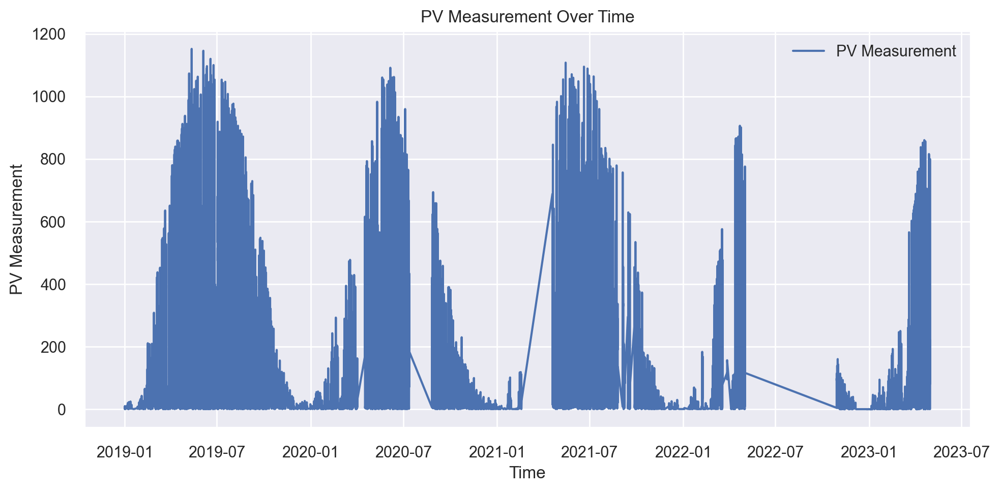

12274 X
12274 y


          MAE        MSE     RMSE      R2   RMSLE     MAPE
Fold                                                      
0     49.4722  7302.1031  85.4523  0.8922  0.7047   1.3046
1     53.0757  7766.5206  88.1279  0.8843  0.7543   3.3126
2     48.6966  6499.9595  80.6223  0.9008  0.7110   1.5993
3     52.8352  7978.3454  89.3216  0.8801  0.7277   1.8043
4     51.9143  7462.6486  86.3866  0.8917  0.7283   1.3828
5     50.4995  7513.9232  86.6829  0.8911  0.7583   1.8003
6     51.5980  7016.8523  83.7667  0.9008  0.6521  62.8492
7     47.3308  5902.8745  76.8302  0.9111  0.7427   2.2426
8     48.8800  6765.6531  82.2536  0.9067  0.6524   1.1634
9     51.4460  7156.6889  84.5972  0.8840  0.7650   2.1085
Mean  50.5748  7136.5569  84.4041  0.8943  0.7196   7.9568
Std    1.8196   588.3147   3.5356  0.0097  0.0385  18.3068
#############################################
Catboost Done


          MAE        MSE     RMSE      R2   RMSLE     MAPE
Fold                                                      
0     51.7447  8158.2734  90.3232  0.8796  0.6958   1.3195
1     53.5751  8132.9492  90.1829  0.8788  0.7488   2.9528
2     49.1547  6733.6924  82.0591  0.8972  0.7029   1.3315
3     53.9001  8045.4800  89.6966  0.8791  0.7101   1.7136
4     52.8826  7901.2906  88.8892  0.8853  0.7083   1.3067
5     52.9935  8037.7408  89.6534  0.8835  0.7561   2.0277
6     51.2593  7182.2035  84.7479  0.8985  0.6610  44.1593
7     48.6900  6140.6654  78.3624  0.9075  0.7265   2.1783
8     49.4604  6816.4026  82.5615  0.9060  0.6189   1.1438
9     53.3334  7455.2862  86.3440  0.8792  0.7822   2.1907
Mean  51.6994  7460.3984  86.2820  0.8895  0.7111   6.0324
Std    1.8667   676.1162   3.9765  0.0110  0.0448  12.7200
#############################################
LGBM Done


          MAE        MSE     RMSE      R2   RMSLE     MAPE
Fold                                                      
0     49.4504  7500.7968  86.6071  0.8893  0.6857   1.2588
1     52.4520  7771.3468  88.1552  0.8842  0.7318   3.0527
2     48.1166  6417.9264  80.1120  0.9021  0.6890   1.4073
3     52.5163  7803.1476  88.3354  0.8827  0.6986   1.7208
4     51.4593  7528.3792  86.7662  0.8907  0.6955   1.2758
5     50.9364  7612.4037  87.2491  0.8896  0.7473   1.8608
6     50.3005  6907.3385  83.1104  0.9024  0.6396  53.4670
7     47.1404  5838.9585  76.4131  0.9120  0.7098   1.6334
8     48.2698  6600.8366  81.2455  0.9090  0.6172   1.0738
9     51.5609  7115.2621  84.3520  0.8847  0.7594   2.0948
Mean  50.2203  7109.6396  84.2346  0.8947  0.6974   6.8845
Std    1.8003   623.9282   3.7643  0.0102  0.0420  15.5367
#############################################
Blended
#############################################
Finalized
float64
date_forecast    datetime64[ns]
is_day:idx              

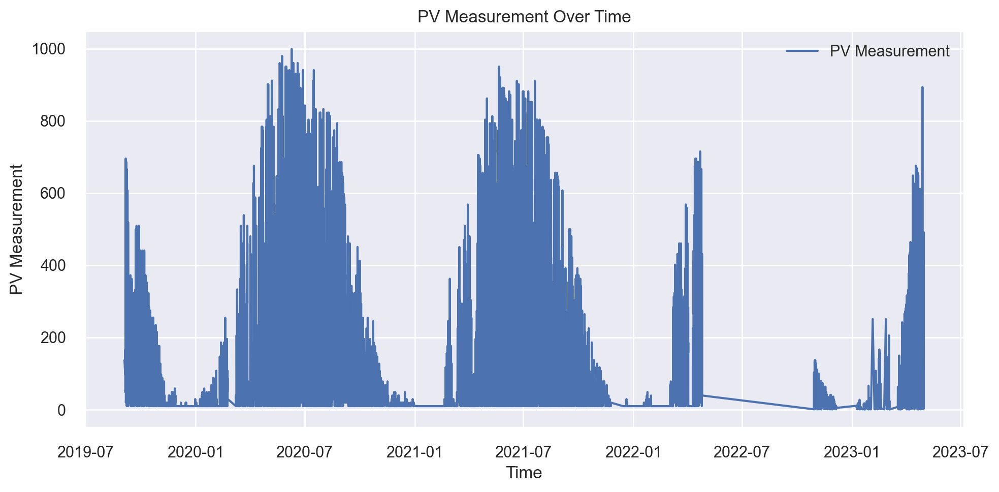

9676 X
9676 y


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     43.5686  5597.1358  74.8140  0.8819  0.4972  0.4870
1     40.4440  4541.1060  67.3877  0.8895  0.5219  0.5782
2     45.8828  5605.9147  74.8727  0.8689  0.4940  0.5179
3     42.0952  4749.3459  68.9155  0.9072  0.5484  0.5809
4     43.0296  4956.5796  70.4030  0.8817  0.5457  0.5988
5     43.3310  4998.8608  70.7026  0.8987  0.5258  0.5624
6     40.6309  4255.4106  65.2335  0.9144  0.5415  0.6140
7     44.4094  5441.8541  73.7689  0.8819  0.5146  0.5839
8     47.7247  6292.6223  79.3261  0.8613  0.5549  0.5938
9     47.2751  5280.2889  72.6656  0.8818  0.4917  0.5246
Mean  43.8391  5171.9119  71.8090  0.8867  0.5236  0.5641
Std    2.3928   565.9105   3.9224  0.0155  0.0226  0.0388
#############################################
Catboost Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     44.6176  5780.2206  76.0278  0.8781  0.4853  0.5248
1     42.4871  4779.5463  69.1343  0.8837  0.5214  0.7080
2     46.7321  5692.4019  75.4480  0.8668  0.4886  0.5449
3     42.7596  4860.4823  69.7172  0.9050  0.5580  0.7017
4     44.1461  5351.3330  73.1528  0.8722  0.5493  0.6473
5     44.9694  5204.3533  72.1412  0.8945  0.5159  0.6063
6     42.2843  4498.9678  67.0743  0.9095  0.5269  0.6785
7     45.1140  5447.6598  73.8083  0.8818  0.4863  0.5522
8     48.8249  6385.2531  79.9078  0.8593  0.5201  0.6017
9     47.4314  5277.6206  72.6472  0.8819  0.5150  0.5928
Mean  44.9366  5327.7839  72.9059  0.8833  0.5167  0.6158
Std    2.0761   519.0794   3.5378  0.0151  0.0237  0.0624
#############################################
LGBM Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     43.2667  5531.7760  74.3759  0.8833  0.4781  0.4925
1     40.6782  4548.0550  67.4393  0.8893  0.4972  0.6113
2     45.3318  5505.5488  74.1994  0.8712  0.4692  0.4986
3     41.6759  4690.1915  68.4850  0.9084  0.5377  0.6242
4     42.9034  5029.1862  70.9168  0.8799  0.5412  0.6095
5     43.3355  4974.8081  70.5323  0.8992  0.5082  0.5598
6     40.6566  4254.6296  65.2275  0.9145  0.5076  0.6292
7     44.3129  5329.9629  73.0066  0.8843  0.4787  0.5406
8     47.5819  6206.2378  78.7797  0.8632  0.5082  0.5625
9     46.7399  5153.1500  71.7854  0.8847  0.4828  0.5372
Mean  43.6483  5122.3546  71.4748  0.8878  0.5009  0.5665
Std    2.2532   532.2873   3.7027  0.0150  0.0234  0.0477
#############################################
Blended
#############################################
Finalized
float64
date_forecast    datetime64[ns]
is_day:idx              float32
dtype:

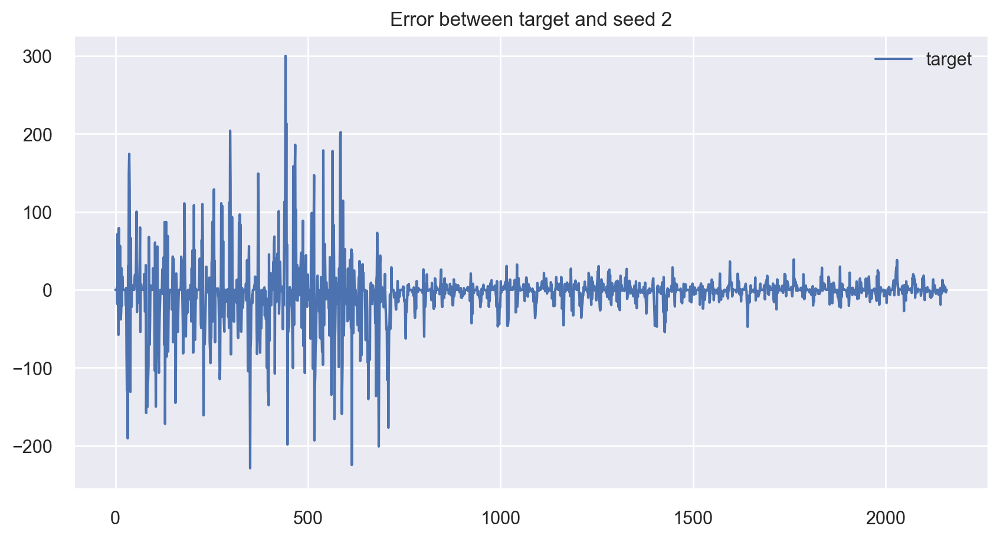

MAE for seed 2: 17.06028291558601


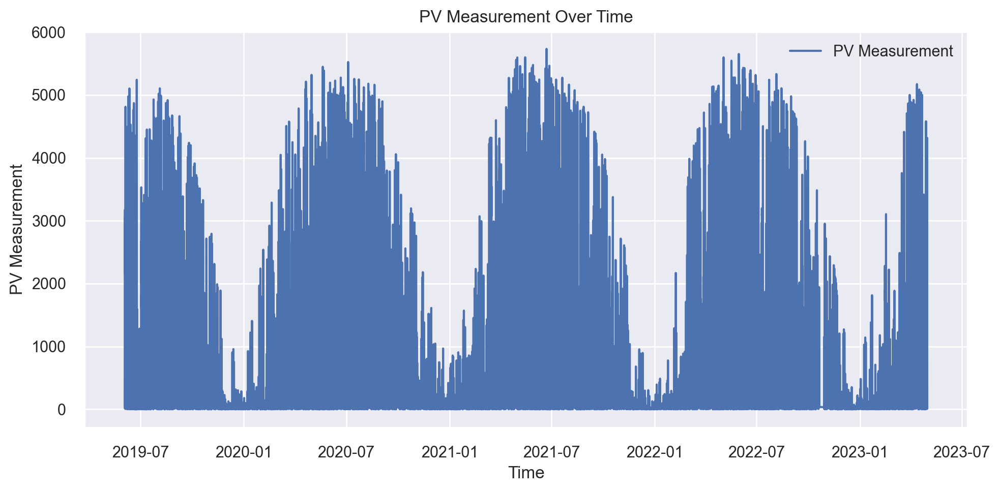

18036 X
18036 y


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     336.5909  296281.7817  544.3177  0.8455  0.9237  3.1286
1     319.3665  259576.8058  509.4868  0.8662  0.9258  3.5300
2     313.4066  257656.4987  507.5988  0.8637  0.9311  2.9607
3     318.7267  281105.3873  530.1937  0.8511  0.9634  3.6576
4     307.9416  245535.8772  495.5158  0.8672  0.9718  5.0123
5     292.4888  207685.6570  455.7254  0.8775  0.9232  3.8658
6     323.4640  266569.0243  516.3032  0.8702  0.8648  2.8407
7     324.1126  268137.2926  517.8197  0.8576  0.9147  3.1933
8     327.9995  276988.0352  526.2965  0.8524  0.9312  3.4319
9     320.7882  260152.6372  510.0516  0.8626  0.9181  4.1256
Mean  318.4885  261968.8997  511.3309  0.8614  0.9268  3.5746
Std    11.3741   22522.6465   22.5739  0.0092  0.0274  0.6119
#############################################
Catboost Done


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     341.3191  304187.8811  551.5323  0.8414  0.8477  2.3766
1     323.6244  269101.0039  518.7495  0.8613  0.8441  2.1273
2     322.8451  271872.0637  521.4135  0.8561  0.8089  2.0854
3     317.4168  283769.8980  532.7006  0.8497  0.8401  2.2511
4     315.9368  262376.8008  512.2273  0.8580  0.8842  2.9313
5     294.0910  222474.9445  471.6725  0.8688  0.8411  2.4530
6     333.1924  284682.1858  533.5562  0.8614  0.8163  2.3880
7     329.2122  281987.8906  531.0253  0.8502  0.8546  2.6306
8     337.6818  295765.4881  543.8433  0.8423  0.8442  2.5346
9     316.0185  267012.3317  516.7324  0.8590  0.8402  3.0135
Mean  323.1338  274323.0488  523.3453  0.8548  0.8421  2.4791
Std    12.8817   21271.2325   20.8032  0.0083  0.0193  0.2943
#############################################
LGBM Done


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     333.5590  293325.6209  541.5954  0.8470  0.8376  2.3045
1     315.9416  258508.6514  508.4375  0.8668  0.8212  2.3977
2     311.6694  257995.0590  507.9321  0.8635  0.8301  2.0024
3     312.2089  276448.7541  525.7839  0.8536  0.8653  2.6879
4     305.4560  247813.5324  497.8087  0.8659  0.8854  3.2891
5     287.5605  209018.8758  457.1858  0.8767  0.8664  2.8031
6     322.6552  268782.4944  518.4424  0.8691  0.7987  2.0087
7     321.3535  269015.5962  518.6671  0.8571  0.8596  2.6318
8     327.8319  280368.3098  529.4982  0.8506  0.8517  2.3773
9     312.8127  257742.0439  507.6830  0.8639  0.8300  2.7087
Mean  315.1049  261901.8938  511.3034  0.8614  0.8446  2.5211
Std    12.1512   21626.8237   21.6957  0.0087  0.0244  0.3687
#############################################
Blended
#############################################
Finalized
float64
date_forecast 

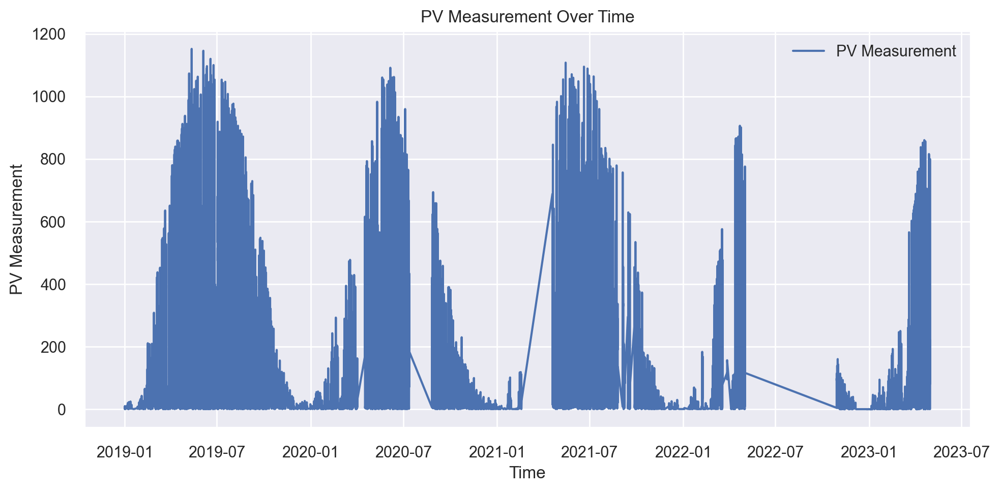

12274 X
12274 y


          MAE        MSE     RMSE      R2   RMSLE     MAPE
Fold                                                      
0     49.6040  6566.5605  81.0343  0.8984  0.7171   1.3460
1     51.2539  7516.2734  86.6964  0.8956  0.7225   2.6719
2     49.8179  6526.2022  80.7849  0.9004  0.7523   2.8875
3     50.2993  6615.2683  81.3343  0.9039  0.7529   1.5077
4     51.1090  7054.4575  83.9908  0.9036  0.7189   1.6958
5     49.4460  6847.3891  82.7490  0.9017  0.7430   1.7693
6     48.6192  6264.2816  79.1472  0.9017  0.7292   1.5446
7     46.9627  5939.6785  77.0693  0.9145  0.6611   1.1698
8     50.1526  7348.7628  85.7249  0.8854  0.7367   1.2665
9     49.2565  6748.2336  82.1476  0.8979  0.7260  59.6559
Mean  49.6521  6742.7107  82.0679  0.9003  0.7260   7.5515
Std    1.1784   451.8600   2.7520  0.0069  0.0249  17.3767
#############################################
Catboost Done


          MAE        MSE     RMSE      R2   RMSLE     MAPE
Fold                                                      
0     49.5902  6791.6400  82.4114  0.8949  0.7158   1.3972
1     51.5632  7743.8508  87.9992  0.8924  0.7394   2.9115
2     50.6195  6721.6865  81.9859  0.8974  0.7630   3.6094
3     51.5809  6867.1934  82.8685  0.9002  0.7363   1.4572
4     51.7828  7309.0404  85.4929  0.9001  0.7154   1.6757
5     49.7689  6998.2963  83.6558  0.8996  0.7463   1.9114
6     50.8315  6862.8321  82.8422  0.8923  0.7015   1.3071
7     49.3737  6292.4443  79.3249  0.9094  0.6809   1.3100
8     51.8533  8115.5950  90.0866  0.8735  0.6972   1.2601
9     49.7087  6763.0325  82.2377  0.8977  0.7352  59.6475
Mean  50.6673  7046.5611  83.8905  0.8958  0.7231   7.6487
Std    0.9422   508.5085   2.9905  0.0088  0.0240  17.3489
#############################################
LGBM Done


          MAE        MSE     RMSE      R2   RMSLE     MAPE
Fold                                                      
0     48.5770  6499.4141  80.6189  0.8994  0.6954   1.3220
1     50.4270  7461.4654  86.3798  0.8963  0.7050   2.1289
2     49.4257  6467.2353  80.4191  0.9013  0.7426   3.1932
3     49.9270  6543.1226  80.8896  0.9049  0.7283   1.4274
4     50.4417  6995.1891  83.6372  0.9044  0.6990   1.6315
5     48.7641  6736.6770  82.0773  0.9033  0.7264   1.6165
6     48.7454  6377.5179  79.8594  0.8999  0.6944   1.3501
7     47.2701  5938.4866  77.0616  0.9145  0.6512   1.1794
8     49.9048  7548.5531  86.8824  0.8823  0.6867   1.2074
9     48.2959  6553.4997  80.9537  0.9009  0.7191  59.5576
Mean  49.1779  6712.1161  81.8779  0.9007  0.7048   7.4614
Std    0.9719   470.2414   2.8507  0.0077  0.0247  17.3748
#############################################
Blended
#############################################
Finalized
float64
date_forecast    datetime64[ns]
is_day:idx              

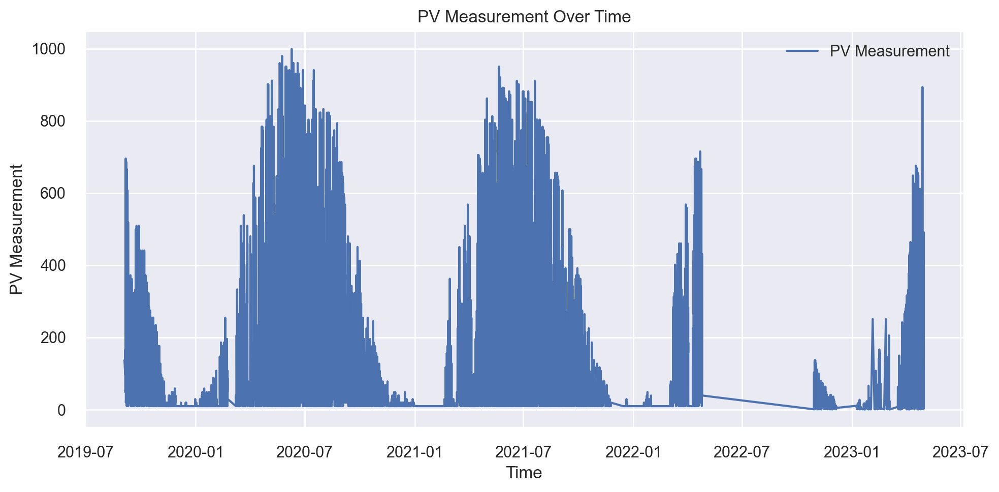

9676 X
9676 y


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     45.8477  5696.9481  75.4781  0.8768  0.5491  0.6526
1     45.8188  5480.0223  74.0272  0.8873  0.5199  0.5415
2     46.9004  5628.4784  75.0232  0.8764  0.4892  0.5207
3     41.3188  4535.4172  67.3455  0.9072  0.5059  0.5495
4     42.5223  4706.3901  68.6031  0.8963  0.5408  0.6257
5     42.9069  4944.0575  70.3140  0.8798  0.6074  0.8781
6     40.7684  4702.5759  68.5753  0.8985  0.5105  0.5872
7     41.9712  4755.6369  68.9611  0.9017  0.5306  0.6152
8     43.8348  5148.6490  71.7541  0.8818  0.4917  0.4955
9     47.9143  6039.1303  77.7118  0.8837  0.5153  0.5570
Mean  43.9804  5163.7306  71.7794  0.8890  0.5260  0.6023
Std    2.3581   489.7247   3.3846  0.0105  0.0328  0.1030
#############################################
Catboost Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     46.2553  5993.7133  77.4191  0.8704  0.5591  0.6455
1     46.4188  5686.2092  75.4070  0.8831  0.5227  0.5357
2     48.4769  5914.5544  76.9061  0.8701  0.5094  0.5999
3     42.9764  4832.9753  69.5196  0.9011  0.4976  0.5627
4     43.9146  5172.1092  71.9174  0.8861  0.5233  0.5988
5     44.2921  5118.6903  71.5450  0.8756  0.5892  0.8606
6     41.6079  4837.9392  69.5553  0.8956  0.5422  0.6849
7     43.4829  5036.7026  70.9697  0.8959  0.5141  0.6362
8     45.6932  5352.9880  73.1641  0.8772  0.5085  0.5666
9     49.5860  6226.1683  78.9061  0.8801  0.5229  0.5470
Mean  45.2704  5417.2050  73.5309  0.8835  0.5289  0.6238
Std    2.3673   477.6469   3.2258  0.0104  0.0261  0.0907
#############################################
LGBM Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     45.0634  5707.9388  75.5509  0.8766  0.5370  0.6205
1     45.3682  5448.6488  73.8150  0.8879  0.5199  0.5224
2     47.0819  5609.1696  74.8944  0.8768  0.4972  0.5405
3     41.3296  4556.9674  67.5053  0.9067  0.4760  0.5258
4     42.3864  4803.3221  69.3060  0.8942  0.5052  0.5813
5     42.9598  4886.5070  69.9036  0.8812  0.5931  0.8409
6     40.5095  4645.9920  68.1615  0.8998  0.5111  0.6220
7     41.9323  4773.4309  69.0900  0.9013  0.5023  0.6113
8     43.7257  5113.9987  71.5122  0.8826  0.4932  0.5112
9     48.0341  5995.1548  77.4284  0.8846  0.5089  0.5396
Mean  43.8391  5154.1130  71.7167  0.8892  0.5144  0.5916
Std    2.3636   475.8011   3.2900  0.0102  0.0304  0.0924
#############################################
Blended
#############################################
Finalized
float64
date_forecast    datetime64[ns]
is_day:idx              float32
dtype:

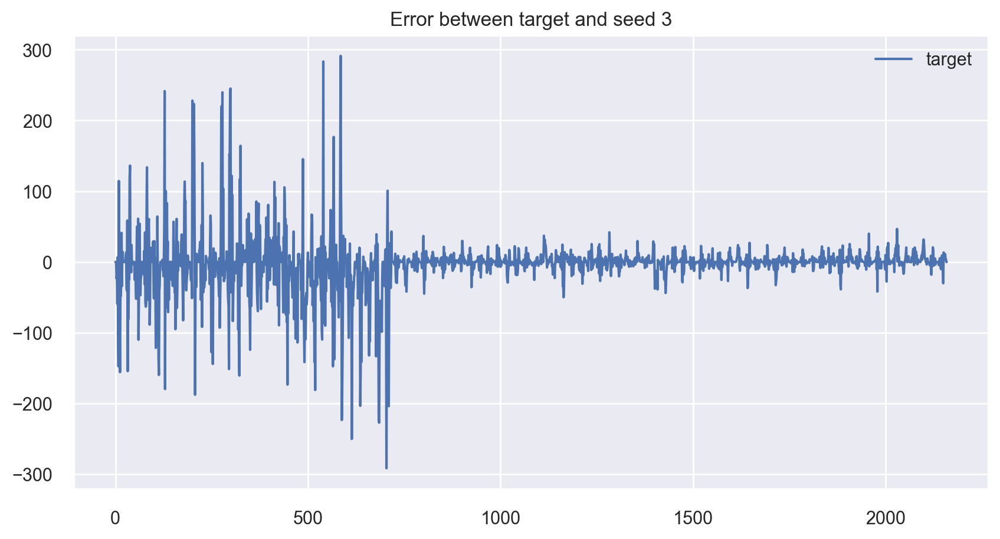

MAE for seed 3: 17.56493781960807


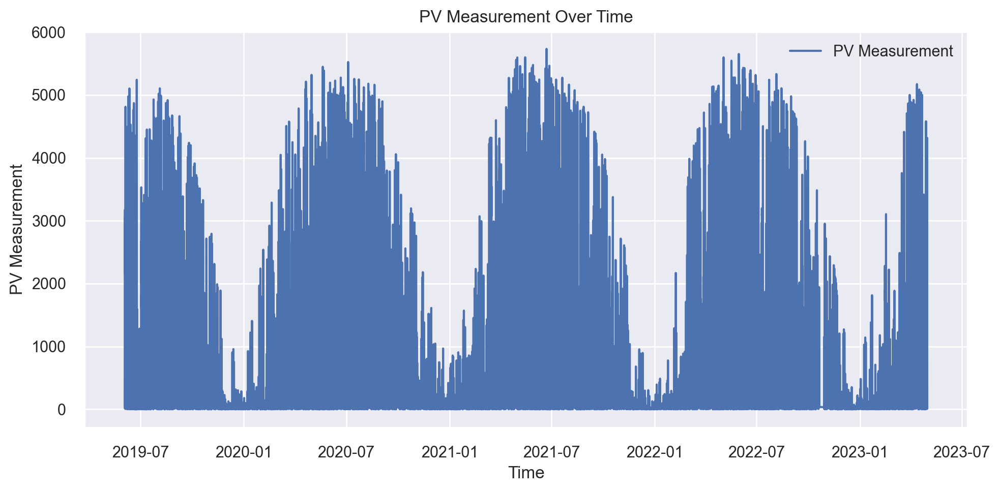

18036 X
18036 y


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     322.2284  270661.7526  520.2516  0.8458  0.9043  3.6613
1     320.1867  264030.5038  513.8390  0.8631  0.9934  4.2554
2     339.8975  274420.6228  523.8517  0.8501  0.8880  2.8158
3     319.5681  261478.5498  511.3497  0.8629  0.9366  3.9861
4     316.2005  263073.5024  512.9069  0.8676  0.9137  3.7093
5     312.8622  252721.0358  502.7137  0.8699  0.9977  4.7081
6     310.3772  254839.7997  504.8166  0.8744  1.0265  5.6296
7     322.4241  258619.8404  508.5468  0.8634  0.9063  3.7951
8     306.8436  259107.1532  509.0257  0.8647  1.0172  4.2245
9     314.4294  244740.9102  494.7130  0.8643  0.9982  4.7965
Mean  318.5018  260369.3671  510.2015  0.8626  0.9582  4.1582
Std     8.6408    8144.2822    7.9893  0.0082  0.0505  0.7281
#############################################
Catboost Done


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     325.2041  278702.6113  527.9229  0.8412  0.8004  2.1463
1     328.8457  283785.3532  532.7151  0.8528  0.9088  2.8500
2     344.0205  282420.3162  531.4323  0.8457  0.7999  1.9467
3     324.6160  283454.0285  532.4040  0.8514  0.8265  2.6433
4     320.0754  275097.6878  524.4976  0.8615  0.8195  2.7078
5     307.6440  248634.8336  498.6330  0.8720  0.9109  3.1372
6     319.1882  276289.4250  525.6324  0.8639  0.8906  2.5077
7     331.2819  277902.2134  527.1643  0.8532  0.8371  2.7584
8     314.2982  274493.5707  523.9213  0.8566  0.8962  2.9573
9     321.5041  264758.3021  514.5467  0.8532  0.8945  3.1408
Mean  323.6678  274553.8342  523.8870  0.8551  0.8585  2.6796
Std     9.4047   10128.1719    9.8126  0.0084  0.0434  0.3725
#############################################
LGBM Done


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     317.5899  268358.8140  518.0336  0.8471  0.8117  2.5900
1     318.4585  267256.7409  516.9688  0.8614  0.9098  3.1015
2     336.7384  272017.4223  521.5529  0.8514  0.8125  2.0612
3     316.7887  266502.9220  516.2392  0.8603  0.8562  3.0779
4     311.4350  262909.0551  512.7466  0.8677  0.8172  2.6711
5     304.0976  244183.7114  494.1495  0.8743  0.8982  3.3127
6     308.8142  259676.0093  509.5842  0.8721  0.9348  3.3847
7     321.3426  260749.6510  510.6365  0.8623  0.8193  2.6822
8     304.1867  260671.4640  510.5600  0.8638  0.8821  2.8746
9     312.3702  248078.9396  498.0752  0.8624  0.8914  3.3963
Mean  315.1822  261040.4730  510.8546  0.8623  0.8633  2.9152
Std     9.0995    8368.1404    8.2466  0.0079  0.0436  0.4027
#############################################
Blended
#############################################
Finalized
float64
date_forecast 

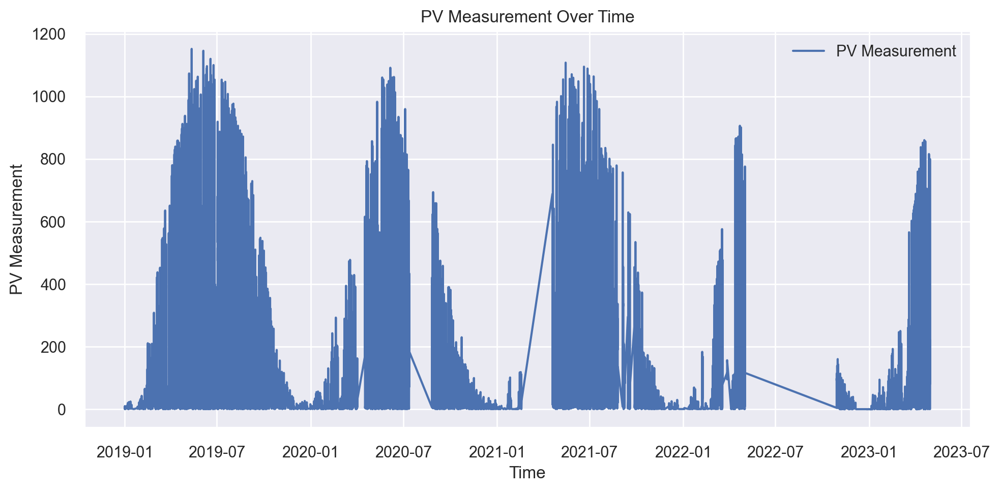

12274 X
12274 y


          MAE        MSE     RMSE      R2   RMSLE     MAPE
Fold                                                      
0     48.6737  6864.2427  82.8507  0.9003  0.7174   1.3042
1     49.7744  6767.6272  82.2656  0.9115  0.6519   1.2609
2     50.1484  6781.5012  82.3499  0.8979  0.7453   2.0268
3     50.0118  7062.2217  84.0370  0.8887  0.6894  90.8453
4     51.9245  7061.5340  84.0329  0.9009  0.7927   1.8409
5     48.1464  6484.7050  80.5277  0.9114  0.6453   1.2603
6     53.5017  8039.6928  89.6643  0.8793  0.7233   3.5923
7     50.6201  6838.1196  82.6929  0.8886  0.7928   2.4052
8     50.6686  7486.3474  86.5237  0.8889  0.6966   1.9494
9     50.3592  6370.2079  79.8136  0.9072  0.7339   1.3410
Mean  50.3829  6975.6200  83.4758  0.8975  0.7189  10.7826
Std    1.4397   461.2754   2.7213  0.0103  0.0481  26.6962
#############################################
Catboost Done


          MAE        MSE     RMSE      R2   RMSLE     MAPE
Fold                                                      
0     49.7279  6852.2505  82.7783  0.9005  0.7327   1.3234
1     52.5258  7239.6877  85.0864  0.9053  0.7040   1.4950
2     52.1358  7403.1831  86.0418  0.8885  0.7342   1.8598
3     50.0640  6944.1802  83.3317  0.8905  0.6559  28.5423
4     52.3186  7057.5323  84.0091  0.9010  0.7926   1.7713
5     48.5253  6706.2314  81.8916  0.9084  0.6511   1.3046
6     55.0137  8434.7221  91.8407  0.8734  0.7116   2.2277
7     53.1995  7451.5373  86.3223  0.8786  0.7975   2.3990
8     51.4116  7583.9770  87.0860  0.8875  0.7197   2.5324
9     51.1759  6645.1770  81.5180  0.9032  0.6986   1.2611
Mean  51.6098  7231.8479  84.9906  0.8937  0.7198   4.4716
Std    1.7721   502.6201   2.9065  0.0112  0.0461   8.0356
#############################################
LGBM Done


          MAE        MSE     RMSE      R2   RMSLE     MAPE
Fold                                                      
0     48.2085  6670.9771  81.6761  0.9031  0.7053   1.2110
1     50.0470  6789.4073  82.3979  0.9112  0.6641   1.2910
2     50.2165  6872.5169  82.9006  0.8965  0.7306   1.4180
3     49.2171  6835.4668  82.6769  0.8922  0.6392  59.6012
4     51.2937  6878.7122  82.9380  0.9035  0.7742   1.7353
5     47.5797  6431.3574  80.1957  0.9121  0.6357   1.2289
6     53.2373  8037.6739  89.6531  0.8794  0.6961   2.8480
7     51.1177  6966.7758  83.4672  0.8865  0.7845   2.3407
8     50.0176  7339.6467  85.6717  0.8911  0.6824   1.7188
9     50.0514  6323.6426  79.5213  0.9079  0.7019   1.2524
Mean  50.0986  6914.6177  83.1099  0.8983  0.7014   7.4645
Std    1.5178   459.5413   2.7147  0.0104  0.0480  17.3865
#############################################
Blended
#############################################
Finalized
float64
date_forecast    datetime64[ns]
is_day:idx              

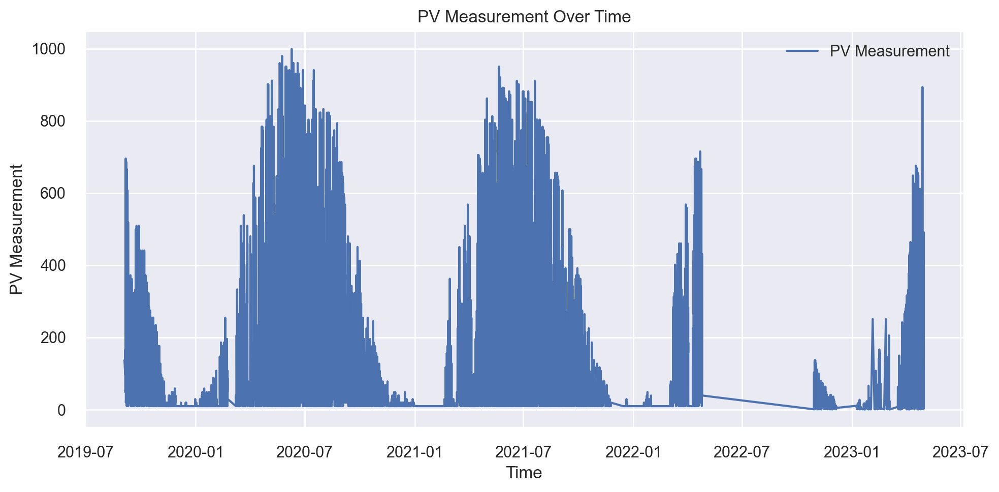

9676 X
9676 y


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     45.8956  6095.3061  78.0724  0.8717  0.5463  0.6283
1     41.6012  4476.3086  66.9052  0.9080  0.5620  0.6045
2     42.3270  4701.9137  68.5705  0.8909  0.5125  0.5889
3     44.1804  4942.3569  70.3019  0.8872  0.4779  0.4770
4     44.4839  5342.3343  73.0913  0.8979  0.5332  0.6448
5     50.0117  6628.2756  81.4142  0.8550  0.5328  0.6047
6     42.6618  4850.0933  69.6426  0.8983  0.4980  0.5412
7     43.2219  5036.8735  70.9709  0.8828  0.5309  0.5496
8     44.2280  5295.4238  72.7697  0.8870  0.5713  0.7140
9     44.3658  4856.9410  69.6918  0.8795  0.5311  0.5825
Mean  44.2977  5222.5827  72.1431  0.8858  0.5296  0.5935
Std    2.2416   630.1383   4.2382  0.0142  0.0266  0.0608
#############################################
Catboost Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     48.2389  6578.4985  81.1079  0.8615  0.5428  0.6657
1     43.9518  5062.7280  71.1528  0.8959  0.5765  0.7031
2     43.2758  4919.4110  70.1385  0.8858  0.5268  0.6552
3     45.3121  5105.5061  71.4528  0.8835  0.4862  0.5135
4     45.6781  5529.9995  74.3640  0.8943  0.5339  0.6667
5     49.7138  6537.1463  80.8526  0.8569  0.5161  0.6047
6     44.2764  5350.8173  73.1493  0.8878  0.5067  0.6446
7     44.6547  5350.0590  73.1441  0.8755  0.5366  0.6265
8     46.4620  5831.5072  76.3643  0.8755  0.5503  0.7105
9     45.2079  4903.6094  70.0258  0.8783  0.5250  0.6259
Mean  45.6771  5516.9282  74.1752  0.8795  0.5301  0.6416
Std    1.8862   585.7558   3.8685  0.0122  0.0234  0.0531
#############################################
LGBM Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     46.2374  6191.3895  78.6854  0.8696  0.5329  0.6262
1     41.9411  4641.6602  68.1297  0.9046  0.5516  0.6301
2     41.6346  4646.3250  68.1640  0.8922  0.4959  0.5814
3     44.0976  4893.9967  69.9571  0.8883  0.4700  0.4762
4     44.2801  5285.5326  72.7017  0.8989  0.5193  0.6384
5     49.2009  6458.4924  80.3647  0.8587  0.4983  0.5663
6     42.6680  4983.6326  70.5948  0.8955  0.4819  0.5661
7     43.1458  5058.5679  71.1236  0.8823  0.5155  0.5654
8     44.5725  5399.0001  73.4779  0.8848  0.5370  0.6754
9     43.8827  4748.8387  68.9118  0.8822  0.5062  0.5693
Mean  44.1661  5230.7436  72.2111  0.8857  0.5109  0.5895
Std    2.1106   598.8675   4.0378  0.0130  0.0241  0.0527
#############################################
Blended
#############################################
Finalized
float64
date_forecast    datetime64[ns]
is_day:idx              float32
dtype:

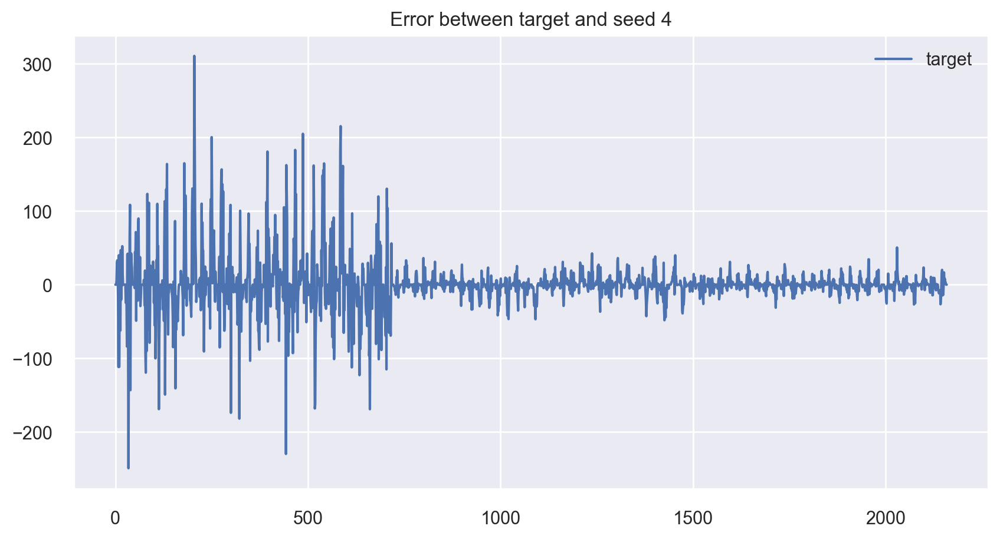

MAE for seed 4: 16.58434649496888


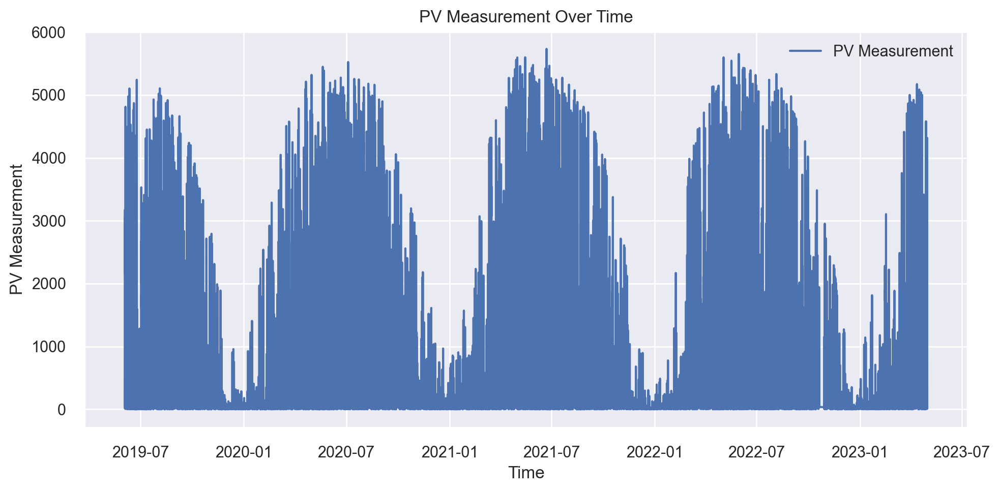

18036 X
18036 y


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     315.2666  271232.5936  520.8000  0.8550  0.9465  3.2763
1     330.2708  287573.1986  536.2585  0.8489  0.9750  4.4921
2     318.3095  253412.5345  503.4010  0.8727  0.9429  3.4742
3     323.9233  266870.6738  516.5953  0.8658  0.9537  4.1335
4     313.8631  240210.0347  490.1123  0.8751  0.9341  3.4683
5     328.6918  283429.6037  532.3811  0.8430  0.9275  3.6974
6     316.0071  256812.2748  506.7665  0.8675  0.9543  4.1677
7     301.0084  217483.3846  466.3511  0.8763  0.9021  3.4412
8     314.4865  246609.6697  496.5981  0.8745  0.9248  3.6290
9     320.3889  278965.2937  528.1717  0.8492  0.9356  4.2467
Mean  318.2216  260259.9262  509.7435  0.8628  0.9396  3.8026
Std     7.9681   20673.1087   20.5292  0.0120  0.0188  0.3980
#############################################
Catboost Done


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     324.4488  282417.6852  531.4298  0.8491  0.8921  2.6078
1     334.3601  312430.1672  558.9545  0.8359  0.8866  3.4956
2     320.3156  261564.3436  511.4336  0.8686  0.8468  2.5012
3     328.7875  285466.2240  534.2904  0.8565  0.8495  2.6782
4     321.9654  257230.5228  507.1790  0.8663  0.8309  2.7981
5     330.3460  291239.3705  539.6660  0.8386  0.8553  2.8164
6     317.9770  274632.5469  524.0540  0.8584  0.8465  2.2231
7     315.1742  243899.4392  493.8618  0.8612  0.8459  2.8062
8     320.8815  260484.9355  510.3772  0.8674  0.8584  2.8118
9     329.5509  298548.0312  546.3955  0.8386  0.8246  2.3493
Mean  324.3807  276791.3266  525.7642  0.8541  0.8537  2.7088
Std     5.8455   20065.0390   19.0618  0.0120  0.0203  0.3284
#############################################
LGBM Done


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     313.8673  270459.9548  520.0576  0.8555  0.8399  2.3243
1     327.7541  293465.0388  541.7241  0.8458  0.8806  3.3281
2     313.4348  250127.3198  500.1273  0.8743  0.8509  2.4444
3     320.5791  269468.7373  519.1038  0.8645  0.8581  2.7330
4     311.1078  241590.4817  491.5185  0.8744  0.8356  2.6992
5     323.9753  280372.3973  529.5020  0.8447  0.8611  2.8803
6     311.1495  259602.7421  509.5123  0.8661  0.8540  2.6697
7     301.6287  223751.4126  473.0237  0.8727  0.8169  2.4028
8     311.6764  247493.3660  497.4871  0.8741  0.8634  2.9451
9     319.6461  282518.2949  531.5245  0.8473  0.8593  3.0136
Mean  315.4819  261884.9745  511.3581  0.8619  0.8520  2.7441
Std     7.1914   20279.2192   19.9468  0.0119  0.0167  0.2937
#############################################
Blended
#############################################
Finalized
float64
date_forecast 

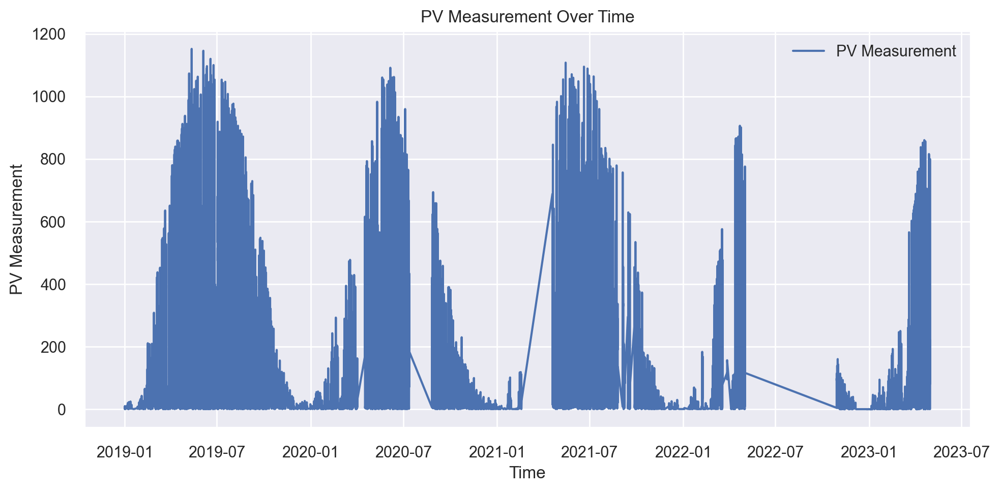

12274 X
12274 y


          MAE        MSE     RMSE      R2   RMSLE     MAPE
Fold                                                      
0     50.0523  6256.6374  79.0989  0.9059  0.7294   1.5302
1     49.9083  6801.8777  82.4735  0.8986  0.7460   1.7837
2     50.3041  6892.6476  83.0220  0.8882  0.7601   2.1284
3     48.3548  6429.2062  80.1823  0.9101  0.7030   1.8218
4     47.0585  6956.7700  83.4073  0.8995  0.6785   1.1984
5     53.5886  7865.5502  88.6879  0.8884  0.7370   1.3907
6     54.8999  8196.1468  90.5326  0.8904  0.7461   1.8955
7     48.6859  6535.9240  80.8451  0.9100  0.7682  88.0663
8     47.7913  6167.0607  78.5306  0.9102  0.7392   2.9935
9     51.4904  7287.2393  85.3653  0.8908  0.6754   1.4484
Mean  50.2134  6938.9060  83.2145  0.8992  0.7283  10.4257
Std    2.3816   637.5986   3.7742  0.0089  0.0306  25.8846
#############################################
Catboost Done


          MAE        MSE     RMSE      R2   RMSLE     MAPE
Fold                                                      
0     51.2677  6681.8388  81.7425  0.8995  0.6866   1.3531
1     50.8750  6998.6478  83.6579  0.8957  0.7336   1.7802
2     50.3618  6962.8786  83.4439  0.8870  0.7180   2.0857
3     49.2635  6800.4127  82.4646  0.9049  0.7128   2.3918
4     48.7121  7445.6224  86.2880  0.8925  0.6900   1.3325
5     53.6122  7804.0842  88.3407  0.8893  0.7291   1.4857
6     54.9858  8175.9400  90.4209  0.8906  0.7437   1.8387
7     50.0872  6848.2904  82.7544  0.9057  0.7657  71.6555
8     50.6674  6992.0941  83.6187  0.8981  0.7406   2.7812
9     51.9064  7765.9819  88.1248  0.8836  0.7147   1.5134
Mean  51.1739  7247.5791  85.0857  0.8947  0.7235   8.8218
Std    1.8143   486.5449   2.8304  0.0070  0.0231  20.9493
#############################################
LGBM Done


          MAE        MSE     RMSE      R2   RMSLE     MAPE
Fold                                                      
0     49.7068  6294.2365  79.3362  0.9053  0.6756   1.3438
1     49.1181  6681.7405  81.7419  0.9004  0.7117   1.7030
2     49.5578  6747.3832  82.1425  0.8905  0.7133   1.9801
3     47.9029  6418.9925  80.1186  0.9103  0.6807   1.6533
4     47.0650  7031.8346  83.8560  0.8984  0.6627   1.2123
5     52.6831  7631.9803  87.3612  0.8917  0.7120   1.3814
6     54.1105  7981.6599  89.3401  0.8932  0.7215   1.7468
7     48.4703  6488.0083  80.5482  0.9106  0.7525  79.7742
8     48.3109  6385.1976  79.9074  0.9070  0.7300   2.4574
9     50.9144  7340.0217  85.6739  0.8900  0.6896   1.4418
Mean  49.7840  6900.1055  83.0026  0.8998  0.7049   9.4694
Std    2.0911   549.6170   3.2668  0.0078  0.0261  23.4374
#############################################
Blended
#############################################
Finalized
float64
date_forecast    datetime64[ns]
is_day:idx              

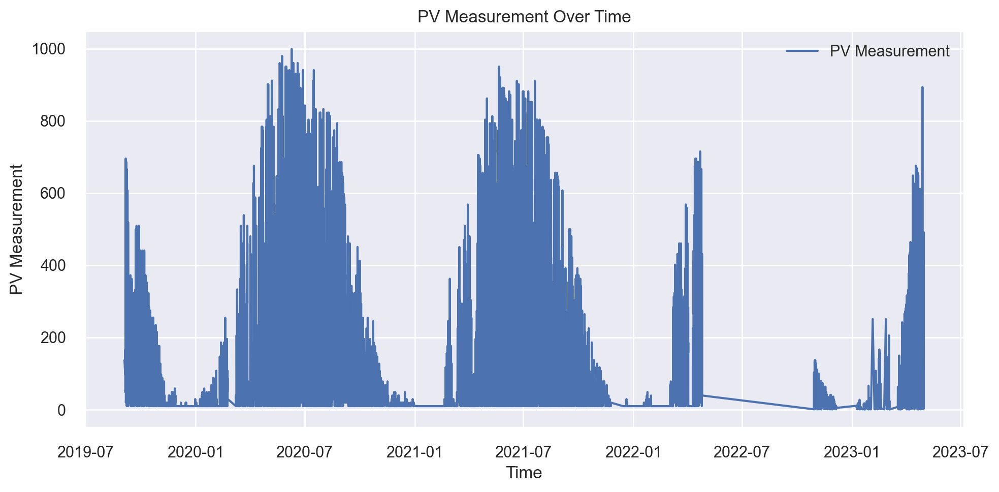

9676 X
9676 y


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     46.0940  5571.5263  74.6427  0.8658  0.5381  0.5624
1     46.1524  5754.0747  75.8556  0.8851  0.5300  0.5592
2     46.2582  5873.1851  76.6367  0.8719  0.5057  0.5301
3     40.9707  4610.2734  67.8990  0.8986  0.5196  0.6242
4     41.3650  4653.7405  68.2183  0.9014  0.5178  0.5719
5     40.3147  4362.1539  66.0466  0.9099  0.5337  0.5269
6     45.0373  5676.6904  75.3438  0.8824  0.4803  0.5009
7     40.1765  4021.4308  63.4148  0.9158  0.5225  0.6428
8     45.9727  5742.8387  75.7815  0.8698  0.5405  0.6067
9     41.0401  4217.0058  64.9385  0.9083  0.4746  0.4581
Mean  43.3382  5048.2920  70.8777  0.8909  0.5163  0.5583
Std    2.6036   699.5305   4.9636  0.0173  0.0218  0.0540
#############################################
Catboost Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     46.5810  5646.9485  75.1462  0.8640  0.5354  0.6231
1     46.6991  5689.6959  75.4301  0.8863  0.5192  0.5884
2     47.3733  5935.0252  77.0391  0.8705  0.5037  0.5857
3     43.1513  5165.8987  71.8742  0.8863  0.5422  0.7429
4     41.6663  4567.8092  67.5856  0.9032  0.5157  0.5867
5     42.7695  4676.4245  68.3844  0.9034  0.5000  0.5216
6     46.4330  5717.5398  75.6144  0.8815  0.5176  0.5707
7     42.6143  4657.9804  68.2494  0.9024  0.5570  0.7233
8     47.6739  6195.3384  78.7105  0.8596  0.5411  0.6844
9     41.6064  4315.2889  65.6909  0.9062  0.4938  0.5049
Mean  44.6568  5256.7949  72.3725  0.8864  0.5226  0.6132
Std    2.3613   629.0926   4.3613  0.0165  0.0196  0.0762
#############################################
LGBM Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     45.7300  5467.1051  73.9399  0.8684  0.5238  0.5756
1     45.7075  5581.6941  74.7107  0.8885  0.5177  0.5612
2     45.7012  5724.9301  75.6633  0.8751  0.4832  0.5382
3     41.2905  4755.2976  68.9587  0.8954  0.5122  0.6699
4     40.6579  4482.1179  66.9486  0.9051  0.5012  0.5580
5     40.7281  4357.6508  66.0125  0.9100  0.4911  0.4753
6     45.0863  5572.2271  74.6474  0.8845  0.4877  0.5106
7     40.5699  4207.1244  64.8623  0.9119  0.5230  0.6408
8     45.8678  5846.3626  76.4615  0.8675  0.5251  0.6234
9     40.5466  4143.6103  64.3709  0.9099  0.4664  0.4633
Mean  43.1886  5013.8120  70.6576  0.8916  0.5031  0.5616
Std    2.4453   650.1302   4.6172  0.0165  0.0193  0.0650
#############################################
Blended
#############################################
Finalized
float64
date_forecast    datetime64[ns]
is_day:idx              float32
dtype:

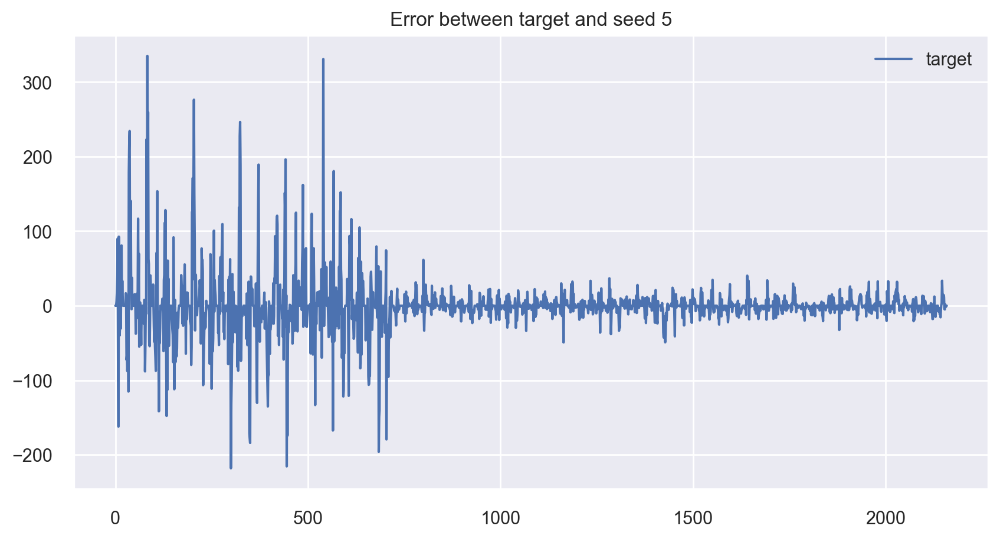

MAE for seed 5: 17.20544713484246


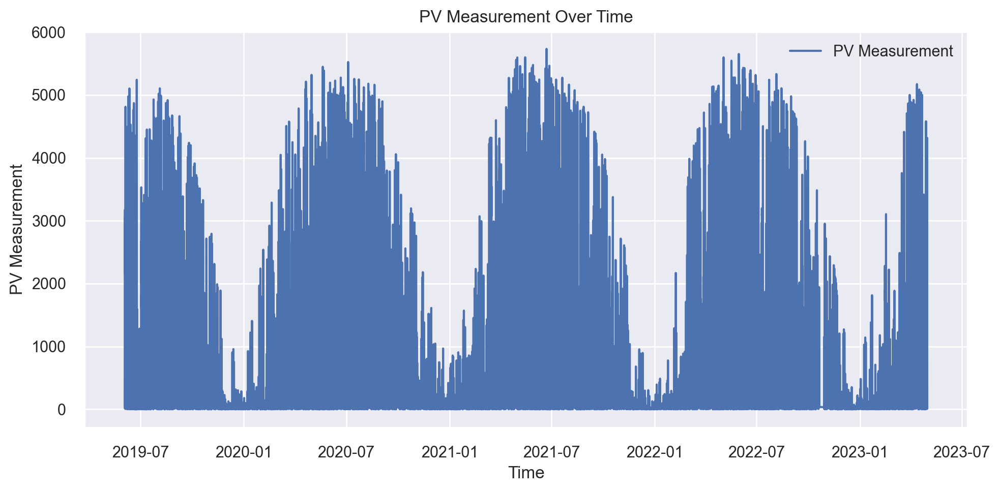

18036 X
18036 y


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     302.6131  238289.6404  488.1492  0.8705  0.9631  3.9096
1     302.9564  240485.2311  490.3929  0.8673  0.9878  4.7736
2     317.5320  260426.9231  510.3204  0.8596  0.9346  3.0207
3     324.5528  279369.5078  528.5542  0.8479  0.9504  3.7764
4     318.6903  266129.0638  515.8770  0.8765  0.9328  3.8167
5     328.1870  280796.0444  529.9019  0.8525  0.9416  3.6305
6     319.6645  265728.9527  515.4890  0.8566  0.9199  3.6011
7     316.0638  238988.4146  488.8644  0.8784  0.8855  3.7363
8     303.7507  243819.8172  493.7811  0.8726  0.9398  4.0104
9     325.5495  265462.0024  515.2300  0.8600  0.9658  4.2484
Mean  315.9560  257949.5598  507.6560  0.8642  0.9421  3.8524
Std     9.1392   15561.0516   15.3271  0.0099  0.0265  0.4311
#############################################
Catboost Done


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     306.6482  248596.9922  498.5950  0.8649  0.8634  2.6197
1     314.2065  262380.1379  512.2306  0.8553  0.8955  3.0842
2     320.3131  266381.4696  516.1216  0.8564  0.8569  2.6676
3     327.9024  296865.3913  544.8536  0.8384  0.8099  2.4906
4     330.5726  283177.5562  532.1443  0.8686  0.8664  3.1779
5     332.0502  290599.4584  539.0728  0.8473  0.8530  2.5308
6     323.5443  269839.1028  519.4604  0.8544  0.8524  2.6633
7     322.1960  254429.2560  504.4098  0.8705  0.8305  2.5360
8     312.7251  259314.4354  509.2293  0.8645  0.8260  2.3638
9     319.9992  267779.4856  517.4741  0.8588  0.8404  2.4482
Mean  321.0158  269936.3285  519.3591  0.8579  0.8494  2.6582
Std     7.6900   14867.8348   14.2273  0.0094  0.0229  0.2536
#############################################
LGBM Done


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     299.6835  237509.5442  487.3495  0.8709  0.8635  2.6729
1     303.0173  245601.0791  495.5816  0.8645  0.9129  3.5038
2     313.2428  256892.4560  506.8456  0.8615  0.8737  2.5399
3     320.8240  281589.6410  530.6502  0.8467  0.8424  2.8754
4     319.6426  268565.2161  518.2328  0.8754  0.8513  3.2444
5     324.6246  279265.8336  528.4561  0.8533  0.8676  2.4894
6     315.2819  261431.5620  511.3038  0.8589  0.8294  2.4136
7     314.3143  241387.7471  491.3123  0.8771  0.8375  2.5745
8     302.1382  245337.2170  495.3153  0.8718  0.8393  2.6780
9     316.8725  260971.5332  510.8537  0.8624  0.8761  2.8998
Mean  312.9642  257855.1829  507.5901  0.8643  0.8594  2.7892
Std     8.1081   14669.2135   14.4047  0.0093  0.0236  0.3321
#############################################
Blended
#############################################
Finalized
float64
date_forecast 

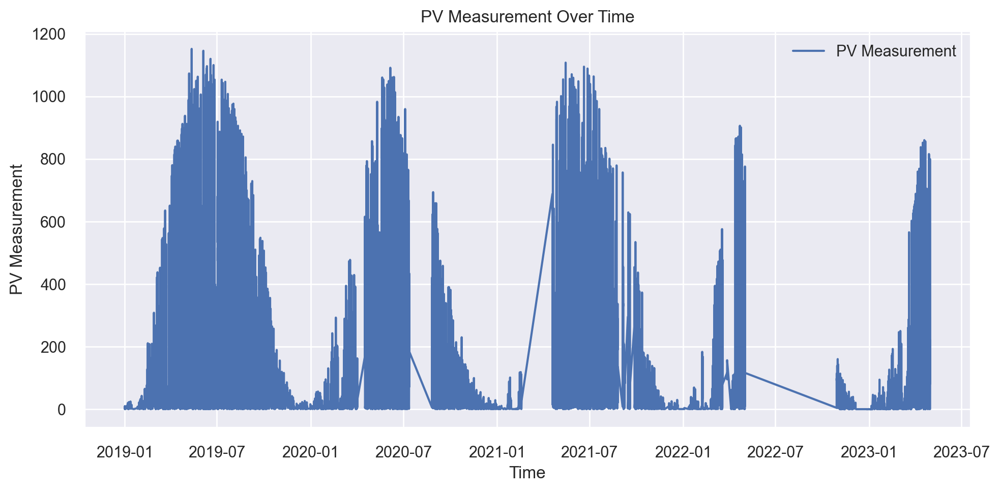

12274 X
12274 y


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     49.4886  7459.8094  86.3702  0.8914  0.7206  1.8176
1     52.2721  8067.8556  89.8212  0.8811  0.8024  1.5919
2     47.0361  5640.7377  75.1048  0.9165  0.7481  1.7636
3     47.3505  5699.9162  75.4978  0.9088  0.6820  1.3530
4     48.3496  6708.1313  81.9032  0.9010  0.7399  2.2937
5     51.8772  7186.7635  84.7748  0.8871  0.6788  1.3874
6     54.8820  7635.7619  87.3828  0.8871  0.7665  2.8759
7     50.0428  6624.4616  81.3908  0.9010  0.6810  1.2733
8     50.1374  7106.6898  84.3012  0.8960  0.6786  1.2615
9     50.2663  6941.3757  83.3149  0.8951  0.6733  1.2874
Mean  50.1702  6907.1503  82.9862  0.8965  0.7171  1.6905
Std    2.2608   740.5033   4.5216  0.0102  0.0432  0.5027
#############################################
Catboost Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     50.7963  7451.9186  86.3245  0.8915  0.7360  2.8127
1     51.7098  7994.3982  89.4114  0.8822  0.7672  1.4412
2     48.8169  6270.9622  79.1894  0.9072  0.7149  1.6524
3     48.8728  6393.6061  79.9600  0.8977  0.6470  1.2560
4     49.7713  7008.9835  83.7197  0.8966  0.7462  2.3364
5     52.5929  7302.3612  85.4539  0.8853  0.6893  1.4217
6     56.5223  8207.9432  90.5977  0.8786  0.7364  2.5822
7     51.4390  6923.0468  83.2048  0.8965  0.6972  1.2838
8     53.1271  7784.2054  88.2281  0.8861  0.6964  1.4115
9     51.4173  7180.0811  84.7354  0.8915  0.6597  1.2624
Mean  51.5066  7251.7506  85.0825  0.8913  0.7090  1.7460
Std    2.1611   605.1812   3.5666  0.0081  0.0364  0.5650
#############################################
LGBM Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     48.9983  7276.9610  85.3051  0.8940  0.7035  2.1667
1     50.9306  7826.3163  88.4665  0.8847  0.7612  1.3820
2     46.9053  5780.2745  76.0281  0.9145  0.7067  1.6479
3     46.9732  5833.9289  76.3802  0.9066  0.6402  1.2282
4     48.0779  6676.5586  81.7102  0.9015  0.7240  1.7540
5     51.4885  7069.2639  84.0789  0.8890  0.6741  1.3664
6     54.8101  7711.4021  87.8146  0.8859  0.7393  2.6843
7     49.9838  6597.8224  81.2270  0.9014  0.6811  1.2335
8     50.6833  7239.4230  85.0848  0.8940  0.6594  1.2907
9     50.0796  6916.0696  83.1629  0.8955  0.6332  1.1533
Mean  49.8931  6892.8020  82.9258  0.8967  0.6923  1.5907
Std    2.2364   658.3057   4.0137  0.0089  0.0400  0.4682
#############################################
Blended
#############################################
Finalized
float64
date_forecast    datetime64[ns]
is_day:idx              float32
dtype:

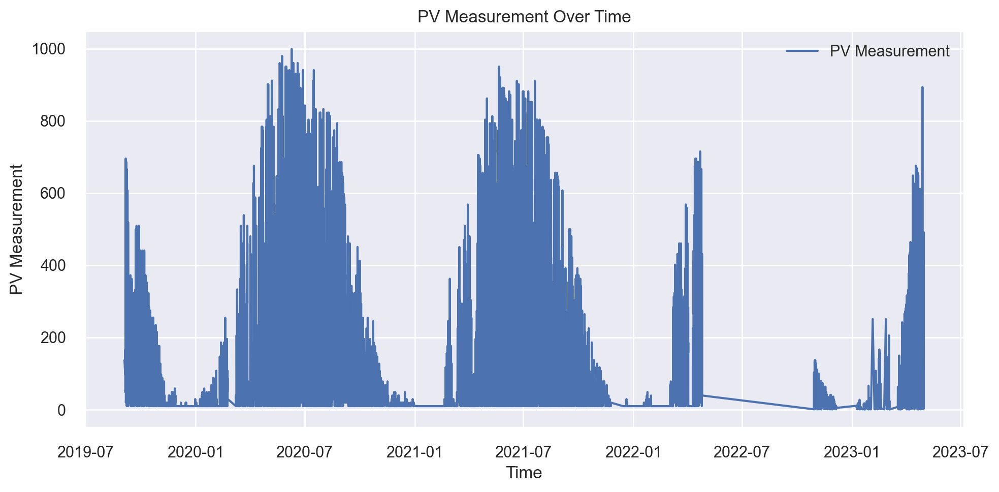

9676 X
9676 y


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     44.6200  5099.2525  71.4091  0.8908  0.5192  0.5886
1     46.5701  5298.6399  72.7918  0.8858  0.5183  0.5682
2     43.1504  5319.8566  72.9373  0.8809  0.5310  0.6401
3     44.0072  5255.2123  72.4928  0.8843  0.5505  0.6148
4     43.1133  4762.0550  69.0076  0.8942  0.4615  0.4828
5     43.3321  4972.9135  70.5189  0.8954  0.5215  0.5057
6     43.7699  5212.8302  72.1999  0.8810  0.5460  0.6365
7     45.5359  5815.5573  76.2598  0.8840  0.5551  0.6981
8     44.6777  4973.0130  70.5196  0.8937  0.5051  0.5787
9     46.6171  6104.8580  78.1336  0.8730  0.5037  0.5036
Mean  44.5394  5281.4188  72.6270  0.8863  0.5212  0.5817
Std    1.2552   382.5878   2.5945  0.0068  0.0262  0.0655
#############################################
Catboost Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     45.5526  5230.3274  72.3210  0.8880  0.5227  0.6201
1     47.0218  5559.5051  74.5621  0.8802  0.4975  0.5435
2     44.2328  5485.0267  74.0610  0.8772  0.5256  0.6459
3     47.0194  5780.1787  76.0275  0.8728  0.5689  0.7372
4     45.2508  5048.6449  71.0538  0.8878  0.4667  0.5169
5     45.0288  5339.5972  73.0725  0.8877  0.5013  0.5503
6     46.7994  5961.6341  77.2116  0.8640  0.5627  0.6949
7     47.2375  5889.2592  76.7415  0.8826  0.5708  0.7699
8     45.3802  5170.6554  71.9073  0.8895  0.5465  0.7214
9     47.1908  6131.8593  78.3062  0.8724  0.4934  0.5615
Mean  46.0714  5559.6688  74.5264  0.8802  0.5256  0.6362
Std    1.0408   349.4536   2.3403  0.0081  0.0341  0.0865
#############################################
LGBM Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     44.2864  5001.1382  70.7187  0.8929  0.5006  0.5762
1     46.1780  5308.3758  72.8586  0.8856  0.4848  0.5307
2     43.0663  5286.0567  72.7053  0.8817  0.5081  0.6177
3     44.7548  5347.7175  73.1281  0.8823  0.5478  0.6532
4     43.4594  4766.9618  69.0432  0.8941  0.4468  0.4827
5     43.4511  5013.9703  70.8094  0.8945  0.4852  0.5070
6     44.3307  5412.1053  73.5670  0.8765  0.5366  0.6244
7     45.4877  5685.2483  75.4006  0.8866  0.5583  0.7185
8     44.1875  4921.3092  70.1520  0.8948  0.5075  0.6263
9     46.0611  5970.2018  77.2671  0.8758  0.4851  0.5181
Mean  44.5263  5271.3085  72.5650  0.8865  0.5061  0.5855
Std    1.0343   346.8619   2.3726  0.0070  0.0320  0.0713
#############################################
Blended
#############################################
Finalized
float64
date_forecast    datetime64[ns]
is_day:idx              float32
dtype:

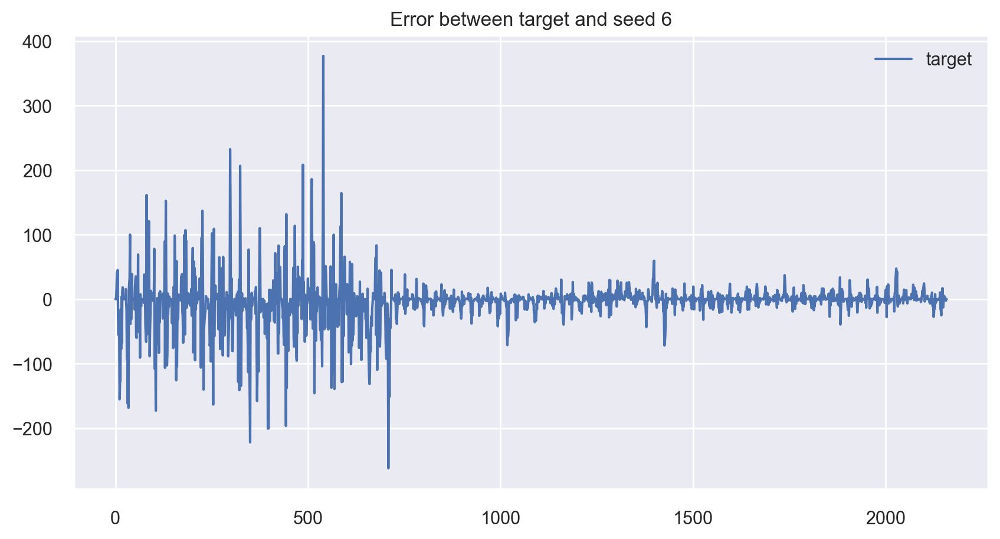

MAE for seed 6: 16.990003950172387


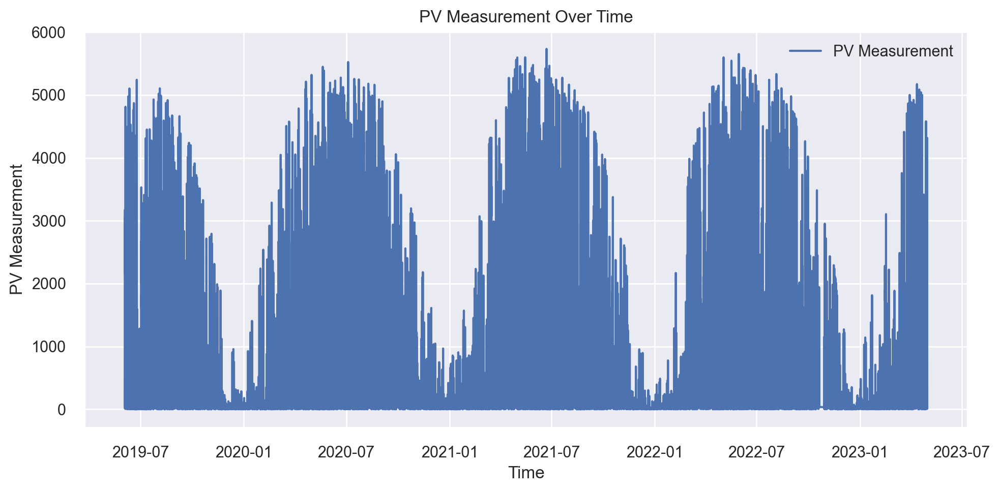

18036 X
18036 y


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     321.3083  262473.4687  512.3216  0.8549  0.9604  4.2480
1     322.6784  272635.8028  522.1454  0.8625  0.9035  2.9740
2     314.4520  251241.1339  501.2396  0.8646  0.9051  3.3592
3     336.2850  275497.0481  524.8781  0.8540  0.8840  3.3581
4     303.3133  243282.0948  493.2363  0.8695  0.9543  4.1660
5     318.8151  254882.4389  504.8588  0.8636  0.9766  4.4506
6     302.3453  218458.4194  467.3954  0.8848  0.9591  4.3588
7     335.6743  289801.4883  538.3321  0.8421  1.0215  5.1469
8     305.8756  256191.6780  506.1538  0.8578  0.9687  4.9844
9     334.4118  292173.8084  540.5310  0.8532  0.9705  3.7632
Mean  319.5159  261663.7381  511.1092  0.8607  0.9504  4.0809
Std    12.4376   21033.6498   20.7628  0.0109  0.0392  0.6761
#############################################
Catboost Done


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     326.0661  280712.9150  529.8235  0.8448  0.8572  3.4908
1     337.5145  296906.7053  544.8915  0.8503  0.8329  2.0480
2     325.4507  270620.5742  520.2120  0.8541  0.8606  2.7240
3     342.9512  296576.6306  544.5885  0.8429  0.8238  1.9803
4     314.7043  267897.3772  517.5880  0.8563  0.8451  2.6773
5     323.1433  269083.7407  518.7328  0.8560  0.8455  2.7981
6     312.2733  236249.8536  486.0554  0.8754  0.8367  2.3909
7     342.4469  300354.9637  548.0465  0.8363  0.8807  2.6170
8     316.8366  275949.0747  525.3086  0.8469  0.8928  3.2560
9     333.2632  297100.0469  545.0688  0.8507  0.8538  2.8852
Mean  327.4650  279145.1882  528.0316  0.8514  0.8529  2.6868
Std    10.6309   18827.2565   18.1068  0.0100  0.0202  0.4498
#############################################
LGBM Done


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     319.2281  265073.8653  514.8532  0.8534  0.8709  3.3446
1     323.9873  278433.1909  527.6677  0.8596  0.7957  2.0030
2     315.0176  254327.8382  504.3093  0.8629  0.8452  2.5507
3     334.3779  279435.1659  528.6163  0.8520  0.8218  2.3672
4     302.3594  249245.5791  499.2450  0.8663  0.8556  2.7442
5     315.2719  255856.4368  505.8225  0.8631  0.8633  3.1505
6     301.9232  221467.6406  470.6035  0.8832  0.8629  2.8761
7     333.3837  288939.0277  537.5305  0.8425  0.9137  3.2189
8     305.2591  259641.6791  509.5505  0.8559  0.8815  3.3888
9     329.4977  288804.8860  537.4057  0.8548  0.8605  2.7368
Mean  318.0306  264122.5310  513.5604  0.8594  0.8571  2.8381
Std    11.6456   19723.9948   19.4481  0.0103  0.0304  0.4272
#############################################
Blended
#############################################
Finalized
float64
date_forecast 

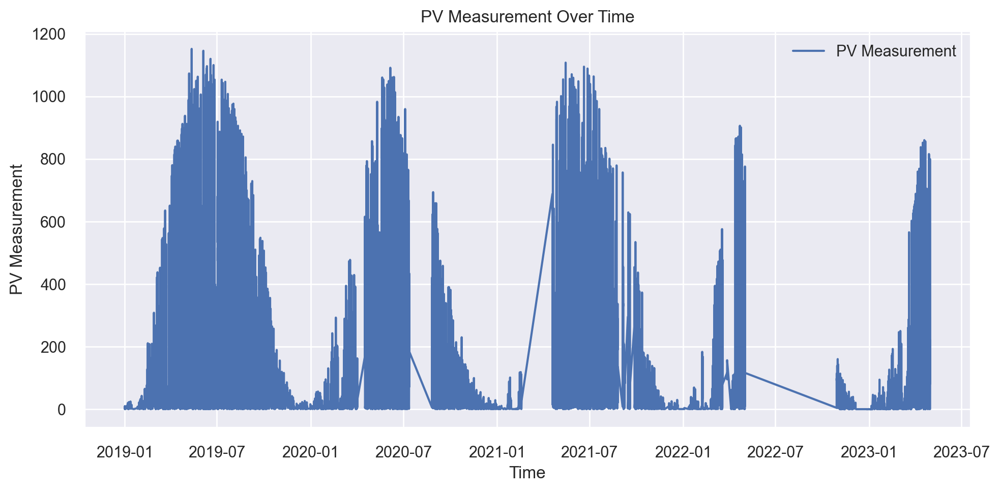

12274 X
12274 y


          MAE        MSE     RMSE      R2   RMSLE     MAPE
Fold                                                      
0     50.1343  6778.2172  82.3299  0.9015  0.7089  37.0913
1     50.6389  6717.0151  81.9574  0.9053  0.7055   2.4800
2     48.5930  6238.5447  78.9845  0.9092  0.7583   1.5267
3     50.1423  6917.0821  83.1690  0.9082  0.6872   1.4140
4     51.7070  7823.1914  88.4488  0.8856  0.7245   3.2518
5     52.3712  6995.8676  83.6413  0.8952  0.6967   1.5367
6     46.5652  5694.0760  75.4591  0.9115  0.7348   2.1301
7     53.0870  7733.5773  87.9408  0.8829  0.7599   1.4676
8     45.3085  5315.8591  72.9099  0.9250  0.7092   1.5159
9     50.4381  7299.7089  85.4383  0.8938  0.6968   1.4158
Mean  49.8986  6751.3139  82.0279  0.9018  0.7182   5.3830
Std    2.3322   771.0318   4.7683  0.0121  0.0242  10.5849
#############################################
Catboost Done


          MAE        MSE     RMSE      R2   RMSLE     MAPE
Fold                                                      
0     51.4260  7015.0021  83.7556  0.8981  0.6947  63.1248
1     49.6926  6642.0940  81.4990  0.9064  0.7088   1.5933
2     50.3374  6604.9237  81.2707  0.9039  0.7496   1.7460
3     50.5467  7203.8276  84.8754  0.9044  0.6811   1.3827
4     53.5075  8589.2263  92.6781  0.8744  0.7346   2.8398
5     54.0936  7451.7416  86.3235  0.8883  0.7179   1.5664
6     47.4040  5899.2169  76.8064  0.9083  0.7255   2.0674
7     53.9082  8031.9488  89.6211  0.8784  0.7497   1.5184
8     47.7182  6121.8445  78.2422  0.9136  0.7303   1.5996
9     51.9399  7531.1931  86.7824  0.8904  0.6916   1.5067
Mean  51.0574  7109.1019  84.1854  0.8966  0.7184   7.8945
Std    2.2672   791.6184   4.6812  0.0125  0.0227  18.4145
#############################################
LGBM Done


          MAE        MSE     RMSE      R2   RMSLE     MAPE
Fold                                                      
0     49.7869  6719.5496  81.9729  0.9024  0.6796  50.0145
1     49.3910  6522.7053  80.7633  0.9081  0.6808   1.6989
2     48.6112  6243.5253  79.0160  0.9092  0.7265   1.5660
3     49.5003  6860.5573  82.8285  0.9090  0.6686   1.3243
4     51.5135  8013.6199  89.5188  0.8828  0.7109   2.9866
5     52.4025  7026.6578  83.8252  0.8947  0.6921   1.4411
6     46.1737  5621.1559  74.9744  0.9127  0.7092   1.9977
7     52.7604  7677.7707  87.6229  0.8838  0.7374   1.4394
8     45.5823  5532.4861  74.3807  0.9219  0.7081   1.4665
9     50.1302  7231.3720  85.0375  0.8948  0.6764   1.4020
Mean  49.5852  6744.9400  81.9940  0.9019  0.6989   6.5337
Std    2.2523   764.4249   4.6823  0.0121  0.0218  14.5011
#############################################
Blended
#############################################
Finalized
float64
date_forecast    datetime64[ns]
is_day:idx              

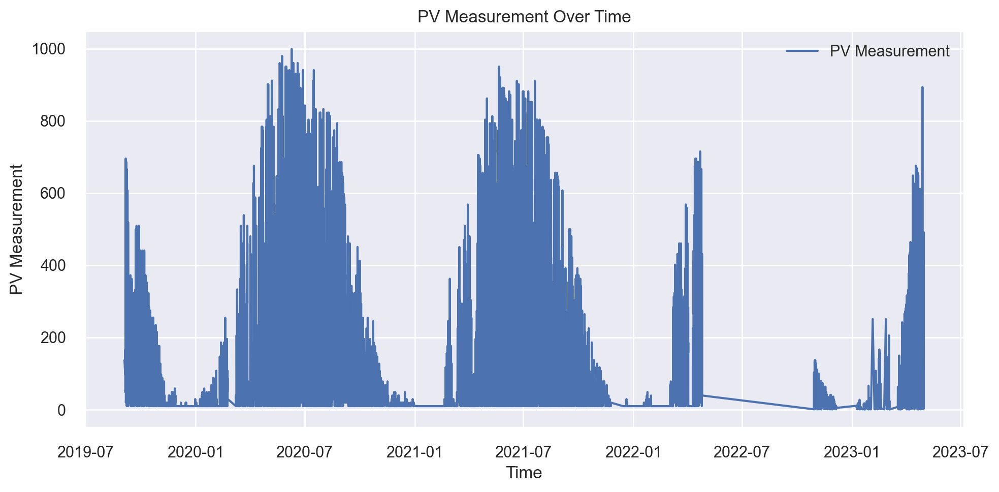

9676 X
9676 y


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     41.8017  4456.3498  66.7559  0.9086  0.4796  0.4759
1     41.7421  4349.5962  65.9515  0.9173  0.4957  0.5171
2     44.9395  5440.9863  73.7630  0.8809  0.5229  0.5823
3     47.9336  6162.2316  78.4999  0.8779  0.5663  0.7920
4     41.0251  4201.4781  64.8188  0.9079  0.5637  0.6696
5     42.8286  5064.6419  71.1663  0.8838  0.4757  0.5048
6     43.2490  4891.7066  69.9407  0.8973  0.4972  0.4879
7     40.4959  4217.7306  64.9441  0.9028  0.5813  0.7739
8     44.4578  5096.8935  71.3925  0.8782  0.4850  0.4671
9     43.0384  5357.7547  73.1967  0.8855  0.5400  0.5761
Mean  43.1512  4923.9369  70.0429  0.8940  0.5207  0.5847
Std    2.0804   600.7363   4.2336  0.0137  0.0376  0.1149
#############################################
Catboost Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     43.1675  4589.4590  67.7455  0.9059  0.4923  0.5074
1     44.0447  4988.1627  70.6269  0.9051  0.4959  0.5761
2     46.5572  5931.5021  77.0162  0.8702  0.5172  0.5883
3     48.1422  6232.1743  78.9441  0.8766  0.5611  0.7568
4     41.8366  4330.6395  65.8076  0.9050  0.5599  0.7019
5     45.5328  5406.3600  73.5280  0.8760  0.4906  0.5452
6     44.7627  5048.6398  71.0538  0.8940  0.5135  0.5994
7     42.5060  4833.3902  69.5226  0.8886  0.6047  0.8935
8     45.7108  5406.2939  73.5275  0.8708  0.4817  0.5124
9     44.4664  5768.3306  75.9495  0.8767  0.5405  0.6324
Mean  44.6727  5253.4952  72.3722  0.8869  0.5257  0.6313
Std    1.8126   575.3902   3.9703  0.0139  0.0378  0.1150
#############################################
LGBM Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     41.5530  4385.7761  66.2252  0.9100  0.4626  0.4717
1     41.9902  4506.2158  67.1284  0.9143  0.4904  0.5258
2     45.0814  5549.7584  74.4967  0.8786  0.5073  0.5742
3     47.2768  6036.9978  77.6981  0.8804  0.5497  0.7470
4     40.6900  4124.3044  64.2207  0.9096  0.5505  0.6605
5     43.3312  5097.6940  71.3981  0.8831  0.4600  0.4869
6     43.0832  4824.7662  69.4605  0.8987  0.4877  0.5273
7     40.7648  4408.8400  66.3991  0.8984  0.5768  0.7912
8     44.2473  5122.4300  71.5712  0.8776  0.4744  0.4745
9     42.9121  5422.5972  73.6383  0.8841  0.5061  0.5560
Mean  43.0930  4947.9380  70.2236  0.8935  0.5066  0.5815
Std    1.9407   576.3445   4.0718  0.0136  0.0380  0.1081
#############################################
Blended
#############################################
Finalized
float64
date_forecast    datetime64[ns]
is_day:idx              float32
dtype:

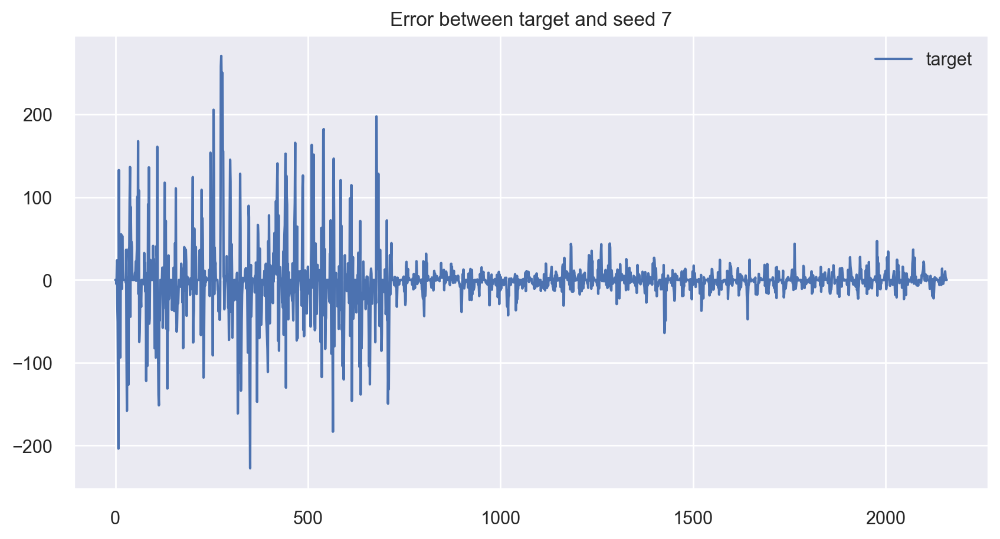

MAE for seed 7: 16.659524599653547


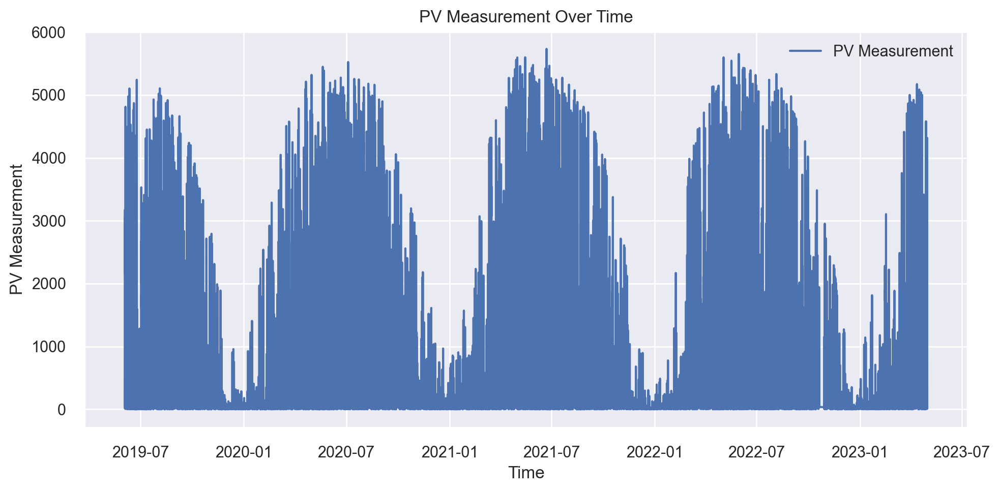

18036 X
18036 y


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     324.4215  285519.9429  534.3407  0.8509  0.9253  3.9755
1     299.7102  242090.9208  492.0274  0.8566  0.9756  4.2733
2     318.0287  265749.1460  515.5086  0.8552  0.9465  4.0532
3     316.1806  250601.9963  500.6016  0.8670  0.9734  3.9112
4     291.8073  214721.1855  463.3802  0.8804  0.9179  4.1478
5     344.0734  294117.2290  542.3258  0.8593  0.9713  3.8316
6     308.1121  254133.0938  504.1162  0.8640  0.9550  4.1122
7     316.0171  258338.3608  508.2700  0.8606  0.9279  3.1650
8     331.6914  280732.6138  529.8421  0.8448  0.9671  4.2561
9     325.6149  261015.3547  510.8966  0.8638  0.9346  3.1619
Mean  317.5657  260701.9844  510.1309  0.8603  0.9495  3.8888
Std    14.4575   21841.8409   21.6436  0.0092  0.0209  0.3860
#############################################
Catboost Done


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     334.7882  303167.1324  550.6061  0.8417  0.8580  3.2619
1     306.5509  253526.0104  503.5137  0.8498  0.8813  2.8925
2     329.3796  289367.1299  537.9286  0.8423  0.8584  2.6321
3     327.7625  270352.7569  519.9546  0.8565  0.8988  2.5117
4     305.5598  237550.7060  487.3917  0.8677  0.8187  2.2757
5     347.4202  305573.8926  552.7874  0.8538  0.8346  2.5728
6     315.0286  272406.0278  521.9253  0.8542  0.8562  3.1330
7     317.8919  272065.1118  521.5986  0.8531  0.8303  1.8802
8     338.9275  296228.9858  544.2692  0.8363  0.8853  2.7834
9     336.1846  286026.1996  534.8142  0.8508  0.8678  2.4691
Mean  325.9494  278626.3953  527.4789  0.8506  0.8590  2.6412
Std    13.4298   20678.0684   19.8082  0.0084  0.0243  0.3840
#############################################
LGBM Done


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     323.6578  287181.6078  535.8933  0.8500  0.8375  3.1254
1     297.7543  241356.6166  491.2806  0.8570  0.8756  2.7972
2     318.1704  271132.6683  520.7040  0.8522  0.8701  2.9049
3     316.6709  254700.5159  504.6786  0.8648  0.8854  2.4517
4     292.6575  220187.0210  469.2409  0.8774  0.8383  3.0031
5     340.6499  292695.3867  541.0133  0.8600  0.8571  2.8103
6     306.2026  256980.9136  506.9328  0.8625  0.8648  2.9620
7     311.1022  259211.1431  509.1278  0.8601  0.8116  2.0284
8     329.6758  282492.2414  531.5000  0.8439  0.8727  2.8566
9     325.6445  266618.2145  516.3509  0.8609  0.8562  2.3749
Mean  316.2186  263255.6329  512.6722  0.8589  0.8569  2.7314
Std    13.9597   20846.9312   20.5627  0.0087  0.0210  0.3222
#############################################
Blended
#############################################
Finalized
float64
date_forecast 

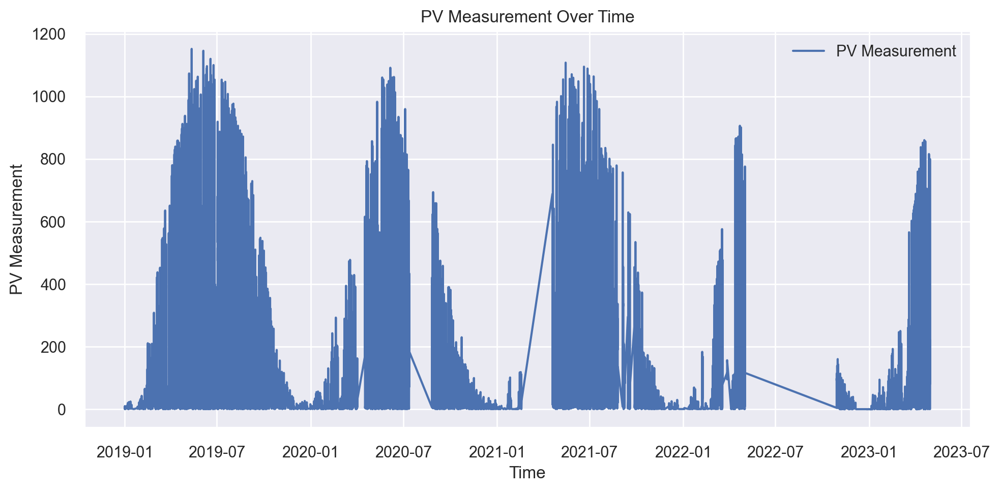

12274 X
12274 y


          MAE        MSE     RMSE      R2   RMSLE      MAPE
Fold                                                       
0     47.7850  6229.2230  78.9254  0.8971  0.7150    1.6182
1     48.9434  6453.7425  80.3352  0.9047  0.7560    2.1428
2     52.6643  6903.2420  83.0858  0.8932  0.7396    1.5761
3     53.7261  7782.9174  88.2208  0.8813  0.7228    1.6190
4     47.2017  6132.0956  78.3077  0.9049  0.7450    1.9781
5     47.6457  6218.1609  78.8553  0.9107  0.7101    1.5397
6     51.2370  7274.7417  85.2921  0.9008  0.6796    1.2965
7     51.4041  7766.3439  88.1269  0.8867  0.7800  132.7593
8     50.2137  6648.9015  81.5408  0.9046  0.6903    1.1810
9     52.8267  7619.0900  87.2874  0.8956  0.7277    1.2903
Mean  50.3648  6902.8459  82.9977  0.8980  0.7266   14.7001
Std    2.2491   628.8295   3.7711  0.0086  0.0286   39.3541
#############################################
Catboost Done


          MAE        MSE     RMSE      R2   RMSLE      MAPE
Fold                                                       
0     49.2254  6676.8770  81.7122  0.8897  0.6914    1.3335
1     49.8153  6834.0194  82.6681  0.8991  0.7480    2.0055
2     53.8114  7061.8395  84.0348  0.8908  0.7626    1.8653
3     54.9573  8071.9307  89.8439  0.8769  0.7525    1.7471
4     50.0917  7143.4063  84.5187  0.8892  0.7810    2.4545
5     46.9824  6163.9261  78.5107  0.9115  0.7051    1.7383
6     51.8371  7369.8344  85.8477  0.8995  0.7259    1.5101
7     53.0047  8043.5493  89.6858  0.8827  0.7728  113.4093
8     51.9489  7398.8465  86.0165  0.8939  0.6840    1.1814
9     54.3516  8062.7075  89.7926  0.8896  0.7168    1.2298
Mean  51.6026  7282.6937  85.2631  0.8923  0.7340   12.8475
Std    2.4146   609.8724   3.5913  0.0091  0.0325   33.5226
#############################################
LGBM Done


          MAE        MSE     RMSE      R2   RMSLE      MAPE
Fold                                                       
0     47.3340  6214.3384  78.8311  0.8974  0.6803    1.4129
1     48.5014  6477.0930  80.4804  0.9044  0.7236    1.9927
2     52.4914  6783.5795  82.3625  0.8951  0.7344    1.6842
3     53.5156  7753.5403  88.0542  0.8818  0.7139    1.6037
4     47.7078  6452.9536  80.3303  0.8999  0.7499    2.1685
5     46.3667  6043.7059  77.7413  0.9132  0.6909    1.5372
6     50.7446  7152.1661  84.5705  0.9025  0.6780    1.3264
7     51.4505  7745.5529  88.0088  0.8870  0.7577  123.0216
8     49.6967  6775.5277  82.3136  0.9028  0.6634    1.1018
9     52.6048  7654.7493  87.4914  0.8951  0.7041    1.2134
Mean  50.0413  6905.3207  83.0184  0.8979  0.7096   13.7062
Std    2.3642   607.2529   3.6422  0.0085  0.0302   36.4398
#############################################
Blended
#############################################
Finalized
float64
date_forecast    datetime64[ns]
is_day:idx

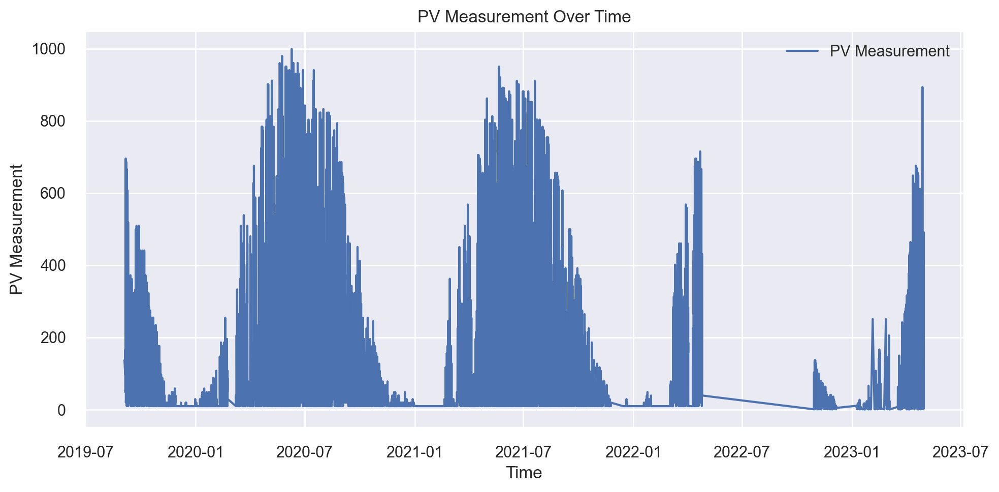

9676 X
9676 y


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     43.2857  4904.3660  70.0312  0.8878  0.5440  0.6335
1     43.1584  4747.4341  68.9016  0.8921  0.5316  0.5701
2     45.6370  5407.9848  73.5390  0.8875  0.5647  0.7572
3     43.6609  5138.7082  71.6848  0.8958  0.4977  0.5058
4     38.6570  4374.6897  66.1414  0.8962  0.5312  0.6643
5     42.9759  4788.6706  69.2002  0.8854  0.4827  0.4915
6     46.3759  5397.4729  73.4675  0.8945  0.5511  0.6998
7     45.7654  5666.4705  75.2760  0.8747  0.4711  0.4861
8     47.7752  6133.8986  78.3192  0.8741  0.5145  0.5193
9     46.5532  5781.0026  76.0329  0.8855  0.5040  0.5424
Mean  44.3845  5234.0698  72.2594  0.8874  0.5193  0.5870
Std    2.4832   514.2249   3.5569  0.0075  0.0289  0.0909
#############################################
Catboost Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     45.1555  5290.3364  72.7347  0.8790  0.5415  0.6183
1     44.5275  5093.3272  71.3676  0.8843  0.5312  0.6590
2     47.4185  5809.2140  76.2182  0.8792  0.5625  0.8087
3     44.9518  5388.1244  73.4038  0.8907  0.5065  0.5690
4     40.6291  4654.2063  68.2217  0.8896  0.5262  0.6306
5     42.7999  4709.0190  68.6223  0.8873  0.4989  0.5316
6     47.9227  5708.9441  75.5576  0.8884  0.5748  0.7608
7     47.3833  5917.2834  76.9239  0.8692  0.4825  0.4967
8     48.5250  6401.4199  80.0089  0.8686  0.4969  0.5277
9     48.0867  5902.1957  76.8257  0.8831  0.5203  0.5799
Mean  45.7400  5487.4070  73.9884  0.8819  0.5241  0.6182
Std    2.4646   533.7608   3.6219  0.0076  0.0280  0.0963
#############################################
LGBM Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     43.5220  4955.8349  70.3977  0.8866  0.5170  0.6105
1     42.7998  4770.9192  69.0718  0.8916  0.5054  0.5736
2     45.6233  5457.4236  73.8744  0.8865  0.5386  0.7669
3     43.4987  5098.4083  71.4031  0.8966  0.4827  0.5143
4     38.6545  4397.3228  66.3123  0.8956  0.5244  0.6166
5     42.0615  4616.4023  67.9441  0.8895  0.4785  0.4978
6     46.3003  5401.9736  73.4981  0.8944  0.5525  0.7027
7     45.7710  5663.9694  75.2593  0.8748  0.4640  0.4785
8     47.4772  6141.8577  78.3700  0.8739  0.4889  0.4971
9     46.4015  5686.9116  75.4116  0.8874  0.4864  0.5214
Mean  44.2110  5219.1024  72.1543  0.8877  0.5038  0.5779
Std    2.5046   517.8593   3.5869  0.0075  0.0272  0.0916
#############################################
Blended
#############################################
Finalized
float64
date_forecast    datetime64[ns]
is_day:idx              float32
dtype:

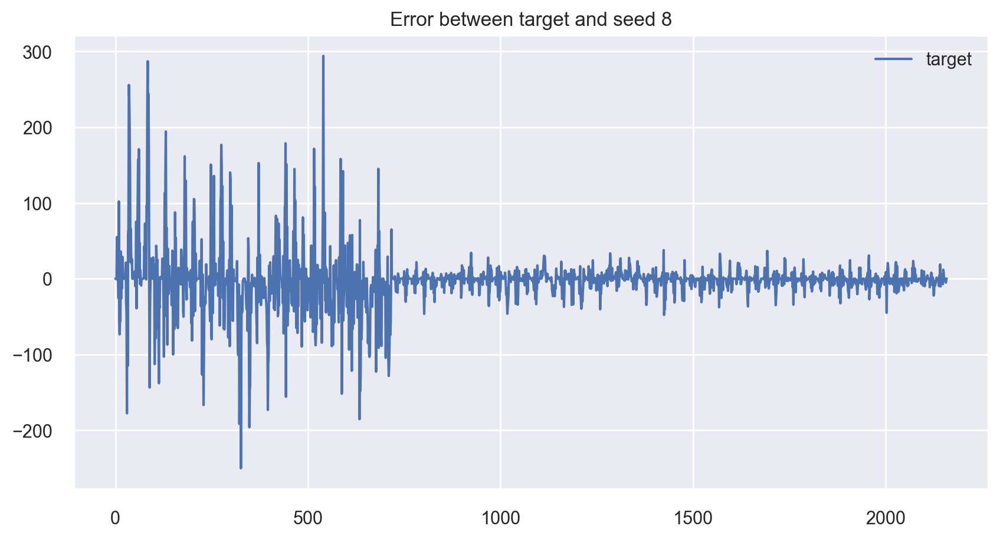

MAE for seed 8: 17.358634229426382


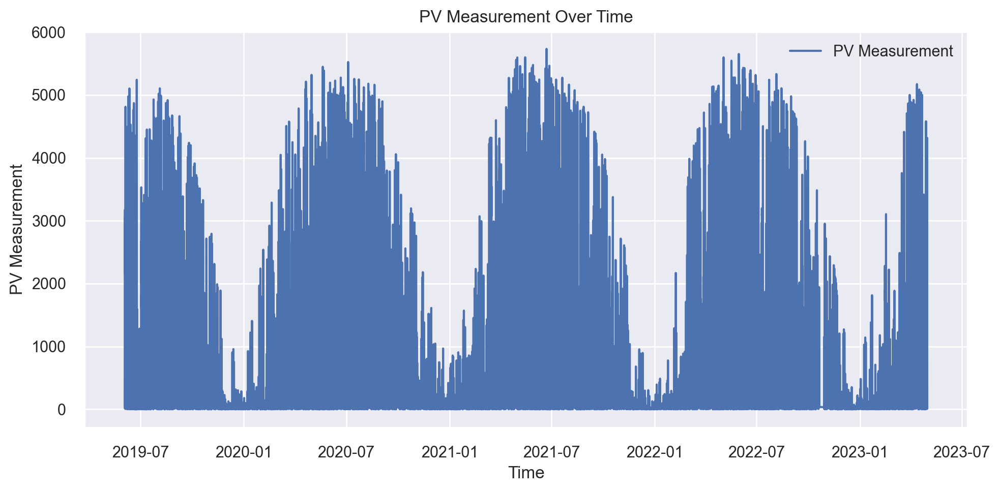

18036 X
18036 y


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     324.9063  277471.0805  526.7552  0.8570  0.9020  3.2652
1     305.4595  242046.7224  491.9824  0.8715  0.9962  4.7790
2     306.2957  237763.0573  487.6095  0.8709  0.9351  3.4816
3     320.8267  264448.6716  514.2457  0.8615  0.9664  4.4499
4     321.2404  253302.8557  503.2920  0.8638  0.8717  2.8208
5     307.1154  241390.9590  491.3155  0.8695  0.9035  3.8645
6     311.7176  259532.4263  509.4433  0.8558  0.9824  3.9088
7     327.2900  267667.3117  517.3657  0.8694  0.9907  4.3860
8     320.4678  270133.8327  519.7440  0.8535  0.9193  3.5996
9     316.2305  263366.4375  513.1924  0.8614  0.9237  3.4389
Mean  316.1550  257712.3355  507.4946  0.8634  0.9391  3.7994
Std     7.6149   12859.5449   12.7113  0.0063  0.0405  0.5707
#############################################
Catboost Done


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     339.2225  305285.7007  552.5267  0.8426  0.8140  2.5482
1     312.8740  261777.2019  511.6417  0.8611  0.8826  2.6974
2     303.0249  240384.4663  490.2902  0.8695  0.8403  2.5162
3     324.9998  271348.1186  520.9109  0.8579  0.8715  2.8317
4     328.9845  271360.0458  520.9223  0.8541  0.8014  1.8762
5     325.2487  269968.6236  519.5850  0.8540  0.8139  2.0879
6     314.4491  272043.7100  521.5781  0.8488  0.8947  2.8902
7     327.1405  269114.4667  518.7624  0.8687  0.8853  3.1112
8     318.2138  274534.8853  523.9608  0.8511  0.8131  2.0813
9     316.9001  268796.7031  518.4561  0.8585  0.8178  2.2954
Mean  321.1058  270461.3922  519.8634  0.8566  0.8435  2.4936
Std     9.6129   14893.9191   14.2628  0.0080  0.0343  0.3812
#############################################
LGBM Done


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     325.5392  284941.2890  533.7989  0.8531  0.8167  2.4462
1     303.8379  246496.8923  496.4845  0.8692  0.8995  3.2225
2     299.7925  233257.7841  482.9677  0.8734  0.8481  2.3229
3     317.3082  261581.4395  511.4503  0.8630  0.8873  3.3417
4     320.2556  256048.8378  506.0127  0.8623  0.7867  1.9040
5     310.5188  249361.8682  499.3615  0.8651  0.8216  2.5352
6     307.6952  260172.7559  510.0713  0.8554  0.8734  2.4563
7     322.4560  262404.4658  512.2543  0.8720  0.9085  3.1226
8     313.7515  266319.1361  516.0612  0.8556  0.8213  2.3914
9     311.1630  260038.3211  509.9395  0.8631  0.8434  2.3191
Mean  313.2318  258062.2790  507.8402  0.8632  0.8506  2.6062
Std     7.8354   12880.3223   12.6735  0.0066  0.0382  0.4407
#############################################
Blended
#############################################
Finalized
float64
date_forecast 

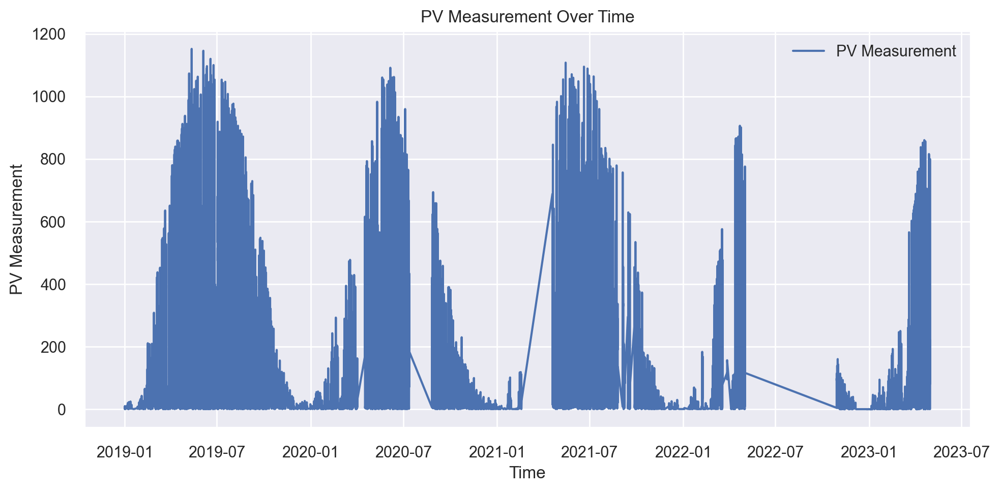

12274 X
12274 y


          MAE        MSE     RMSE      R2   RMSLE     MAPE
Fold                                                      
0     50.7598  7291.6613  85.3912  0.8911  0.7030   1.6559
1     50.5726  6863.6600  82.8472  0.8968  0.7455   1.6676
2     49.0037  6808.7493  82.5151  0.9049  0.7863   3.3362
3     49.0693  6890.6355  83.0099  0.9019  0.7071   2.2542
4     55.0314  7841.0296  88.5496  0.8838  0.7556   2.1728
5     49.3997  6773.4277  82.3008  0.8848  0.7311   1.4771
6     47.6255  6210.9773  78.8098  0.9039  0.6963  28.2168
7     50.6132  6440.4092  80.2522  0.9035  0.6766   1.2749
8     47.5022  6052.7502  77.7994  0.9095  0.6971   1.4892
9     52.9494  7667.5674  87.5646  0.8882  0.6856   1.1795
Mean  50.2527  6884.0867  82.9040  0.8968  0.7184   4.4724
Std    2.2080   552.7320   3.3191  0.0088  0.0332   7.9375
#############################################
Catboost Done


          MAE        MSE     RMSE      R2   RMSLE     MAPE
Fold                                                      
0     51.7806  7532.3870  86.7893  0.8875  0.6786   1.3847
1     50.6573  7096.9969  84.2437  0.8933  0.7213   1.6622
2     50.8386  7193.9797  84.8173  0.8996  0.7629   2.5925
3     50.6093  7331.8828  85.6264  0.8956  0.7007   2.6469
4     56.9385  8616.9637  92.8276  0.8723  0.7599   2.0363
5     49.8330  6669.6701  81.6680  0.8866  0.7148   1.4179
6     50.4384  6862.1443  82.8381  0.8938  0.6983  62.1764
7     51.8257  6982.0700  83.5588  0.8954  0.6713   1.2705
8     47.0950  5885.0423  76.7140  0.9120  0.7052   1.5164
9     54.4304  7933.2996  89.0691  0.8844  0.6780   1.3008
Mean  51.4447  7210.4436  84.8152  0.8920  0.7091   7.8005
Std    2.5213   696.7745   4.1012  0.0099  0.0303  18.1318
#############################################
LGBM Done


          MAE        MSE     RMSE      R2   RMSLE     MAPE
Fold                                                      
0     50.3305  7224.9769  84.9999  0.8921  0.6642   1.3869
1     49.8765  6813.3278  82.5429  0.8976  0.7102   1.5811
2     48.7256  6816.8378  82.5641  0.9048  0.7529   2.6956
3     48.8800  6939.3071  83.3025  0.9012  0.6759   2.3708
4     55.0839  8035.6393  89.6417  0.8809  0.7406   2.0471
5     48.7377  6537.7890  80.8566  0.8888  0.6931   1.3823
6     47.9629  6361.1196  79.7566  0.9016  0.6717  45.1247
7     50.2576  6512.1326  80.6978  0.9024  0.6616   1.2220
8     46.4631  5788.9497  76.0851  0.9134  0.6850   1.4659
9     53.0173  7643.1486  87.4251  0.8886  0.6622   1.1992
Mean  49.9335  6867.3229  82.7872  0.8971  0.6917   6.0476
Std    2.3713   613.1325   3.6873  0.0091  0.0311  13.0346
#############################################
Blended
#############################################
Finalized
float64
date_forecast    datetime64[ns]
is_day:idx              

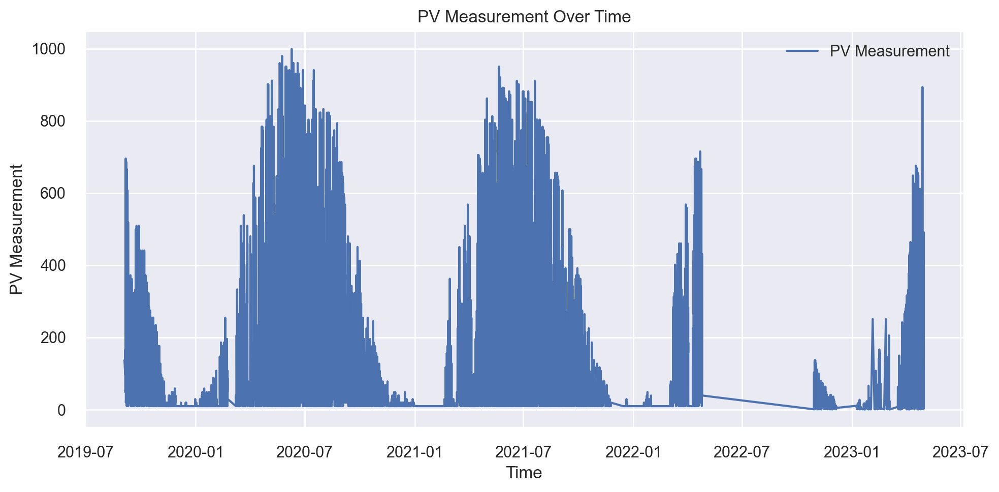

9676 X
9676 y


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     41.5608  4415.1925  66.4469  0.9038  0.4917  0.5650
1     46.2010  5834.0628  76.3810  0.8837  0.5362  0.7270
2     39.9802  3929.8386  62.6884  0.9116  0.5226  0.6333
3     40.6678  4367.8170  66.0895  0.9053  0.4794  0.4612
4     45.2715  5995.7768  77.4324  0.8608  0.5258  0.5948
5     43.8270  5614.1067  74.9273  0.8791  0.4989  0.5487
6     43.6961  4773.5967  69.0912  0.9021  0.5395  0.6023
7     42.0544  4308.2440  65.6372  0.9019  0.4945  0.4937
8     45.5395  5266.4721  72.5705  0.8883  0.5506  0.6343
9     47.2748  5949.3069  77.1318  0.8713  0.5416  0.5916
Mean  43.6073  5045.4414  70.8396  0.8908  0.5181  0.5852
Std    2.3480   737.0608   5.2143  0.0159  0.0237  0.0712
#############################################
Catboost Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     41.6206  4212.6954  64.9053  0.9082  0.4927  0.5922
1     46.3238  5973.7969  77.2903  0.8810  0.5708  0.9385
2     41.0614  4096.7743  64.0060  0.9079  0.5300  0.6515
3     41.5140  4466.3279  66.8306  0.9032  0.4610  0.4624
4     46.1188  6100.5939  78.1063  0.8584  0.5221  0.6198
5     43.5205  5375.1102  73.3151  0.8842  0.5003  0.5598
6     45.7919  5062.2705  71.1496  0.8962  0.5383  0.6307
7     45.2027  4998.3568  70.6991  0.8862  0.4927  0.5403
8     47.9180  5724.3461  75.6594  0.8786  0.5677  0.7218
9     47.8557  6152.7699  78.4396  0.8669  0.5392  0.6420
Mean  44.6927  5216.3042  72.0401  0.8871  0.5215  0.6359
Std    2.4632   735.5493   5.1500  0.0160  0.0332  0.1210
#############################################
LGBM Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     40.7570  4193.2071  64.7550  0.9087  0.4818  0.5431
1     45.4728  5783.3804  76.0485  0.8848  0.5493  0.8048
2     39.7957  3876.1251  62.2585  0.9128  0.5157  0.6210
3     40.1850  4256.0961  65.2388  0.9077  0.4521  0.4482
4     45.0415  5896.9263  76.7914  0.8631  0.5108  0.5868
5     42.8658  5371.8924  73.2932  0.8843  0.4854  0.5359
6     44.1045  4780.9748  69.1446  0.9020  0.5127  0.5666
7     42.8182  4510.5468  67.1606  0.8973  0.4738  0.4986
8     45.8956  5359.4611  73.2083  0.8864  0.5399  0.6620
9     46.7319  5899.6134  76.8089  0.8724  0.5189  0.5717
Mean  43.3668  4992.8223  70.4708  0.8919  0.5040  0.5839
Std    2.3610   724.5279   5.1662  0.0157  0.0287  0.0929
#############################################
Blended
#############################################
Finalized
float64
date_forecast    datetime64[ns]
is_day:idx              float32
dtype:

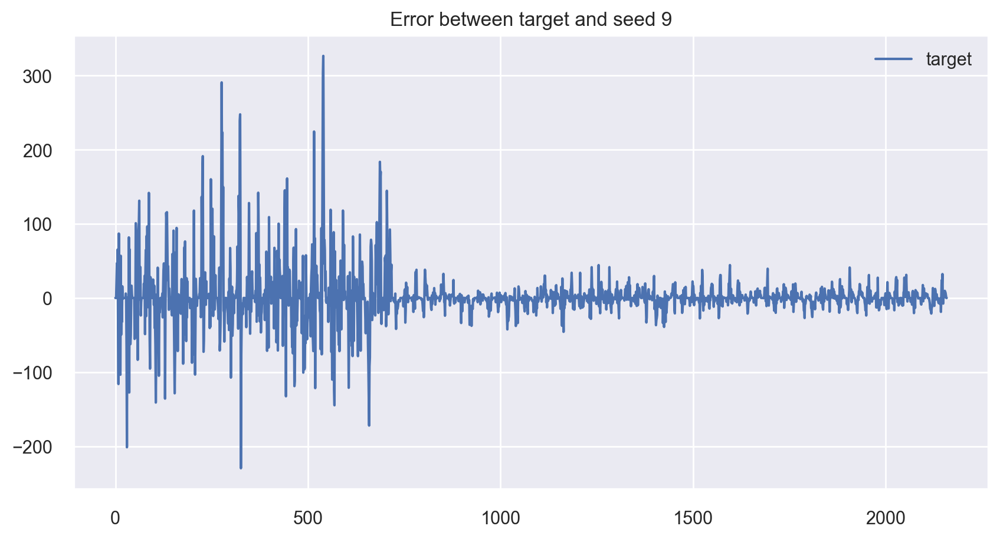

MAE for seed 9: 16.728911356539232


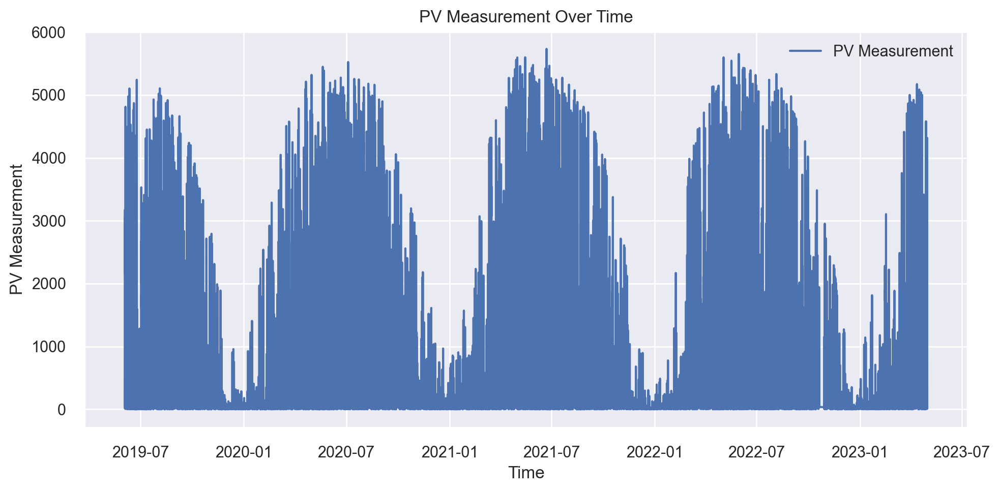

18036 X
18036 y


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     303.6094  245151.3132  495.1276  0.8669  0.9425  4.2202
1     314.0084  250176.4165  500.1764  0.8532  0.9683  3.8979
2     328.5548  265037.1898  514.8176  0.8614  0.9128  3.6260
3     322.1441  252187.4302  502.1827  0.8713  0.9005  3.2013
4     313.6981  265597.4520  515.3615  0.8627  0.8856  3.2430
5     319.7679  255008.9815  504.9841  0.8696  0.9234  3.4560
6     309.3576  241304.0680  491.2271  0.8796  0.9007  3.6404
7     319.7444  275691.7794  525.0636  0.8444  0.9375  3.8324
8     323.0841  276057.6704  525.4119  0.8652  0.9325  3.7629
9     297.7639  238891.9312  488.7657  0.8696  0.9851  4.3821
Mean  315.1733  256510.4232  506.3118  0.8644  0.9289  3.7262
Std     8.9800   12794.6679   12.6002  0.0094  0.0296  0.3627
#############################################
Catboost Done


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     310.9951  266610.4284  516.3433  0.8552  0.8624  3.0094
1     318.4289  262859.8072  512.6986  0.8457  0.8552  3.1939
2     324.4733  267005.4505  516.7257  0.8604  0.8427  2.9349
3     332.3728  263695.7651  513.5132  0.8654  0.8105  2.0843
4     324.5596  282322.6074  531.3404  0.8540  0.8226  1.9417
5     324.4126  263272.4696  513.1008  0.8654  0.8135  1.9122
6     318.5319  250429.9975  500.4298  0.8750  0.8273  2.2446
7     325.7415  286368.3811  535.1340  0.8384  0.8417  2.6048
8     326.5914  291254.6458  539.6801  0.8578  0.8652  2.6993
9     305.3252  251232.7739  501.2313  0.8629  0.9222  3.2750
Mean  321.1432  268505.2327  518.0197  0.8580  0.8463  2.5900
Std     7.6011   13194.0248   12.6810  0.0099  0.0313  0.4895
#############################################
LGBM Done


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     301.2824  249813.8423  499.8138  0.8643  0.8727  3.1537
1     310.3166  250669.0323  500.6686  0.8529  0.8733  3.1411
2     320.7662  259472.1080  509.3840  0.8643  0.8390  2.9349
3     322.1298  251803.8276  501.8006  0.8715  0.8207  2.1960
4     313.0764  267309.2405  517.0196  0.8618  0.8422  2.3091
5     316.3840  252453.8141  502.4478  0.8709  0.8229  2.2400
6     308.6563  239383.0320  489.2679  0.8805  0.8404  2.5772
7     317.6886  275199.9093  524.5950  0.8447  0.8633  2.6872
8     320.7717  277372.6435  526.6618  0.8646  0.8477  2.7083
9     295.3278  238911.2737  488.7855  0.8696  0.8959  2.9951
Mean  312.6400  256238.8723  506.0445  0.8645  0.8518  2.6943
Std     8.4373   12766.4776   12.5650  0.0095  0.0228  0.3429
#############################################
Blended
#############################################
Finalized
float64
date_forecast 

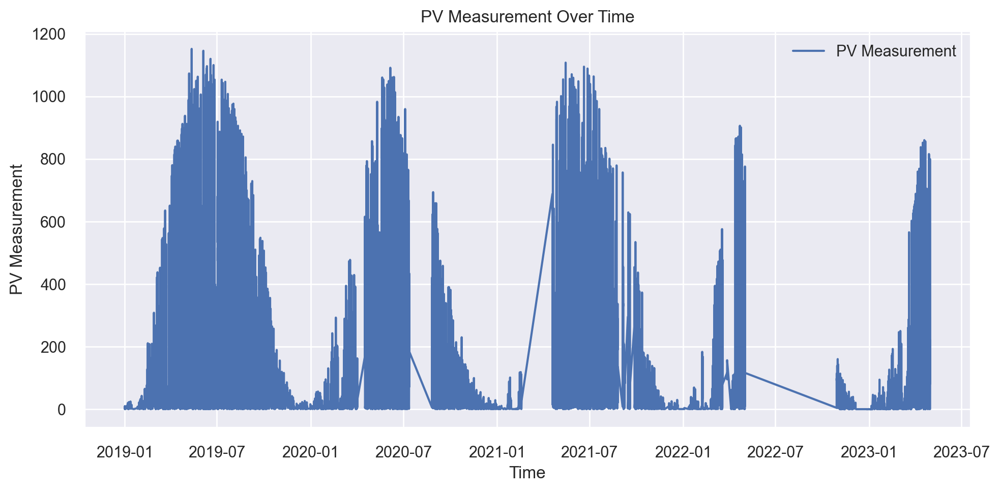

12274 X
12274 y


          MAE        MSE     RMSE      R2   RMSLE     MAPE
Fold                                                      
0     48.4501  6565.4312  81.0273  0.9032  0.7813   2.0113
1     54.6035  8513.4530  92.2684  0.8780  0.7097   1.2855
2     54.3513  7746.0729  88.0118  0.8840  0.7133   3.3292
3     47.6273  6176.5490  78.5910  0.9082  0.7538   1.9618
4     52.0863  7426.2494  86.1757  0.8914  0.6946   1.7537
5     48.0522  5891.5261  76.7563  0.9224  0.7405  29.0428
6     51.5985  7326.8287  85.5969  0.8946  0.6921   1.3023
7     49.6854  6748.6452  82.1501  0.8995  0.7339   1.4886
8     46.9176  5799.9337  76.1573  0.9097  0.7314   1.5323
9     51.9108  7089.1305  84.1970  0.8957  0.7001   1.7968
Mean  50.5283  6928.3820  83.0932  0.8987  0.7251   4.5504
Std    2.6329   818.0035   4.8893  0.0123  0.0271   8.1830
#############################################
Catboost Done


          MAE        MSE     RMSE      R2   RMSLE      MAPE
Fold                                                       
0     51.3408  7266.1063  85.2415  0.8928  0.7751    2.1491
1     54.7102  8545.0005  92.4392  0.8776  0.6905    1.2155
2     54.1543  7867.3550  88.6981  0.8822  0.7169    2.6544
3     46.9865  6188.3109  78.6658  0.9080  0.7074    2.0342
4     52.4786  7531.9409  86.7868  0.8898  0.7143    1.9355
5     49.9820  6725.0312  82.0063  0.9114  0.7223  126.4395
6     51.8506  7523.2630  86.7367  0.8918  0.7026    1.3661
7     51.5978  7207.5560  84.8973  0.8927  0.7506    1.7634
8     46.5482  5737.2320  75.7445  0.9107  0.6965    1.4804
9     52.6368  7194.7588  84.8219  0.8942  0.7195    1.6039
Mean  51.2286  7178.6555  84.6038  0.8951  0.7196   14.2642
Std    2.5733   765.3608   4.5662  0.0110  0.0243   37.3939
#############################################
LGBM Done


          MAE        MSE     RMSE      R2   RMSLE     MAPE
Fold                                                      
0     49.0033  6747.2072  82.1414  0.9005  0.7621   2.0207
1     53.7642  8313.3032  91.1773  0.8809  0.6829   1.1946
2     53.4090  7616.7277  87.2739  0.8859  0.6955   2.9298
3     46.2004  5993.9177  77.4204  0.9109  0.7023   1.9350
4     51.2931  7287.2473  85.3654  0.8934  0.6870   1.7711
5     48.1530  6131.2397  78.3022  0.9193  0.7234  77.6906
6     50.9033  7262.1227  85.2181  0.8955  0.6789   1.2602
7     49.7757  6791.1207  82.4083  0.8989  0.7289   1.5554
8     46.0214  5602.0656  74.8469  0.9128  0.6923   1.4264
9     51.2888  6939.9959  83.3066  0.8979  0.7004   1.6637
Mean  49.9812  6868.4948  82.7461  0.8996  0.7054   9.3447
Std    2.5428   769.1361   4.6461  0.0113  0.0244  22.7868
#############################################
Blended
#############################################
Finalized
float64
date_forecast    datetime64[ns]
is_day:idx              

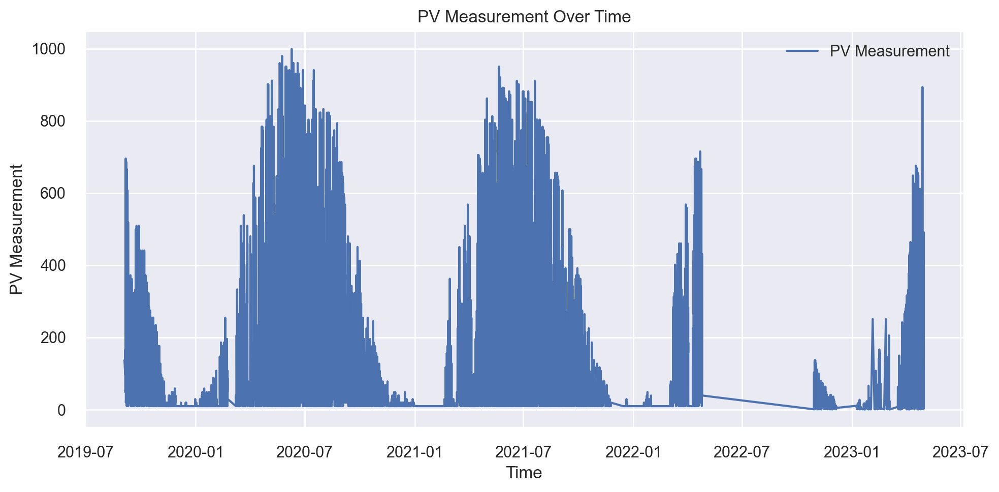

9676 X
9676 y


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     39.1320  3975.0063  63.0477  0.9044  0.5111  0.4997
1     42.5108  4517.1529  67.2098  0.9090  0.5044  0.4910
2     45.6467  5696.4133  75.4746  0.8829  0.4867  0.5299
3     43.5744  5073.9660  71.2318  0.8952  0.5317  0.5467
4     44.5088  5513.7973  74.2549  0.8814  0.5592  0.6167
5     45.8316  5352.9656  73.1640  0.8681  0.5610  0.7217
6     47.3319  6116.7979  78.2100  0.8768  0.5091  0.5048
7     45.7629  5224.6682  72.2819  0.8876  0.5412  0.6292
8     43.7959  5216.6916  72.2267  0.8972  0.5309  0.5990
9     44.1043  5196.1810  72.0845  0.8987  0.5425  0.6747
Mean  44.2199  5188.3640  71.9186  0.8901  0.5278  0.5814
Std    2.1494   564.9012   4.0103  0.0123  0.0232  0.0754
#############################################
Catboost Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     40.3005  4261.7474  65.2821  0.8975  0.4905  0.5598
1     44.5629  4866.7327  69.7620  0.9020  0.5142  0.6266
2     47.3827  6249.2293  79.0521  0.8715  0.5201  0.6017
3     45.9425  5387.4823  73.3995  0.8887  0.5054  0.5319
4     44.5206  5343.0780  73.0964  0.8851  0.5448  0.6263
5     48.2122  5703.9283  75.5244  0.8595  0.5878  0.7999
6     47.9962  6223.8282  78.8912  0.8746  0.4830  0.5212
7     47.8614  5686.7963  75.4109  0.8777  0.5470  0.6327
8     44.7639  5756.8579  75.8740  0.8865  0.5307  0.6345
9     46.9816  6013.1274  77.5444  0.8828  0.5180  0.6173
Mean  45.8525  5549.2808  74.3837  0.8826  0.5241  0.6152
Std    2.3080   586.3721   4.0436  0.0118  0.0289  0.0735
#############################################
LGBM Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     38.7980  3991.1241  63.1753  0.9040  0.4784  0.5046
1     42.6456  4533.1157  67.3284  0.9087  0.4863  0.5355
2     45.8220  5822.0638  76.3024  0.8803  0.5013  0.5489
3     43.9671  5078.4604  71.2633  0.8951  0.5115  0.5149
4     43.4663  5291.0894  72.7399  0.8862  0.5268  0.5963
5     46.2962  5398.6711  73.4756  0.8670  0.5530  0.7310
6     46.8461  6040.9767  77.7237  0.8783  0.4741  0.4889
7     46.1186  5313.8441  72.8961  0.8857  0.5279  0.5964
8     43.4764  5344.4954  73.1061  0.8946  0.5057  0.5832
9     44.7623  5466.9814  73.9390  0.8934  0.5087  0.6193
Mean  44.2199  5228.0822  72.1950  0.8893  0.5074  0.5719
Std    2.2524   562.1470   3.9955  0.0118  0.0231  0.0674
#############################################
Blended
#############################################
Finalized
float64
date_forecast    datetime64[ns]
is_day:idx              float32
dtype:

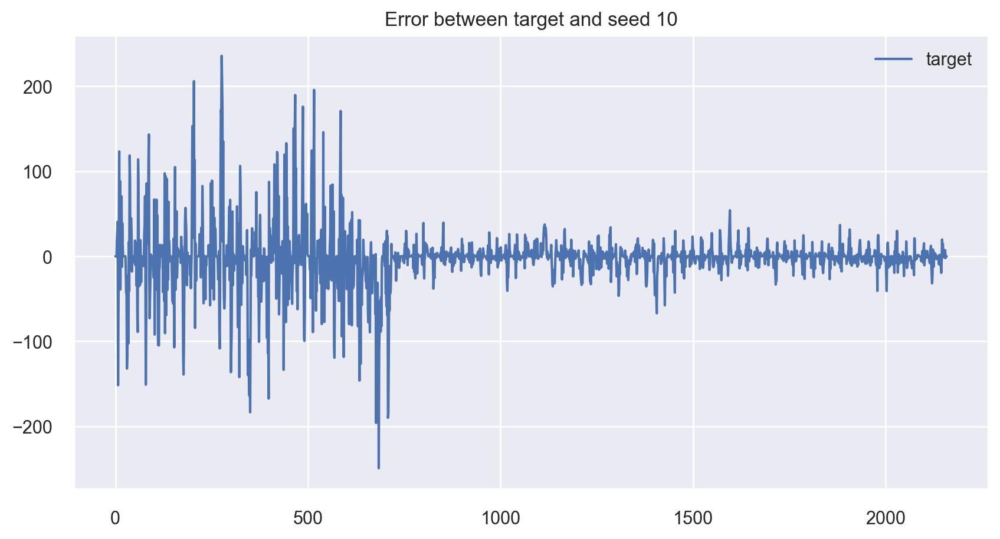

MAE for seed 10: 17.12308625869704


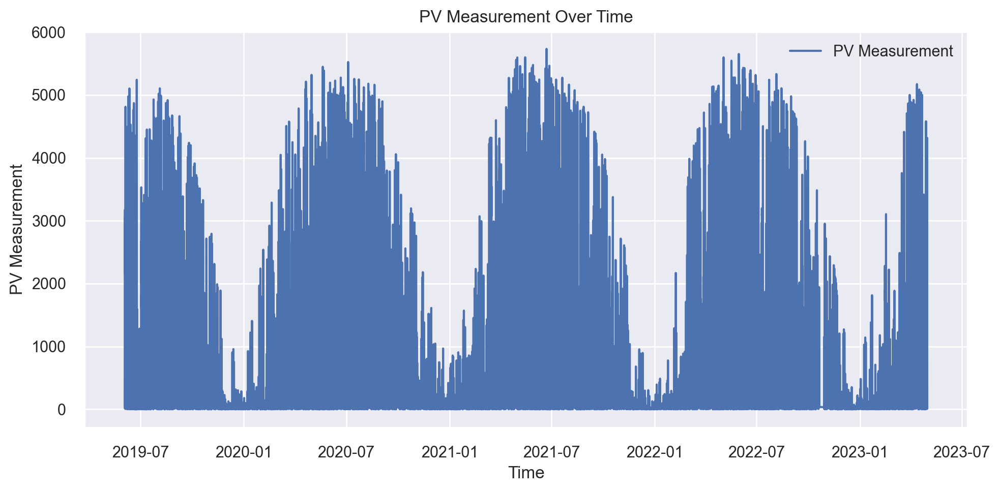

18036 X
18036 y


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     317.8745  256691.1857  506.6470  0.8643  0.9005  3.8429
1     305.3714  236560.4293  486.3748  0.8687  0.9448  4.0200
2     320.5071  270371.7932  519.9729  0.8706  0.9467  3.3416
3     313.6111  258451.4640  508.3812  0.8551  0.9928  4.0864
4     308.9442  257899.6459  507.8382  0.8638  0.9991  4.7977
5     310.9695  264549.2348  514.3435  0.8579  0.9177  3.9097
6     321.0762  265087.1564  514.8662  0.8608  0.9370  3.2357
7     305.0831  244476.9763  494.4461  0.8805  0.9385  3.5370
8     318.2397  258715.9784  508.6413  0.8668  0.9509  3.6518
9     316.7592  253493.7397  503.4816  0.8710  0.8911  3.5412
Mean  313.8436  256629.7604  506.4993  0.8659  0.9419  3.7964
Std     5.6712    9448.1703    9.3936  0.0070  0.0330  0.4274
#############################################
Catboost Done


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     326.8575  271439.9638  520.9990  0.8565  0.8446  2.8844
1     304.3080  246869.6411  496.8598  0.8630  0.8239  2.2960
2     327.9039  285469.2220  534.2932  0.8633  0.8519  2.6977
3     324.1151  279777.4533  528.9399  0.8431  0.8473  2.3202
4     317.7941  271851.7498  521.3940  0.8564  0.9271  3.5839
5     318.5229  278915.8883  528.1249  0.8502  0.8198  3.0123
6     332.7020  286617.7133  535.3669  0.8495  0.8117  2.1222
7     310.1523  252496.8997  502.4907  0.8766  0.8389  2.7980
8     329.6074  280499.0264  529.6216  0.8555  0.8754  2.9428
9     319.6136  259662.6250  509.5710  0.8679  0.8461  3.1527
Mean  321.1577  271360.0183  520.7661  0.8582  0.8487  2.7810
Std     8.4681   13175.7571   12.7547  0.0093  0.0313  0.4198
#############################################
LGBM Done


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     316.0165  257181.5395  507.1307  0.8640  0.8149  2.5647
1     298.3123  234937.8437  484.7039  0.8696  0.8483  2.7423
2     318.6815  271304.4282  520.8689  0.8701  0.8439  2.3896
3     313.3791  262623.4893  512.4680  0.8527  0.8854  2.8145
4     308.7919  259139.3083  509.0573  0.8632  0.9389  3.8339
5     309.1674  265996.7454  515.7487  0.8571  0.8478  3.1844
6     322.0930  269539.7494  519.1722  0.8585  0.8388  2.3549
7     301.6561  242298.8557  492.2386  0.8816  0.8491  2.6973
8     317.7639  263253.7988  513.0826  0.8644  0.8742  2.7249
9     311.8582  250233.2966  500.2332  0.8727  0.8308  2.8579
Mean  311.7720  257650.9055  507.4704  0.8654  0.8572  2.8164
Std     7.1410   11236.3718   11.1660  0.0080  0.0332  0.4073
#############################################
Blended
#############################################
Finalized
float64
date_forecast 

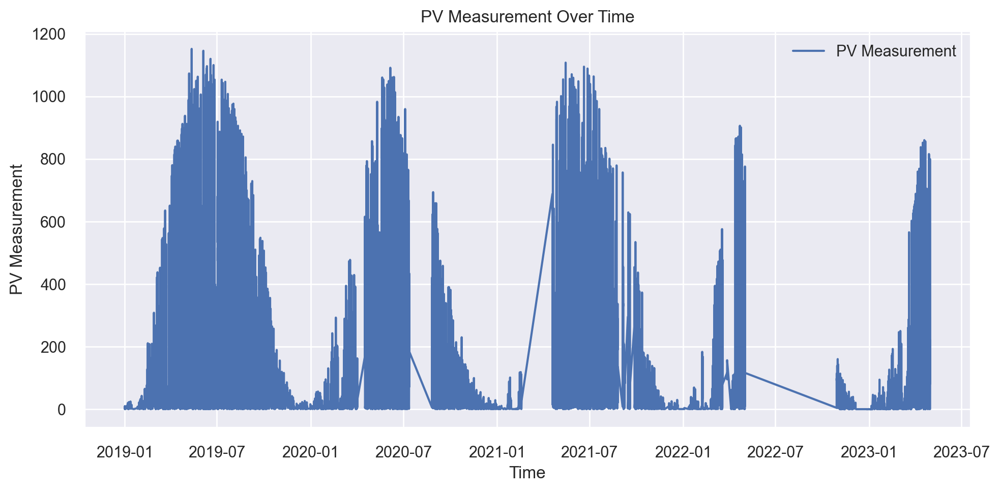

12274 X
12274 y


          MAE        MSE     RMSE      R2   RMSLE     MAPE
Fold                                                      
0     48.7755  6910.4271  83.1290  0.8938  0.7412   1.6842
1     45.5447  5746.4946  75.8056  0.9117  0.7357   1.6427
2     51.8650  7525.6284  86.7504  0.8976  0.6757   1.3914
3     48.5853  6028.9097  77.6461  0.9145  0.7026   1.1907
4     51.2007  7005.4163  83.6984  0.9011  0.7476  62.0652
5     48.2194  6691.7019  81.8028  0.8942  0.7106   1.6101
6     49.8673  6666.7637  81.6503  0.9058  0.7012   1.8075
7     52.8929  7577.9909  87.0517  0.8900  0.7417   1.7740
8     49.1612  7036.2764  83.8825  0.8916  0.7773   1.8829
9     51.0149  6588.8562  81.1718  0.9074  0.6995   1.5409
Mean  49.7127  6777.8465  82.2588  0.9008  0.7233   7.6590
Std    2.0183   549.1476   3.3659  0.0082  0.0287  18.1364
#############################################
Catboost Done


          MAE        MSE     RMSE      R2   RMSLE     MAPE
Fold                                                      
0     50.6317  7564.4810  86.9740  0.8838  0.7424   1.7680
1     46.8872  6289.0226  79.3034  0.9034  0.7231   1.5737
2     52.6176  7506.2762  86.6388  0.8978  0.6851   1.3333
3     50.5047  6597.7674  81.2266  0.9064  0.6639   1.0601
4     52.6615  7309.5566  85.4959  0.8968  0.7668  43.2119
5     50.3133  7154.9413  84.5869  0.8869  0.7535   1.7398
6     51.9566  6961.4361  83.4352  0.9016  0.7190   2.0048
7     52.8664  7622.3973  87.3063  0.8894  0.7503   1.8686
8     49.3633  7241.0104  85.0941  0.8884  0.7486   1.6096
9     53.6033  7559.4761  86.9452  0.8938  0.7177   1.7524
Mean  51.1406  7180.6365  84.7007  0.8948  0.7270   5.7922
Std    1.9184   423.7612   2.5368  0.0072  0.0307  12.4759
#############################################
LGBM Done


          MAE        MSE     RMSE      R2   RMSLE     MAPE
Fold                                                      
0     48.9175  7082.1424  84.1555  0.8912  0.7136   1.6279
1     45.3892  5861.0683  76.5576  0.9099  0.7117   1.5287
2     51.3403  7358.4439  85.7814  0.8998  0.6590   1.2983
3     48.4872  6123.1274  78.2504  0.9131  0.6569   1.0591
4     50.8701  6964.4393  83.4532  0.9017  0.7406  52.5835
5     48.2571  6730.9158  82.0422  0.8936  0.7132   1.6283
6     49.8964  6623.5214  81.3850  0.9064  0.6897   1.3041
7     52.1178  7428.6205  86.1894  0.8922  0.7337   1.7696
8     48.3833  6956.3446  83.4047  0.8928  0.7505   1.6700
9     51.6990  6886.7800  82.9866  0.9033  0.6879   1.4960
Mean  49.5358  6801.5403  82.4206  0.9004  0.7057   6.5966
Std    1.9533   471.3051   2.8956  0.0074  0.0305  15.3303
#############################################
Blended
#############################################
Finalized
float64
date_forecast    datetime64[ns]
is_day:idx              

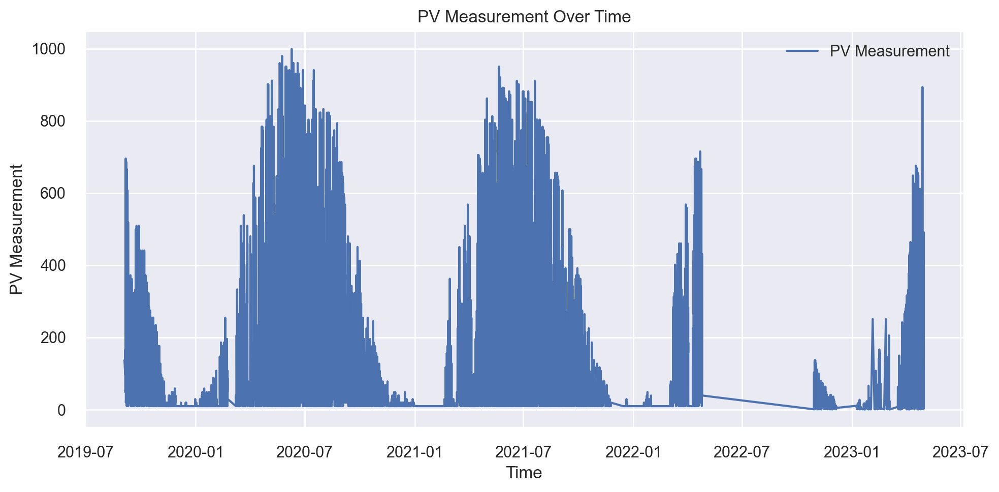

9676 X
9676 y


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     44.3263  5568.5331  74.6226  0.8670  0.4912  0.5580
1     44.3862  5373.4888  73.3041  0.8813  0.5215  0.5623
2     45.0707  5016.8271  70.8296  0.8939  0.5232  0.5828
3     42.6018  4875.7168  69.8263  0.8992  0.5014  0.5124
4     42.5934  5071.7834  71.2165  0.8852  0.5614  0.5765
5     46.2488  5605.0383  74.8668  0.8939  0.5322  0.5785
6     42.1577  4674.8570  68.3729  0.9033  0.4793  0.5019
7     41.0998  4175.5881  64.6188  0.9079  0.5045  0.5053
8     43.8901  4731.3861  68.7851  0.8968  0.5190  0.5314
9     45.0678  5260.1966  72.5272  0.8882  0.5440  0.6105
Mean  43.7443  5035.3415  70.8970  0.8917  0.5178  0.5520
Std    1.5065   419.8114   2.9932  0.0112  0.0234  0.0354
#############################################
Catboost Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     46.1814  5803.4672  76.1805  0.8614  0.5166  0.6710
1     43.9645  5319.2058  72.9329  0.8825  0.5043  0.5823
2     46.9920  5519.3212  74.2921  0.8833  0.5372  0.7631
3     43.5914  4962.1008  70.4422  0.8974  0.5178  0.5814
4     42.7905  5128.3044  71.6122  0.8839  0.5578  0.6634
5     47.0755  5820.6567  76.2932  0.8899  0.5216  0.6183
6     42.4720  4786.3952  69.1838  0.9010  0.4672  0.5291
7     42.3531  4337.7836  65.8619  0.9043  0.4795  0.5369
8     44.9394  5147.9260  71.7490  0.8878  0.4952  0.5259
9     46.2228  5711.2011  75.5725  0.8786  0.5430  0.6625
Mean  44.6583  5253.6362  72.4120  0.8870  0.5140  0.6134
Std    1.7702   455.7473   3.1835  0.0117  0.0268  0.0730
#############################################
LGBM Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     44.4625  5569.6255  74.6299  0.8670  0.4983  0.5974
1     43.3525  5212.2003  72.1956  0.8849  0.4924  0.5396
2     45.0651  5108.4277  71.4733  0.8920  0.5142  0.6559
3     42.2637  4774.8921  69.1006  0.9013  0.4883  0.5331
4     41.9631  4960.4129  70.4302  0.8877  0.5320  0.5880
5     45.8791  5578.8506  74.6917  0.8944  0.5100  0.5620
6     41.4862  4597.0412  67.8015  0.9049  0.4554  0.5005
7     40.7683  4123.7088  64.2161  0.9090  0.4575  0.4926
8     43.7408  4817.1401  69.4056  0.8950  0.4827  0.5031
9     44.7760  5325.0175  72.9727  0.8868  0.5308  0.6109
Mean  43.3757  5006.7317  70.6917  0.8923  0.4962  0.5583
Std    1.6124   428.6549   3.0680  0.0113  0.0253  0.0514
#############################################
Blended
#############################################
Finalized
float64
date_forecast    datetime64[ns]
is_day:idx              float32
dtype:

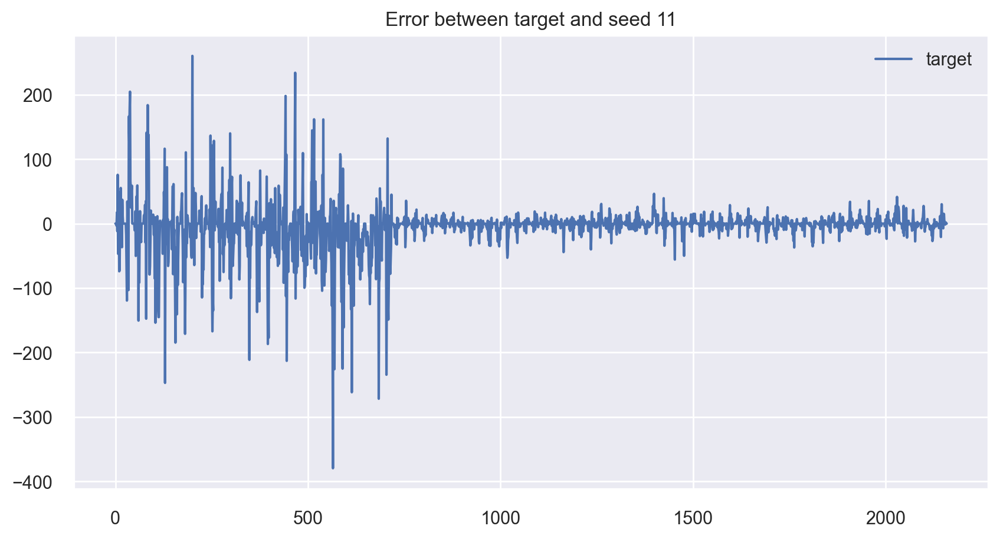

MAE for seed 11: 17.58969035519227


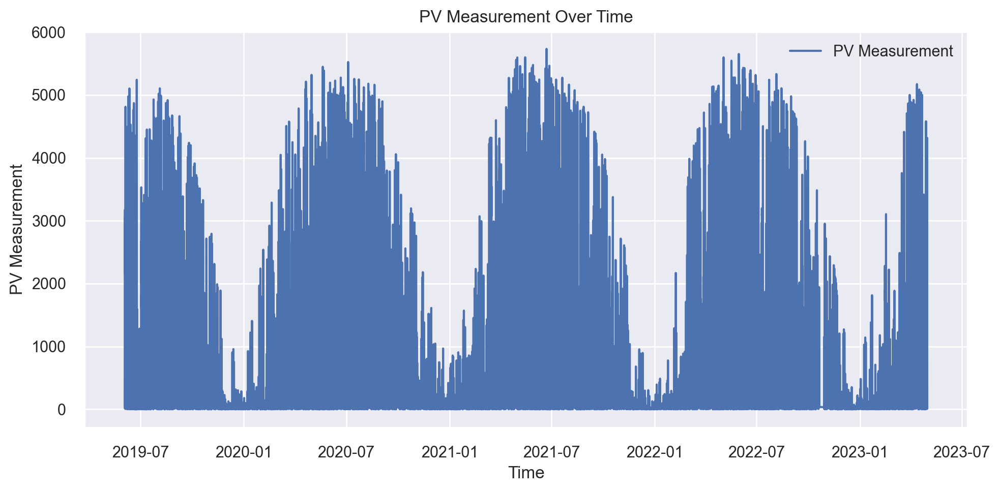

18036 X
18036 y


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     328.4401  273217.6437  522.7023  0.8559  0.8968  3.5048
1     313.9641  258359.9675  508.2912  0.8710  0.9992  4.2813
2     291.6315  217280.0827  466.1331  0.8866  0.9829  4.6435
3     323.1084  277285.7523  526.5793  0.8530  0.9041  2.8564
4     308.6111  250649.2220  500.6488  0.8678  0.9866  4.7907
5     318.8718  249231.7892  499.2312  0.8652  0.9280  3.5829
6     326.3705  266534.1693  516.2695  0.8701  0.9698  4.8958
7     324.0195  261891.6860  511.7535  0.8538  0.9805  4.1438
8     302.0974  243083.3696  493.0349  0.8677  0.9123  3.6287
9     317.1644  261088.7747  510.9685  0.8717  0.9137  3.3879
Mean  315.4279  255862.2457  505.5612  0.8663  0.9474  3.9716
Std    11.0875   16330.9441   16.4346  0.0096  0.0378  0.6460
#############################################
Catboost Done


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     335.0453  298003.5201  545.8970  0.8428  0.8264  2.5452
1     313.7670  266595.1683  516.3285  0.8669  0.9092  3.5164
2     285.6211  219192.2342  468.1797  0.8856  0.8873  2.4671
3     325.8758  281127.0528  530.2142  0.8509  0.8381  2.6156
4     315.1081  257915.8450  507.8542  0.8640  0.8987  3.4513
5     326.0735  265246.0359  515.0204  0.8565  0.8862  3.1078
6     329.0654  287013.1231  535.7361  0.8601  0.8445  2.6333
7     328.5987  273414.4320  522.8905  0.8474  0.9226  3.3024
8     313.7739  263809.5712  513.6240  0.8564  0.8215  2.2000
9     324.9767  273425.0344  522.9006  0.8657  0.8335  2.4510
Mean  319.7905  268574.2017  517.8645  0.8596  0.8668  2.8290
Std    13.2728   20001.2133   19.7625  0.0115  0.0358  0.4467
#############################################
LGBM Done


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     326.3305  279167.5163  528.3631  0.8528  0.8034  2.4931
1     308.9339  256255.2802  506.2166  0.8720  0.9260  3.5053
2     282.8436  212608.8657  461.0953  0.8891  0.8756  2.8542
3     318.5678  272422.6786  521.9413  0.8556  0.8415  2.4188
4     306.1938  248159.1032  498.1557  0.8692  0.8914  3.2805
5     316.3405  250557.4634  500.5572  0.8644  0.8498  2.7938
6     322.3422  270770.2544  520.3559  0.8680  0.8683  3.3167
7     320.8842  261857.8848  511.7205  0.8538  0.8967  3.0455
8     302.5536  247707.9754  497.7027  0.8652  0.8368  2.4540
9     315.5645  260861.3558  510.7459  0.8719  0.8340  2.3531
Mean  312.0555  256036.8378  505.6854  0.8662  0.8624  2.8515
Std    12.0347   17678.3677   17.8635  0.0103  0.0344  0.3989
#############################################
Blended
#############################################
Finalized
float64
date_forecast 

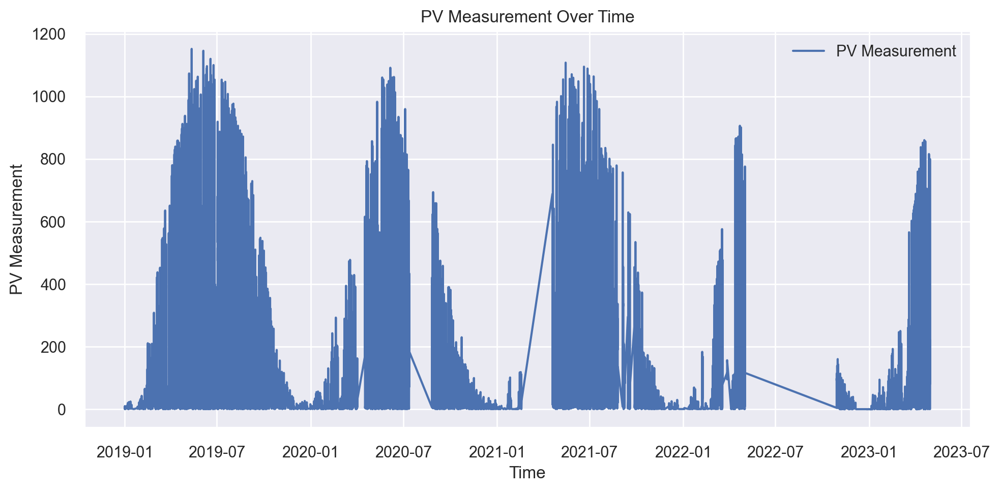

12274 X
12274 y


          MAE        MSE     RMSE      R2   RMSLE     MAPE
Fold                                                      
0     50.6698  7000.4346  83.6686  0.9000  0.6907   1.3721
1     46.2534  5793.7337  76.1166  0.9076  0.7049   1.4861
2     49.0514  6608.7036  81.2939  0.9043  0.7248   1.4514
3     52.9888  7420.0131  86.1395  0.8983  0.6598   1.0979
4     49.2132  6715.2089  81.9464  0.9047  0.7195  31.6714
5     52.1846  7151.2361  84.5650  0.8920  0.7328   1.6790
6     50.3990  6750.0542  82.1587  0.9042  0.7541   1.6907
7     46.3816  6010.8709  77.5298  0.9072  0.6831   1.2816
8     53.0314  7853.9411  88.6225  0.8823  0.7569   3.2294
9     51.4294  7309.4676  85.4954  0.8826  0.7144   1.5825
Mean  50.1603  6861.3664  82.7536  0.8983  0.7141   4.6542
Std    2.3224   596.8436   3.6334  0.0091  0.0291   9.0228
#############################################
Catboost Done


          MAE        MSE     RMSE      R2   RMSLE     MAPE
Fold                                                      
0     50.4776  7275.8712  85.2987  0.8961  0.6978   1.4982
1     47.7053  6061.9541  77.8586  0.9034  0.7097   1.4256
2     50.1560  6893.3347  83.0261  0.9002  0.7231   1.5250
3     54.1773  7800.6952  88.3215  0.8931  0.7033   1.2627
4     50.2415  6823.9477  82.6072  0.9032  0.7359  62.3137
5     53.3858  7675.7208  87.6112  0.8841  0.7606   1.9963
6     49.9178  6658.6272  81.6004  0.9055  0.7099   1.5656
7     50.1104  6851.3340  82.7728  0.8942  0.7090   1.4811
8     54.9149  8437.3585  91.8551  0.8736  0.7569   4.0950
9     51.9274  7461.0063  86.3771  0.8802  0.7056   1.7221
Mean  51.3014  7193.9850  84.7329  0.8933  0.7212   7.8885
Std    2.1317   643.1936   3.7849  0.0102  0.0214  18.1584
#############################################
LGBM Done


          MAE        MSE     RMSE      R2   RMSLE     MAPE
Fold                                                      
0     49.8323  6962.2374  83.4400  0.9005  0.6896   1.3950
1     45.6858  5718.0323  75.6177  0.9089  0.6780   1.3747
2     48.6299  6579.0293  81.1112  0.9048  0.6899   1.4142
3     52.6453  7415.7550  86.1148  0.8983  0.6681   1.1233
4     48.8739  6600.4536  81.2432  0.9064  0.7077  46.9334
5     51.7688  7203.2223  84.8718  0.8912  0.7294   1.7641
6     49.4396  6521.0243  80.7529  0.9074  0.7038   1.5701
7     47.3611  6214.0463  78.8292  0.9041  0.6809   1.3242
8     53.1215  7986.8218  89.3690  0.8803  0.7411   3.6173
9     50.9760  7225.1895  85.0011  0.8840  0.6855   1.5883
Mean  49.8334  6842.5812  82.6351  0.8986  0.6974   6.2105
Std    2.2273   618.0400   3.7448  0.0096  0.0220  13.5907
#############################################
Blended
#############################################
Finalized
float64
date_forecast    datetime64[ns]
is_day:idx              

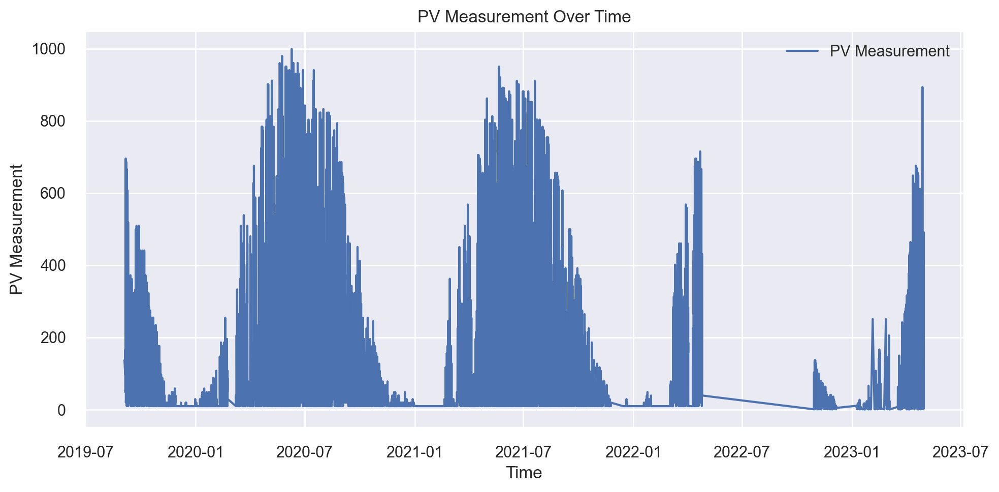

9676 X
9676 y


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     42.9291  5179.3679  71.9678  0.8870  0.4806  0.4875
1     44.2986  5740.5938  75.7667  0.8715  0.5312  0.6477
2     45.2793  5401.1579  73.4926  0.8893  0.5703  0.6321
3     44.3297  5284.6610  72.6957  0.8862  0.5837  0.6195
4     42.6819  4700.7428  68.5620  0.9070  0.5264  0.5183
5     44.3502  5606.5336  74.8768  0.8832  0.5218  0.5839
6     41.6644  4675.3825  68.3768  0.8857  0.5383  0.5947
7     46.8217  5369.2151  73.2749  0.8922  0.5245  0.5493
8     43.7225  5225.2127  72.2856  0.8983  0.5249  0.5873
9     44.7823  5247.3561  72.4386  0.8792  0.5316  0.5607
Mean  44.0860  5243.0223  72.3737  0.8880  0.5333  0.5781
Std    1.3738   322.9633   2.2500  0.0093  0.0265  0.0477
#############################################
Catboost Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     44.7117  5503.4700  74.1854  0.8799  0.4623  0.4792
1     45.0782  5854.3079  76.5134  0.8689  0.5188  0.6353
2     46.8916  5559.4508  74.5617  0.8860  0.5492  0.6303
3     44.7374  5679.3077  75.3612  0.8777  0.5622  0.6941
4     43.4682  4783.9669  69.1662  0.9053  0.4980  0.5573
5     45.0426  5778.4242  76.0159  0.8797  0.5424  0.7120
6     44.2008  4933.3029  70.2375  0.8794  0.5568  0.6693
7     47.6043  5528.3081  74.3526  0.8891  0.5206  0.6136
8     46.1103  5482.5039  74.0439  0.8933  0.5185  0.6435
9     45.0361  5404.8999  73.5180  0.8756  0.4944  0.5548
Mean  45.2881  5450.7942  73.7956  0.8835  0.5223  0.6189
Std    1.1794   325.3522   2.2371  0.0098  0.0298  0.0673
#############################################
LGBM Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     42.9391  5176.2935  71.9465  0.8870  0.4532  0.4676
1     43.9156  5652.1480  75.1808  0.8734  0.5160  0.6277
2     45.4019  5348.9003  73.1362  0.8903  0.5333  0.6056
3     43.6875  5324.7971  72.9712  0.8853  0.5523  0.6163
4     42.0439  4586.1379  67.7210  0.9093  0.4959  0.5086
5     43.7049  5530.8713  74.3698  0.8848  0.5057  0.6068
6     42.1204  4687.3483  68.4642  0.8854  0.5312  0.5913
7     46.4849  5312.7276  72.8885  0.8934  0.5222  0.5700
8     43.9952  5203.9570  72.1385  0.8987  0.5015  0.5936
9     44.0242  5177.6979  71.9562  0.8808  0.4907  0.5449
Mean  43.8318  5200.0879  72.0773  0.8888  0.5102  0.5733
Std    1.2859   317.0300   2.2256  0.0094  0.0262  0.0489
#############################################
Blended
#############################################
Finalized
float64
date_forecast    datetime64[ns]
is_day:idx              float32
dtype:

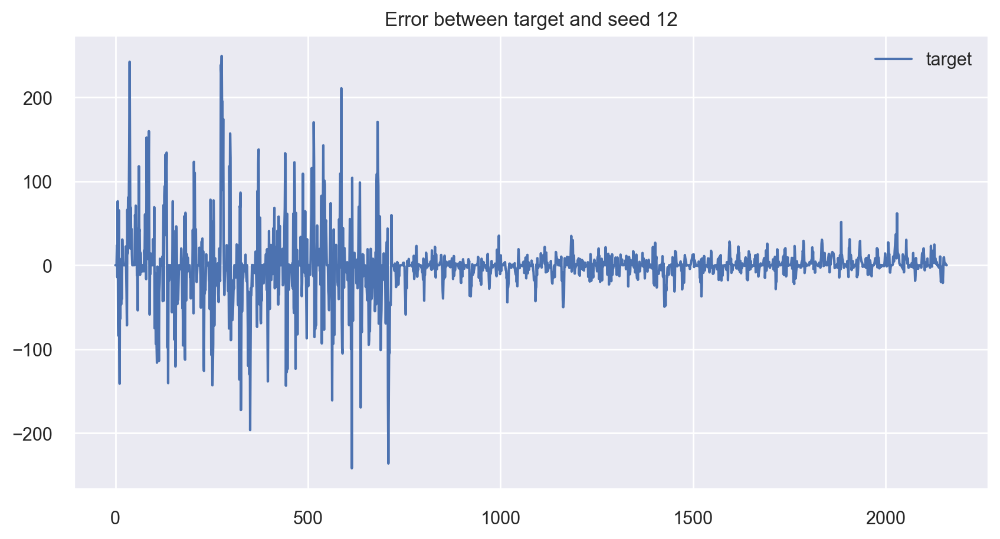

MAE for seed 12: 16.81027656017218


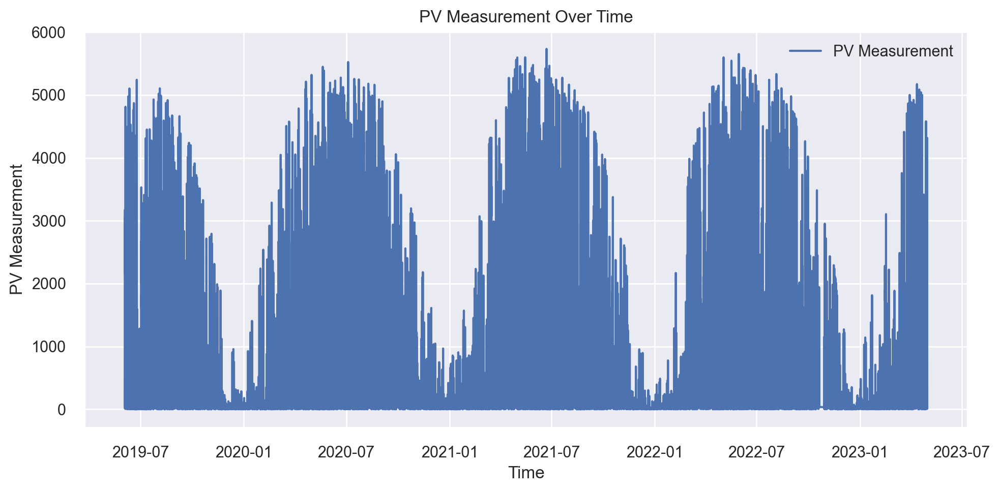

18036 X
18036 y


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     303.9586  241676.3377  491.6059  0.8618  1.0039  4.3204
1     334.4265  284691.8335  533.5652  0.8576  0.9431  4.7629
2     314.7706  265308.8528  515.0814  0.8593  0.9706  4.8822
3     315.9884  252833.4464  502.8255  0.8699  0.9235  2.4959
4     319.9701  257002.2378  506.9539  0.8681  1.0099  4.8627
5     335.6408  283092.8018  532.0647  0.8551  0.9055  3.5080
6     307.3566  250251.8905  500.2518  0.8595  0.9639  3.7270
7     312.1816  244581.4669  494.5518  0.8674  0.9833  4.2081
8     300.5209  256089.5626  506.0529  0.8748  0.9321  3.2070
9     321.0574  260456.0793  510.3490  0.8598  0.9113  3.9444
Mean  316.5871  259598.4509  509.3302  0.8633  0.9547  3.9919
Std    11.1292   13834.3581   13.4610  0.0060  0.0354  0.7390
#############################################
Catboost Done


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     307.4283  249683.6317  499.6835  0.8572  0.8490  2.5097
1     346.4690  303609.4248  551.0076  0.8482  0.8621  3.1114
2     328.0197  286498.3119  535.2554  0.8481  0.8699  2.8486
3     320.4422  263744.8416  513.5609  0.8643  0.8386  2.1265
4     321.2951  277448.3028  526.7336  0.8576  0.8828  2.7193
5     347.8722  304449.3224  551.7693  0.8442  0.8278  2.1134
6     322.5370  278269.3961  527.5125  0.8438  0.8950  2.8541
7     315.5829  247779.1713  497.7742  0.8657  0.8960  3.0892
8     302.9032  272048.8822  521.5831  0.8670  0.8350  2.3645
9     323.0599  272387.4038  521.9075  0.8533  0.8516  2.9939
Mean  323.5609  275591.8689  524.6788  0.8549  0.8608  2.6731
Std    13.7932   18317.3644   17.4376  0.0083  0.0234  0.3561
#############################################
LGBM Done


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     300.3261  239477.9222  489.3648  0.8630  0.8881  2.7874
1     334.4448  288132.9089  536.7801  0.8559  0.8388  3.2180
2     315.9505  269344.5847  518.9842  0.8572  0.8834  3.3657
3     312.3089  252638.9923  502.6321  0.8700  0.8380  2.0640
4     314.5718  260701.2391  510.5891  0.8662  0.9187  3.2632
5     336.5129  287566.4548  536.2522  0.8528  0.8492  2.4346
6     309.9209  258326.2323  508.2580  0.8550  0.8954  2.7858
7     309.1709  240597.9694  490.5079  0.8696  0.8911  3.1018
8     297.0689  258884.2320  508.8067  0.8734  0.8456  2.5095
9     317.0643  260164.7087  510.0634  0.8599  0.8412  2.8302
Mean  314.7340  261583.5244  511.2239  0.8623  0.8689  2.8360
Std    12.0391   15716.1063   15.2871  0.0068  0.0280  0.3935
#############################################
Blended
#############################################
Finalized
float64
date_forecast 

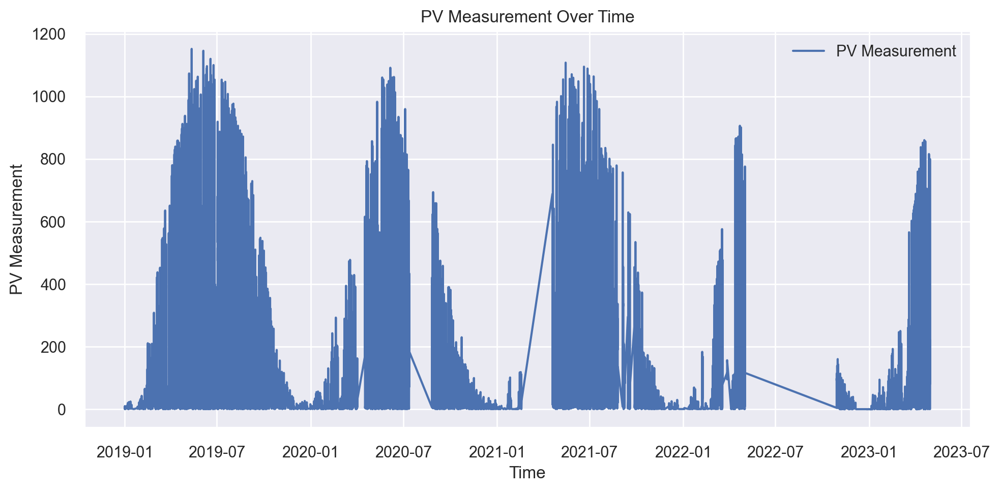

12274 X
12274 y


          MAE        MSE     RMSE      R2   RMSLE     MAPE
Fold                                                      
0     48.9978  6110.8346  78.1718  0.9078  0.7640   1.8051
1     52.3693  7688.3630  87.6833  0.8867  0.7383   1.6344
2     49.7115  6493.0293  80.5793  0.9115  0.7138   1.5980
3     52.3305  7727.0462  87.9036  0.8763  0.7624   1.7897
4     48.8512  6266.9990  79.1644  0.9013  0.7543   1.6533
5     49.3772  6216.9344  78.8475  0.9055  0.7059   1.4696
6     46.8753  6294.3406  79.3369  0.9014  0.7139   1.9647
7     53.1305  8250.3278  90.8313  0.8725  0.7221   1.8919
8     51.0567  7353.1981  85.7508  0.8948  0.7308  54.2491
9     53.8232  8343.4765  91.3426  0.8904  0.7061   1.8860
Mean  50.6523  7074.4549  83.9612  0.8948  0.7312   6.9942
Std    2.1185   844.7528   4.9978  0.0125  0.0214  15.7523
#############################################
Catboost Done


          MAE        MSE     RMSE      R2   RMSLE     MAPE
Fold                                                      
0     50.4465  6596.4788  81.2187  0.9004  0.7705   1.6913
1     53.4723  8030.9797  89.6157  0.8816  0.7187   1.5479
2     52.3326  7095.1889  84.2329  0.9033  0.7307   1.9119
3     54.1159  8355.7962  91.4100  0.8662  0.7608   2.0520
4     50.1629  7075.7022  84.1172  0.8885  0.7372   1.6455
5     50.7826  6917.5976  83.1721  0.8948  0.7027   1.6797
6     46.9480  6197.8000  78.7261  0.9029  0.6924   2.1494
7     53.7951  8307.9177  91.1478  0.8716  0.7367   1.8448
8     52.3897  7602.4451  87.1920  0.8912  0.7312  87.5869
9     54.9948  8396.7610  91.6338  0.8897  0.7156   2.1590
Mean  51.9440  7457.6667  86.2466  0.8890  0.7297  10.4269
Std    2.2773   752.2619   4.3798  0.0120  0.0228  25.7208
#############################################
LGBM Done


          MAE        MSE     RMSE      R2   RMSLE     MAPE
Fold                                                      
0     48.9445  6134.1533  78.3208  0.9074  0.7591   1.7009
1     52.1887  7667.7901  87.5659  0.8870  0.6907   1.4795
2     50.0337  6590.2227  81.1802  0.9102  0.7032   1.6718
3     52.1965  7872.6768  88.7281  0.8740  0.7437   1.6233
4     48.4291  6484.6455  80.5273  0.8979  0.7298   1.5967
5     49.4179  6394.4292  79.9652  0.9028  0.6922   1.4987
6     46.0541  6074.5109  77.9391  0.9048  0.6833   1.9528
7     52.5305  8091.8088  89.9545  0.8749  0.7247   1.8071
8     50.7338  7276.7640  85.3040  0.8959  0.7060  70.8271
9     53.5849  8191.7825  90.5085  0.8924  0.6909   1.5412
Mean  50.4114  7077.8784  83.9994  0.8947  0.7123   8.5699
Std    2.1727   790.0818   4.6890  0.0121  0.0244  20.7529
#############################################
Blended
#############################################
Finalized
float64
date_forecast    datetime64[ns]
is_day:idx              

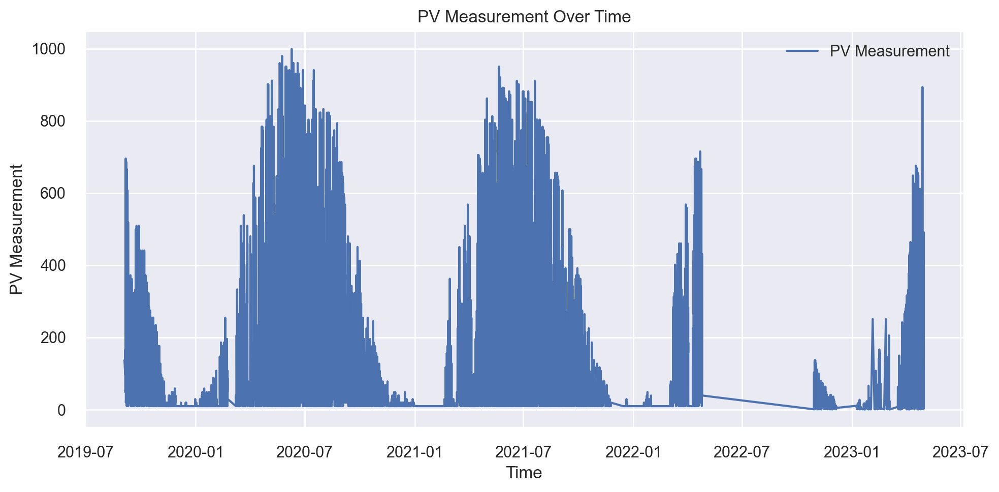

9676 X
9676 y


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     42.5670  4690.4240  68.4867  0.9047  0.4666  0.4602
1     46.8791  5522.2335  74.3117  0.8825  0.5331  0.5290
2     41.4671  4496.9963  67.0596  0.9015  0.5163  0.5268
3     45.4807  5519.9716  74.2965  0.8884  0.5871  0.7002
4     43.6553  5008.5479  70.7711  0.9009  0.5776  0.7870
5     43.5970  5560.4007  74.5681  0.8844  0.5159  0.5900
6     41.9134  4555.1174  67.4916  0.8921  0.4936  0.4661
7     43.0762  4802.2852  69.2985  0.8851  0.5314  0.5181
8     41.0533  4658.5257  68.2534  0.9003  0.5569  0.7250
9     44.1409  5193.6963  72.0673  0.8775  0.4825  0.5536
Mean  43.3830  5000.8199  70.6605  0.8918  0.5261  0.5856
Std    1.7127   399.6496   2.8142  0.0091  0.0375  0.1074
#############################################
Catboost Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     44.5739  5015.9107  70.8231  0.8981  0.4666  0.4775
1     46.4685  5461.4419  73.9016  0.8838  0.5390  0.5999
2     42.1079  4514.4973  67.1900  0.9012  0.5212  0.5863
3     47.2702  6125.9396  78.2684  0.8762  0.5668  0.7006
4     45.7361  5288.1652  72.7198  0.8954  0.5808  0.8400
5     44.4495  5477.3146  74.0089  0.8861  0.5304  0.6609
6     42.4937  4413.0716  66.4310  0.8955  0.4982  0.5255
7     44.1004  5269.0290  72.5881  0.8739  0.5311  0.6108
8     40.6850  4541.1825  67.3883  0.9029  0.5393  0.6928
9     44.5891  5429.6074  73.6859  0.8719  0.5175  0.6261
Mean  44.2474  5153.6160  71.7005  0.8885  0.5291  0.6320
Std    1.9213   510.2413   3.5575  0.0111  0.0306  0.0956
#############################################
LGBM Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     42.8669  4705.0276  68.5932  0.9044  0.4439  0.4365
1     46.0771  5359.3662  73.2077  0.8860  0.5126  0.5491
2     41.0159  4384.0210  66.2119  0.9040  0.4892  0.5360
3     45.5668  5681.7103  75.3771  0.8852  0.5598  0.6731
4     43.9170  5018.7251  70.8430  0.9007  0.5644  0.7936
5     43.3724  5384.2276  73.3773  0.8880  0.5184  0.6117
6     41.2780  4345.0547  65.9170  0.8971  0.4631  0.4655
7     42.7356  4881.8306  69.8701  0.8832  0.5063  0.5460
8     40.0714  4472.8345  66.8793  0.9043  0.5543  0.6800
9     43.6245  5158.9938  71.8261  0.8783  0.4993  0.5613
Mean  43.0526  4939.1791  70.2103  0.8931  0.5111  0.5853
Std    1.8156   437.8814   3.1140  0.0095  0.0382  0.1015
#############################################
Blended
#############################################
Finalized
float64
date_forecast    datetime64[ns]
is_day:idx              float32
dtype:

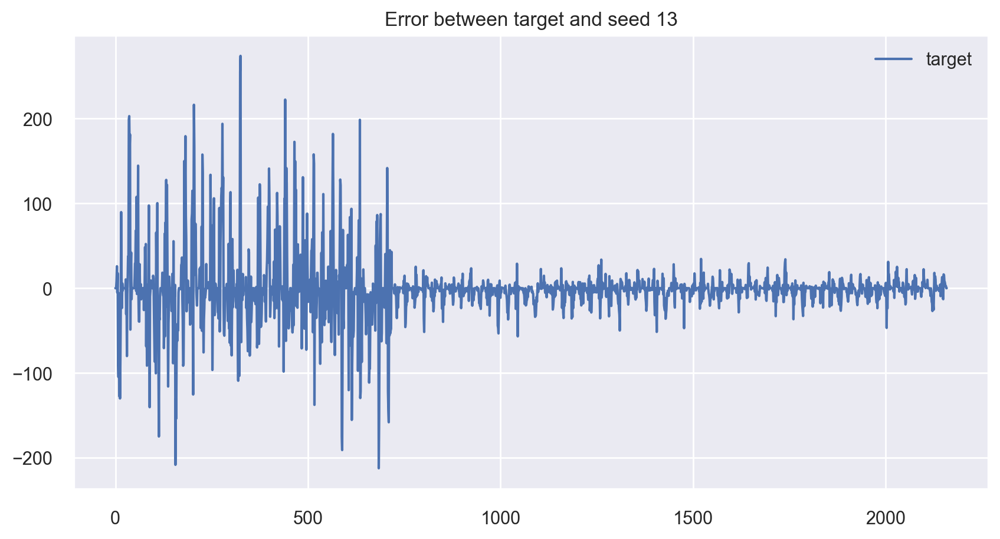

MAE for seed 13: 17.38280750869509


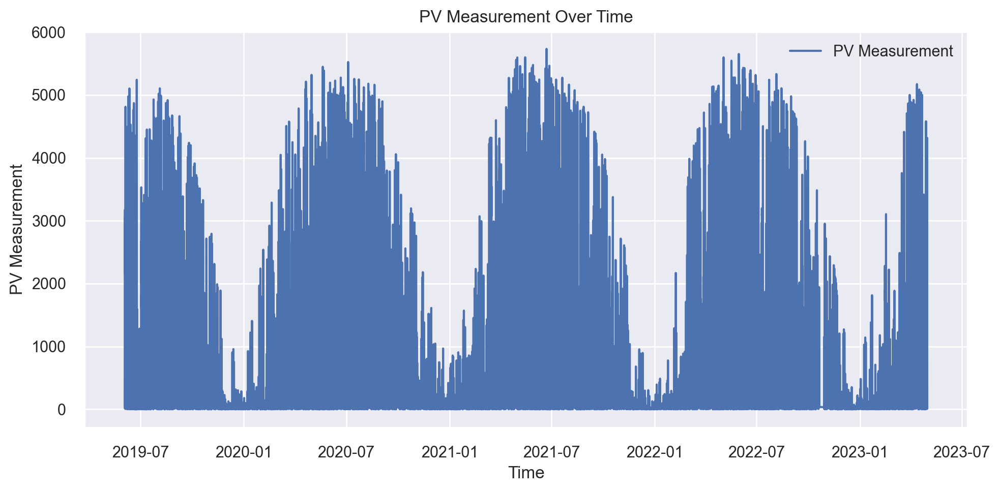

18036 X
18036 y


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     320.7447  259924.6020  509.8280  0.8545  0.9531  3.7863
1     311.8610  247271.7413  497.2643  0.8740  0.9231  3.4849
2     313.5620  258943.4536  508.8649  0.8731  0.9810  3.9744
3     337.9434  291680.6483  540.0747  0.8522  0.8769  3.3934
4     299.7033  231058.2709  480.6852  0.8780  0.9512  4.0771
5     315.6306  262016.8373  511.8758  0.8585  0.9852  3.8714
6     328.2828  271002.8210  520.5793  0.8548  0.9233  3.7223
7     332.3767  290046.4714  538.5596  0.8484  0.9001  2.7054
8     295.3873  241361.0789  491.2851  0.8645  0.9425  3.5816
9     314.7090  245295.9299  495.2736  0.8752  0.8963  3.3179
Mean  317.0201  259860.1855  509.4290  0.8633  0.9333  3.5915
Std    12.7594   18962.4930   18.4995  0.0104  0.0341  0.3777
#############################################
Catboost Done


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     314.0135  253872.5037  503.8576  0.8579  0.8360  2.9579
1     321.9337  261031.8351  510.9127  0.8670  0.8445  2.6489
2     324.8869  274908.8331  524.3175  0.8653  0.9095  3.1819
3     351.5920  312244.0601  558.7880  0.8418  0.8240  2.7722
4     309.6853  250709.1152  500.7086  0.8676  0.8869  3.2268
5     325.5037  276163.1911  525.5123  0.8509  0.8443  2.2409
6     335.7001  279409.8125  528.5923  0.8503  0.8222  2.4092
7     333.7168  306022.5420  553.1930  0.8401  0.8161  1.9768
8     312.7135  275606.1788  524.9821  0.8453  0.8719  2.4861
9     325.3586  266434.4485  516.1729  0.8644  0.8090  2.3327
Mean  325.5104  275640.2520  524.7037  0.8551  0.8464  2.6233
Std    11.8786   19161.1341   18.0629  0.0102  0.0313  0.3904
#############################################
LGBM Done


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     311.7033  250835.0213  500.8343  0.8596  0.8488  2.7202
1     310.7641  247252.8464  497.2453  0.8740  0.8441  2.5264
2     313.7362  260421.1257  510.3147  0.8724  0.8996  3.1191
3     340.9108  296040.7577  544.0963  0.8500  0.8140  2.5726
4     298.5549  234246.9260  483.9906  0.8763  0.8574  3.3018
5     315.5939  262764.3055  512.6054  0.8581  0.8670  2.3779
6     326.7312  268636.4243  518.3015  0.8561  0.8343  2.4733
7     328.1397  291930.2054  540.3057  0.8475  0.8360  1.9420
8     297.8641  252262.9604  502.2579  0.8584  0.8580  2.6256
9     315.0400  249928.7202  499.9287  0.8728  0.8030  2.2208
Mean  315.9038  261431.9293  510.9880  0.8625  0.8462  2.5880
Std    12.5233   18577.8810   17.9766  0.0100  0.0259  0.3773
#############################################
Blended
#############################################
Finalized
float64
date_forecast 

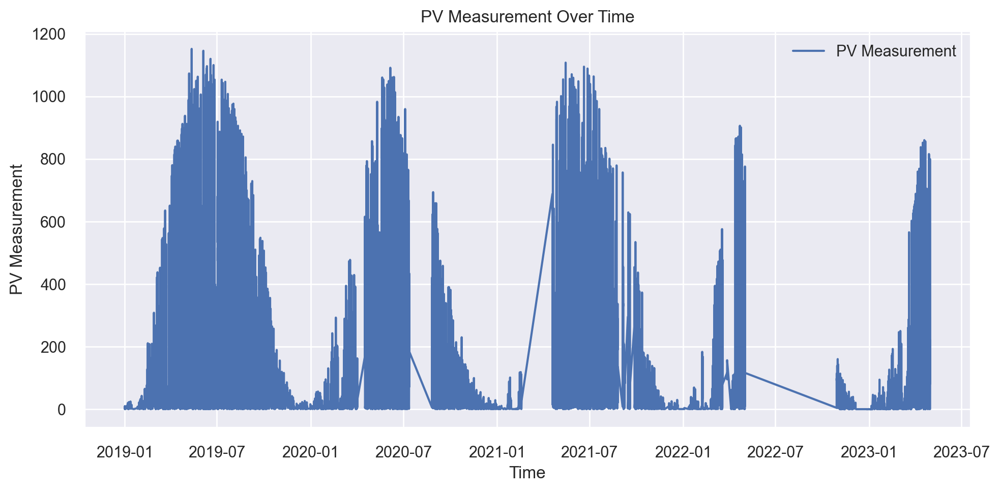

12274 X
12274 y


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     49.9177  7149.6125  84.5554  0.8735  0.7415  1.6963
1     51.8402  7504.7206  86.6298  0.9045  0.6979  1.4052
2     50.9469  7169.4477  84.6726  0.8961  0.7564  1.9831
3     47.7128  5746.8936  75.8083  0.9087  0.7607  2.1075
4     48.3793  6463.5491  80.3962  0.9085  0.6721  1.1038
5     52.2536  7347.9624  85.7203  0.8878  0.7474  1.6788
6     46.9636  6248.9220  79.0501  0.9122  0.7413  3.1168
7     54.4994  7983.7444  89.3518  0.8775  0.7268  1.5918
8     51.4417  6859.1923  82.8202  0.8964  0.6834  1.3455
9     50.6079  7126.4547  84.4183  0.8934  0.7414  1.5423
Mean  50.4563  6960.0499  83.3423  0.8959  0.7269  1.7571
Std    2.1692   619.4111   3.7565  0.0125  0.0297  0.5316
#############################################
Catboost Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     50.6182  7348.7915  85.7251  0.8700  0.7477  1.8714
1     52.0186  7410.5750  86.0847  0.9057  0.7238  1.5431
2     51.2614  7070.3753  84.0855  0.8975  0.7614  1.9696
3     49.2229  6021.4349  77.5979  0.9043  0.7667  2.0117
4     50.1846  6866.0606  82.8617  0.9028  0.6822  1.1270
5     51.3184  6790.9903  82.4075  0.8963  0.7402  1.7636
6     49.3552  6664.6156  81.6371  0.9063  0.7359  2.3150
7     54.5608  8002.6324  89.4574  0.8772  0.7261  1.6059
8     52.8131  7382.1785  85.9196  0.8885  0.6729  1.3711
9     52.0511  7414.3198  86.1064  0.8891  0.7295  1.9878
Mean  51.3404  7097.1974  84.1883  0.8938  0.7286  1.7566
Std    1.5425   515.3054   3.0868  0.0118  0.0289  0.3320
#############################################
LGBM Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     49.3044  7047.4836  83.9493  0.8753  0.7225  1.6906
1     51.1198  7259.7763  85.2043  0.9077  0.6866  1.3933
2     50.0471  6952.1578  83.3796  0.8992  0.7388  1.8446
3     47.6636  5703.9718  75.5246  0.9094  0.7621  2.0129
4     48.4103  6489.5335  80.5576  0.9081  0.6577  1.0642
5     50.7993  6860.2681  82.8267  0.8953  0.7209  1.6571
6     47.1701  6252.7420  79.0743  0.9121  0.7121  2.6353
7     53.5547  7815.2518  88.4039  0.8801  0.7156  1.5056
8     51.4011  6967.8487  83.4736  0.8948  0.6530  1.2731
9     50.2732  7074.1861  84.1082  0.8942  0.7068  1.6249
Mean  49.9744  6842.3220  82.6502  0.8976  0.7076  1.6701
Std    1.8177   548.8862   3.3559  0.0118  0.0322  0.4136
#############################################
Blended
#############################################
Finalized
float64
date_forecast    datetime64[ns]
is_day:idx              float32
dtype:

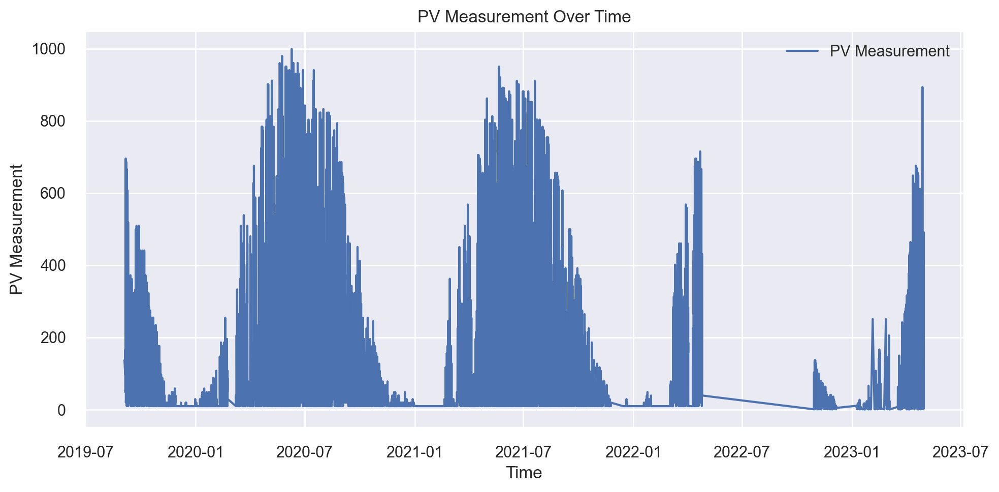

9676 X
9676 y


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     43.3343  5388.7546  73.4081  0.8846  0.5122  0.5358
1     44.1222  4944.6469  70.3182  0.9009  0.5601  0.6446
2     46.4705  6038.2850  77.7064  0.8772  0.5151  0.4946
3     45.2149  5316.8068  72.9164  0.8829  0.5151  0.6011
4     43.1194  4221.1688  64.9705  0.9023  0.4932  0.5823
5     45.4734  5137.1863  71.6742  0.8971  0.5253  0.5780
6     48.0877  6279.1289  79.2410  0.8658  0.5739  0.7373
7     44.6470  5450.8055  73.8296  0.8822  0.5216  0.5534
8     44.5039  5328.7051  72.9980  0.8805  0.5129  0.5310
9     45.8014  6068.5064  77.9006  0.8577  0.5388  0.6473
Mean  45.0775  5417.3994  73.4963  0.8831  0.5268  0.5905
Std    1.4143   574.8844   3.9615  0.0137  0.0230  0.0672
#############################################
Catboost Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     44.3165  5477.6603  74.0112  0.8827  0.5062  0.5831
1     44.1452  5051.1366  71.0713  0.8987  0.5660  0.7820
2     47.3657  6204.7129  78.7700  0.8738  0.5315  0.5693
3     47.0488  5789.0811  76.0860  0.8725  0.5237  0.6530
4     43.7425  4506.1076  67.1275  0.8957  0.4996  0.6274
5     45.1403  5210.8104  72.1859  0.8956  0.5081  0.5683
6     48.3797  6509.4708  80.6813  0.8609  0.5854  0.7591
7     43.5718  5171.7951  71.9152  0.8882  0.5202  0.5935
8     44.4713  5215.3651  72.2175  0.8830  0.4932  0.5466
9     45.7270  5905.3914  76.8465  0.8615  0.5480  0.6522
Mean  45.3909  5504.1531  74.0913  0.8813  0.5282  0.6334
Std    1.5917   567.9397   3.8260  0.0131  0.0285  0.0766
#############################################
LGBM Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     43.0173  5304.2197  72.8301  0.8864  0.4958  0.5250
1     43.2872  4863.5409  69.7391  0.9025  0.5409  0.6881
2     46.2990  5989.4332  77.3914  0.8781  0.4973  0.5167
3     45.4637  5420.4100  73.6234  0.8806  0.5094  0.5957
4     42.5572  4232.0300  65.0541  0.9020  0.4789  0.5771
5     44.5984  5049.2652  71.0582  0.8989  0.5112  0.5563
6     47.6405  6242.1489  79.0073  0.8666  0.5789  0.7275
7     43.1725  5174.4115  71.9334  0.8882  0.5072  0.5497
8     43.7147  5148.2915  71.7516  0.8845  0.4774  0.5045
9     44.7468  5869.0345  76.6096  0.8624  0.5406  0.6260
Mean  44.4497  5329.2785  72.8998  0.8850  0.5138  0.5866
Std    1.5458   559.0545   3.8595  0.0131  0.0298  0.0704
#############################################
Blended
#############################################
Finalized
float64
date_forecast    datetime64[ns]
is_day:idx              float32
dtype:

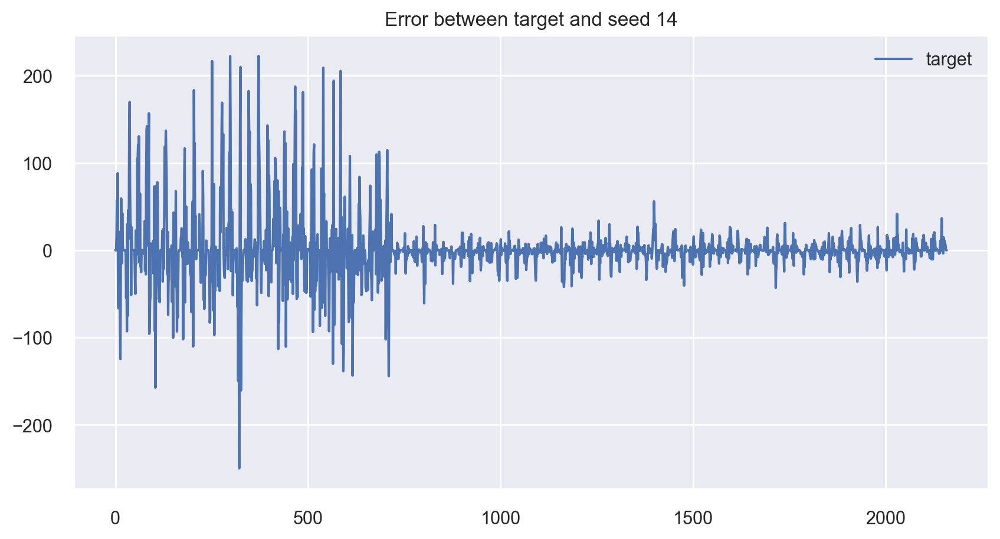

MAE for seed 14: 16.803938045175755


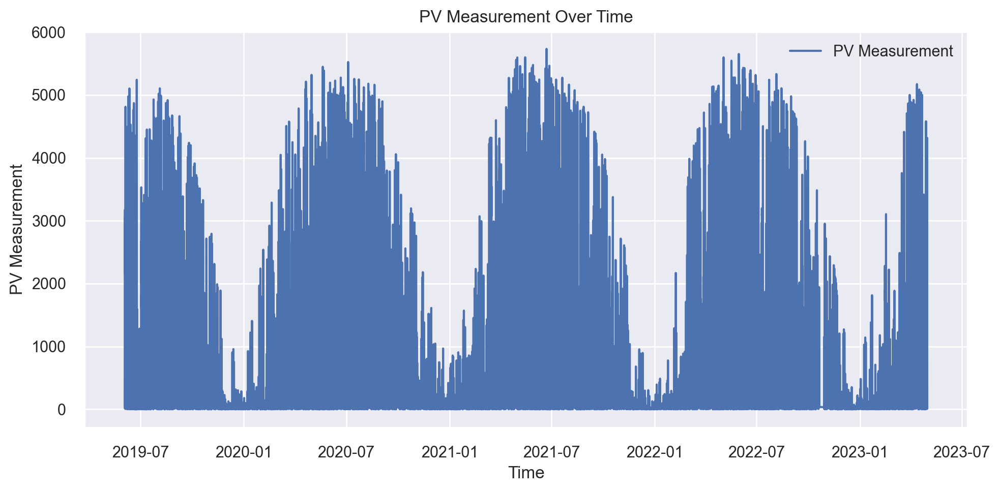

18036 X
18036 y


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     337.9805  295404.4374  543.5112  0.8485  0.8805  3.1144
1     323.4316  269028.5034  518.6796  0.8455  0.9500  3.9098
2     318.0211  250005.2453  500.0052  0.8650  0.9159  2.6010
3     322.8303  258091.6950  508.0273  0.8608  0.9330  3.2891
4     327.8681  285114.4578  533.9611  0.8552  0.9484  4.7826
5     327.2913  279199.3216  528.3932  0.8589  0.9211  3.3439
6     304.1621  236104.5125  485.9059  0.8743  1.0005  4.5931
7     317.8822  268620.5127  518.2861  0.8541  0.9907  5.1600
8     308.5517  257763.3609  507.7040  0.8607  0.9127  3.3526
9     300.1125  231271.5213  480.9070  0.8861  0.9842  5.6912
Mean  318.8131  263060.3568  512.5381  0.8609  0.9437  3.9838
Std    11.0900   19544.4430   19.1076  0.0114  0.0367  0.9629
#############################################
Catboost Done


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     335.6186  304021.3938  551.3814  0.8441  0.8253  2.8085
1     319.9753  269538.1164  519.1706  0.8452  0.8576  2.9286
2     327.5369  272464.4391  521.9813  0.8529  0.8424  2.0933
3     324.7983  270143.7862  519.7536  0.8543  0.8499  2.3897
4     331.6717  289312.0658  537.8774  0.8531  0.8550  2.9178
5     334.2151  290661.2721  539.1301  0.8531  0.8977  2.9413
6     310.3361  251749.8282  501.7468  0.8660  0.8789  2.7913
7     324.9707  283698.7492  532.6338  0.8459  0.8407  2.6812
8     319.5958  275557.7260  524.9359  0.8511  0.8443  2.5652
9     309.8513  246818.8108  496.8086  0.8784  0.9168  3.5787
Mean  323.8570  275396.6188  524.5419  0.8544  0.8608  2.7696
Std     8.5707   16617.3168   15.8862  0.0100  0.0270  0.3721
#############################################
LGBM Done


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     331.8337  293656.1389  541.9005  0.8494  0.8211  2.6175
1     317.0114  263773.0409  513.5884  0.8485  0.8370  2.7205
2     317.5192  254784.4169  504.7617  0.8624  0.8400  1.9826
3     318.1028  258066.4259  508.0024  0.8608  0.8617  2.2789
4     323.6054  281116.8100  530.2045  0.8573  0.8526  3.2769
5     324.7886  278216.8936  527.4627  0.8594  0.8784  2.7877
6     302.4165  237913.9881  487.7643  0.8733  0.8800  3.1944
7     315.6954  269884.3735  519.5040  0.8534  0.8622  3.2069
8     308.0598  260362.1460  510.2569  0.8593  0.8558  2.6419
9     298.5305  233103.3580  482.8078  0.8852  0.9027  3.9750
Mean  315.7563  263087.7592  512.6253  0.8609  0.8591  2.8682
Std     9.7251   17802.8035   17.4081  0.0105  0.0225  0.5373
#############################################
Blended
#############################################
Finalized
float64
date_forecast 

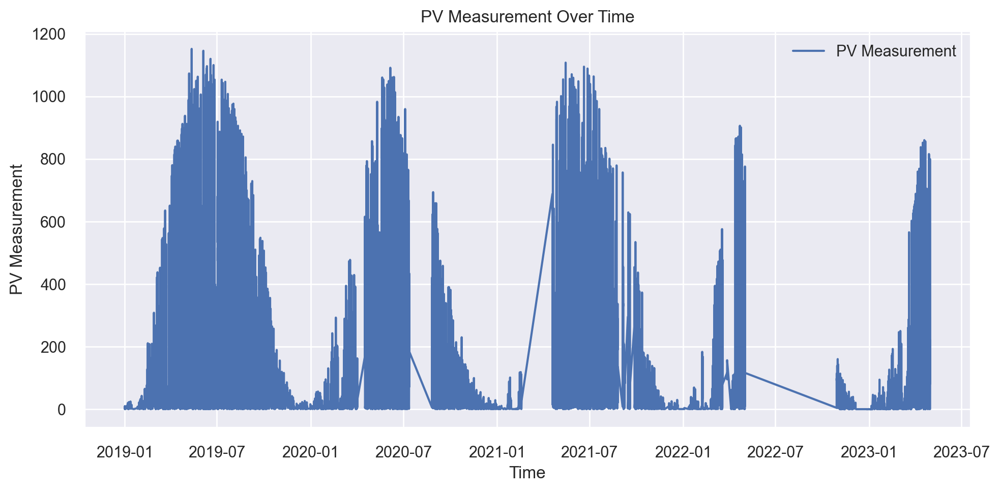

12274 X
12274 y


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     50.7288  7303.5051  85.4605  0.8930  0.6894  1.5501
1     50.2493  6900.6273  83.0700  0.8995  0.7227  1.8887
2     45.0150  5591.0441  74.7733  0.9101  0.7079  1.2135
3     50.8331  7148.7661  84.5504  0.9003  0.7146  1.8541
4     49.6992  6900.9206  83.0718  0.9033  0.7530  1.7156
5     51.0927  7456.6520  86.3519  0.8894  0.7230  1.6673
6     50.6859  6881.8298  82.9568  0.9055  0.6803  1.3927
7     52.1326  7402.6054  86.0384  0.8858  0.6938  1.3610
8     50.0520  6940.3219  83.3086  0.9006  0.7056  1.4017
9     51.7575  7613.7009  87.2565  0.8858  0.7022  2.2411
Mean  50.2246  7013.9973  83.6838  0.8973  0.7092  1.6286
Std    1.8716   536.8345   3.3189  0.0080  0.0196  0.2932
#############################################
Catboost Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     51.2369  7496.3589  86.5815  0.8902  0.6753  1.4148
1     51.6732  7283.6734  85.3444  0.8939  0.6939  1.7533
2     44.8312  5708.7248  75.5561  0.9082  0.7049  1.2824
3     50.1638  6896.7429  83.0466  0.9039  0.6941  1.7698
4     50.6078  7215.2186  84.9424  0.8989  0.7643  1.6789
5     52.4815  7654.5488  87.4903  0.8865  0.6806  1.8462
6     50.9590  6690.2058  81.7937  0.9082  0.6919  1.5348
7     54.0047  8386.8037  91.5795  0.8707  0.6984  1.4485
8     50.7865  6978.6648  83.5384  0.9000  0.7092  1.5817
9     52.2718  7753.6501  88.0548  0.8837  0.6723  1.9595
Mean  50.9016  7206.4592  84.7928  0.8944  0.6985  1.6270
Std    2.2849   681.2515   4.0797  0.0113  0.0247  0.2010
#############################################
LGBM Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     49.9482  7208.4082  84.9023  0.8944  0.6711  1.4160
1     50.1043  6925.5229  83.2197  0.8991  0.6869  1.7606
2     43.9281  5486.0546  74.0679  0.9118  0.6807  1.1752
3     49.4947  6806.8167  82.5034  0.9051  0.6805  1.7446
4     49.2576  6872.6588  82.9015  0.9037  0.7402  1.6209
5     50.9464  7367.0348  85.8314  0.8908  0.6765  1.7080
6     50.0113  6615.7781  81.3374  0.9092  0.6597  1.3845
7     52.3593  7705.8572  87.7830  0.8812  0.6837  1.3466
8     49.4114  6751.8346  82.1695  0.9033  0.6924  1.4315
9     51.0137  7499.5766  86.6001  0.8875  0.6595  1.9995
Mean  49.6475  6923.9542  83.1316  0.8986  0.6831  1.5587
Std    2.1043   585.5302   3.6172  0.0094  0.0216  0.2355
#############################################
Blended
#############################################
Finalized
float64
date_forecast    datetime64[ns]
is_day:idx              float32
dtype:

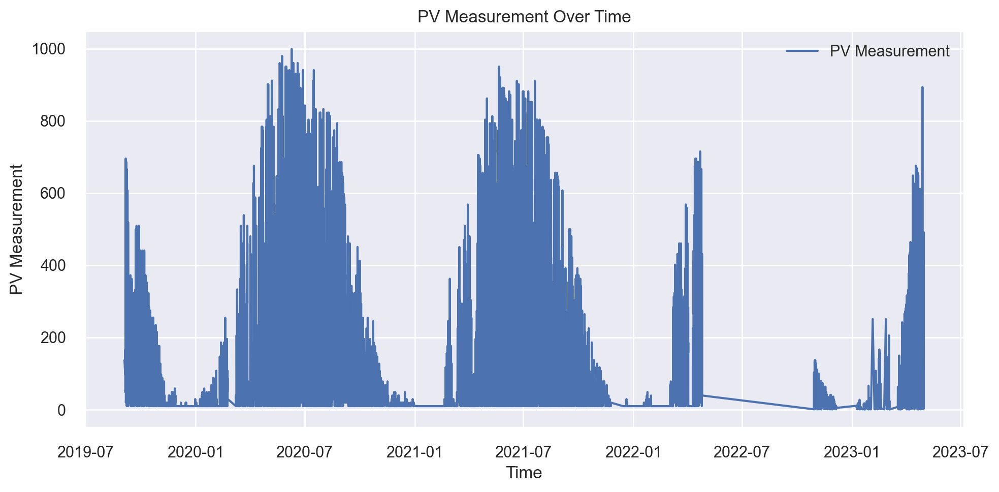

9676 X
9676 y


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     44.1359  5314.2231  72.8987  0.8887  0.5385  0.5897
1     44.0244  4704.5729  68.5899  0.8976  0.5185  0.5719
2     42.7825  4877.4807  69.8390  0.8935  0.5374  0.6697
3     46.7949  5683.9524  75.3920  0.8793  0.5687  0.6583
4     42.9340  4934.8731  70.2487  0.9053  0.5224  0.5204
5     46.4726  5702.9057  75.5176  0.8878  0.5257  0.5705
6     47.2696  5735.5726  75.7336  0.8696  0.5250  0.5860
7     41.1828  4350.0019  65.9545  0.9034  0.5389  0.5556
8     42.9038  5069.1372  71.1979  0.8955  0.5306  0.5777
9     49.2750  6434.0879  80.2128  0.8626  0.5454  0.5907
Mean  44.7775  5280.6807  72.5585  0.8883  0.5351  0.5891
Std    2.4119   583.4611   3.9939  0.0133  0.0138  0.0423
#############################################
Catboost Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     44.7322  5412.3304  73.5685  0.8867  0.5186  0.5847
1     43.7955  4685.3478  68.4496  0.8980  0.5119  0.5826
2     42.3411  4910.2741  70.0733  0.8928  0.5460  0.7363
3     47.1453  5965.8481  77.2389  0.8733  0.5373  0.6464
4     45.1039  5399.5675  73.4817  0.8964  0.5029  0.5787
5     46.7138  5666.9026  75.2788  0.8885  0.5332  0.6462
6     47.6373  5944.1685  77.0984  0.8648  0.5361  0.6602
7     42.1751  4651.7291  68.2036  0.8967  0.5215  0.6124
8     43.0699  4953.2585  70.3794  0.8979  0.5177  0.6172
9     49.9369  6697.3763  81.8375  0.8570  0.5456  0.6014
Mean  45.2651  5428.6803  73.5610  0.8852  0.5271  0.6266
Std    2.4181   622.3101   4.1787  0.0142  0.0139  0.0456
#############################################
LGBM Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     43.6185  5219.7107  72.2476  0.8907  0.5112  0.5682
1     42.9424  4520.3902  67.2338  0.9016  0.4910  0.5510
2     41.3424  4751.8744  68.9338  0.8962  0.5122  0.6355
3     46.1065  5679.3960  75.3618  0.8794  0.5408  0.6373
4     43.1105  5018.3718  70.8405  0.9037  0.4954  0.5279
5     45.7483  5558.3140  74.5541  0.8906  0.5161  0.5757
6     46.7102  5699.9763  75.4982  0.8704  0.5228  0.6052
7     41.0286  4378.3168  66.1689  0.9028  0.4995  0.5529
8     42.0702  4876.6633  69.8331  0.8995  0.5011  0.5766
9     48.8691  6422.2170  80.1387  0.8629  0.5250  0.5699
Mean  44.1547  5212.5230  72.0810  0.8898  0.5115  0.5800
Std    2.4491   598.0138   4.1043  0.0136  0.0146  0.0340
#############################################
Blended
#############################################
Finalized
float64
date_forecast    datetime64[ns]
is_day:idx              float32
dtype:

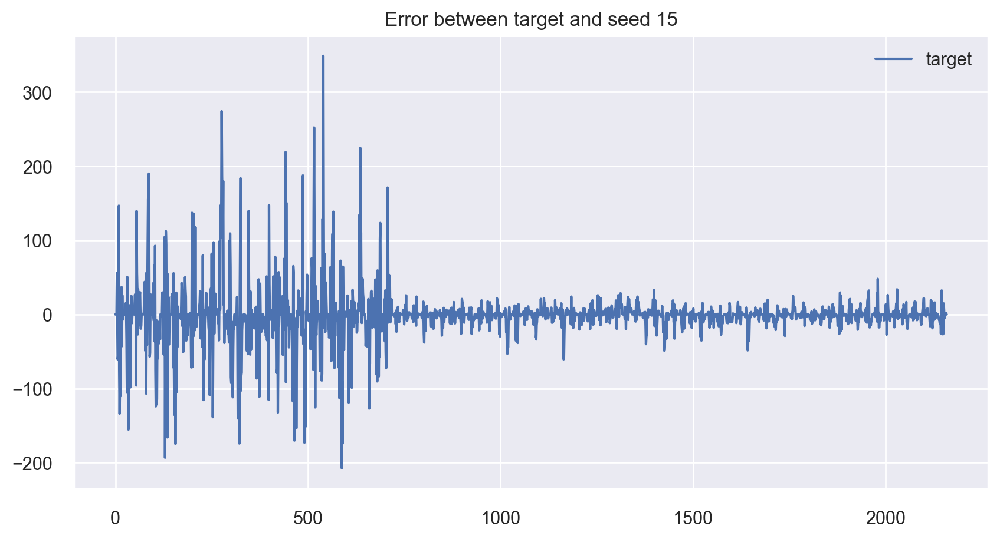

MAE for seed 15: 16.905583017108746


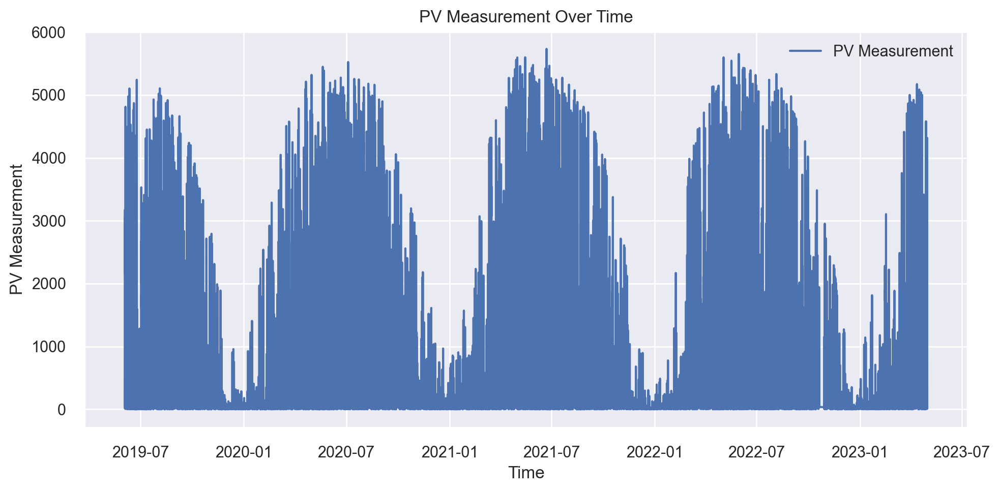

18036 X
18036 y


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     314.5193  246700.6630  496.6897  0.8674  0.9331  3.1796
1     318.7751  266124.4838  515.8725  0.8619  0.8768  3.1610
2     322.8228  263094.7630  512.9276  0.8611  0.9390  4.0116
3     319.8280  251664.2366  501.6615  0.8690  1.0027  3.9428
4     330.0205  269065.6326  518.7154  0.8559  0.9427  3.7603
5     293.4117  224084.0301  473.3751  0.8778  0.9541  3.5408
6     307.7687  246317.0513  496.3034  0.8695  0.9312  4.5200
7     315.9467  261460.9395  511.3325  0.8662  0.9030  3.3233
8     302.1210  230413.4793  480.0140  0.8768  0.9510  5.4346
9     319.8669  265327.0126  515.0990  0.8581  0.9641  4.6445
Mean  314.5080  252425.2292  502.1991  0.8664  0.9398  3.9518
Std    10.1537   14781.4476   14.8764  0.0070  0.0321  0.6948
#############################################
Catboost Done


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     324.4630  275245.9620  524.6389  0.8520  0.8272  1.8065
1     327.1939  277143.4118  526.4441  0.8562  0.7915  2.3631
2     323.1450  273208.7407  522.6937  0.8558  0.8728  3.1832
3     317.9722  259453.6826  509.3660  0.8650  0.8622  2.3881
4     337.1369  283862.1010  532.7871  0.8480  0.8309  2.5138
5     300.3978  236214.8653  486.0194  0.8712  0.8331  2.1144
6     316.1375  257000.7047  506.9524  0.8638  0.8520  2.8521
7     331.4418  290407.0569  538.8943  0.8514  0.8063  2.0573
8     302.4675  232195.5929  481.8668  0.8759  0.8491  3.4317
9     331.3211  292133.7870  540.4940  0.8438  0.8860  2.9582
Mean  321.1677  267686.5905  517.0157  0.8583  0.8411  2.5669
Std    11.5384   19961.5911   19.5292  0.0098  0.0277  0.4981
#############################################
LGBM Done


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     314.8023  255259.5454  505.2322  0.8628  0.8384  2.1437
1     319.0689  265860.6890  515.6168  0.8621  0.8087  2.3719
2     316.7867  262175.8396  512.0311  0.8616  0.8391  2.9120
3     312.7931  248663.1353  498.6613  0.8706  0.8625  2.2605
4     328.7501  270321.4695  519.9245  0.8552  0.8439  2.4145
5     291.2369  224164.2975  473.4599  0.8778  0.8490  2.4255
6     306.1020  245640.9515  495.6218  0.8698  0.8302  3.0711
7     318.0116  269939.9205  519.5574  0.8618  0.8166  2.3198
8     296.1055  225747.0012  475.1284  0.8793  0.8697  3.9802
9     319.1223  271864.3651  521.4061  0.8546  0.8677  2.9106
Mean  312.2779  253963.7214  503.6640  0.8656  0.8426  2.6810
Std    10.8007   16838.8167   16.9216  0.0081  0.0195  0.5267
#############################################
Blended
#############################################
Finalized
float64
date_forecast 

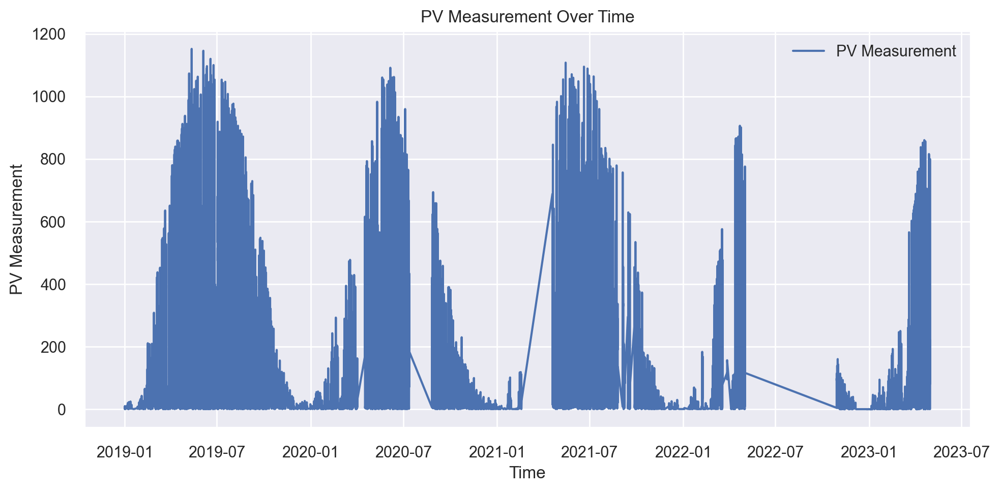

12274 X
12274 y


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     51.4698  7314.3507  85.5240  0.8837  0.7187  1.6832
1     50.7953  7324.7691  85.5849  0.8970  0.7184  1.6231
2     44.2917  5433.3826  73.7115  0.9181  0.7262  1.5594
3     50.7529  7685.8663  87.6691  0.8806  0.7092  2.2296
4     48.6116  6012.3819  77.5396  0.9131  0.6667  1.2386
5     50.6324  6876.1271  82.9224  0.8893  0.7419  1.8645
6     52.7019  6851.4265  82.7733  0.9083  0.6830  1.2280
7     48.3835  6532.9643  80.8268  0.9062  0.7304  2.0749
8     51.2038  6972.6345  83.5023  0.8941  0.7655  1.7407
9     51.5519  7544.3603  86.8583  0.8870  0.7783  2.1189
Mean  50.0395  6854.8263  82.6912  0.8978  0.7238  1.7361
Std    2.2810   666.8019   4.1220  0.0123  0.0321  0.3277
#############################################
Catboost Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     53.6816  8339.1521  91.3190  0.8674  0.7228  1.6794
1     52.1787  7709.9515  87.8063  0.8916  0.6954  1.5337
2     47.3037  6079.4366  77.9707  0.9084  0.7226  1.8668
3     50.6433  7387.1077  85.9483  0.8853  0.7211  2.3697
4     51.6165  6852.7575  82.7814  0.9010  0.6773  1.2806
5     51.6351  7488.6781  86.5371  0.8795  0.7543  1.8549
6     54.3933  7564.3777  86.9734  0.8987  0.6484  1.1140
7     50.8826  7192.1621  84.8066  0.8967  0.7187  1.9638
8     53.1849  7693.8672  87.7147  0.8831  0.7640  1.9188
9     52.6301  7684.7851  87.6629  0.8849  0.7777  2.1469
Mean  51.8150  7399.2276  85.9520  0.8897  0.7202  1.7729
Std    1.8834   571.5890   3.3872  0.0114  0.0374  0.3622
#############################################
LGBM Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     51.6606  7593.5598  87.1410  0.8793  0.6951  1.5957
1     50.5091  7327.5670  85.6012  0.8970  0.6925  1.5189
2     44.7031  5567.2891  74.6143  0.9161  0.6979  1.6359
3     49.7024  7346.6780  85.7128  0.8859  0.6884  1.6711
4     48.9463  6219.6432  78.8647  0.9102  0.6524  1.1877
5     50.2720  6990.3043  83.6080  0.8875  0.7400  1.7809
6     52.6030  7025.6717  83.8193  0.9060  0.6574  1.1463
7     48.5184  6677.7860  81.7177  0.9041  0.7172  1.9779
8     51.1589  7157.5279  84.6022  0.8913  0.7447  1.7491
9     51.1312  7431.2363  86.2046  0.8887  0.7616  2.0735
Mean  49.9205  6933.7263  83.1886  0.8966  0.7047  1.6337
Std    2.0947   592.6929   3.6587  0.0114  0.0343  0.2827
#############################################
Blended
#############################################
Finalized
float64
date_forecast    datetime64[ns]
is_day:idx              float32
dtype:

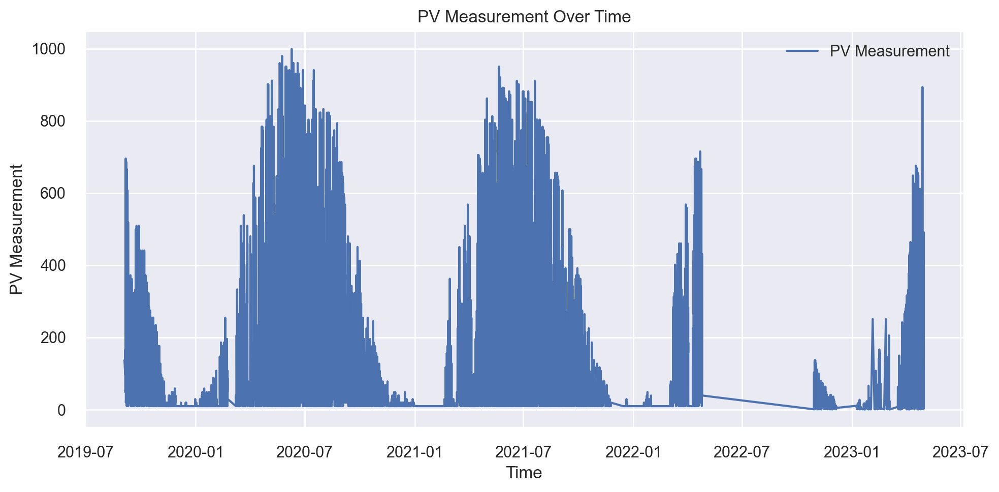

9676 X
9676 y


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     42.3935  4676.8966  68.3878  0.8907  0.5629  0.8321
1     47.2121  6084.4519  78.0029  0.8825  0.5787  0.7151
2     44.6867  5014.4295  70.8126  0.8999  0.5191  0.6178
3     46.0002  5178.8421  71.9642  0.8878  0.5229  0.5741
4     40.1240  4235.3214  65.0793  0.8991  0.5171  0.5551
5     42.2731  4585.2793  67.7147  0.9071  0.4944  0.5092
6     43.0674  4754.0595  68.9497  0.8830  0.5573  0.6500
7     42.7060  4998.4146  70.6995  0.9015  0.5237  0.5162
8     45.0988  5790.2997  76.0940  0.8786  0.5258  0.5411
9     46.3248  5319.0142  72.9316  0.8952  0.5244  0.5717
Mean  43.9887  5063.7009  71.0636  0.8925  0.5326  0.6083
Std    2.1102   530.6228   3.6961  0.0090  0.0241  0.0957
#############################################
Catboost Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     42.7978  4850.2555  69.6438  0.8867  0.5468  0.7994
1     48.1130  6142.1659  78.3720  0.8814  0.5752  0.7725
2     45.7373  5388.9803  73.4097  0.8924  0.5294  0.6856
3     45.1354  5145.5358  71.7324  0.8885  0.5123  0.5922
4     41.1577  4710.7670  68.6350  0.8877  0.5180  0.5857
5     44.1840  4794.4036  69.2416  0.9029  0.4803  0.5294
6     43.1808  4745.9172  68.8906  0.8832  0.5605  0.6980
7     44.3239  5358.2291  73.1999  0.8944  0.5159  0.5784
8     45.2266  5599.1885  74.8277  0.8826  0.5148  0.5642
9     47.4182  5712.2061  75.5791  0.8875  0.5240  0.5934
Mean  44.7275  5244.7649  72.3532  0.8887  0.5277  0.6399
Std    1.9863   456.6651   3.1275  0.0061  0.0257  0.0881
#############################################
LGBM Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     41.7651  4621.5764  67.9822  0.8920  0.5352  0.7870
1     46.8834  5949.2970  77.1317  0.8851  0.5701  0.7302
2     44.2329  5043.9557  71.0208  0.8993  0.5188  0.6347
3     44.7652  5023.4237  70.8761  0.8911  0.4944  0.5393
4     39.7338  4339.4846  65.8748  0.8966  0.4964  0.5437
5     42.3764  4559.8123  67.5264  0.9077  0.4700  0.5029
6     42.2291  4601.3675  67.8334  0.8868  0.5324  0.6406
7     42.7093  5022.7960  70.8717  0.9010  0.4944  0.5243
8     44.2988  5552.7819  74.5170  0.8836  0.4961  0.5263
9     45.9868  5377.9303  73.3344  0.8940  0.5092  0.5647
Mean  43.4981  5009.2425  70.6968  0.8937  0.5117  0.5994
Std    2.0274   477.8983   3.3466  0.0072  0.0269  0.0914
#############################################
Blended
#############################################
Finalized
float64
date_forecast    datetime64[ns]
is_day:idx              float32
dtype:

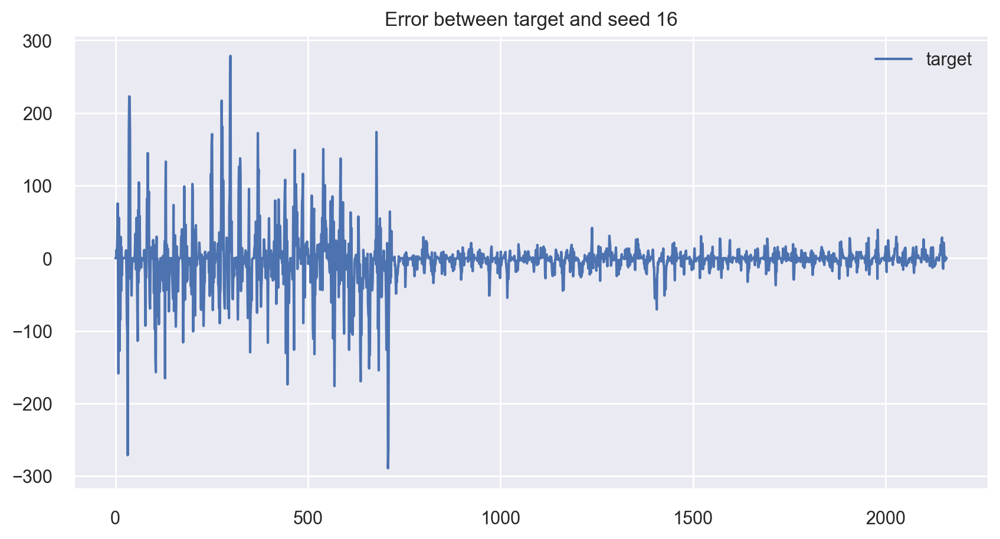

MAE for seed 16: 16.74347788564244


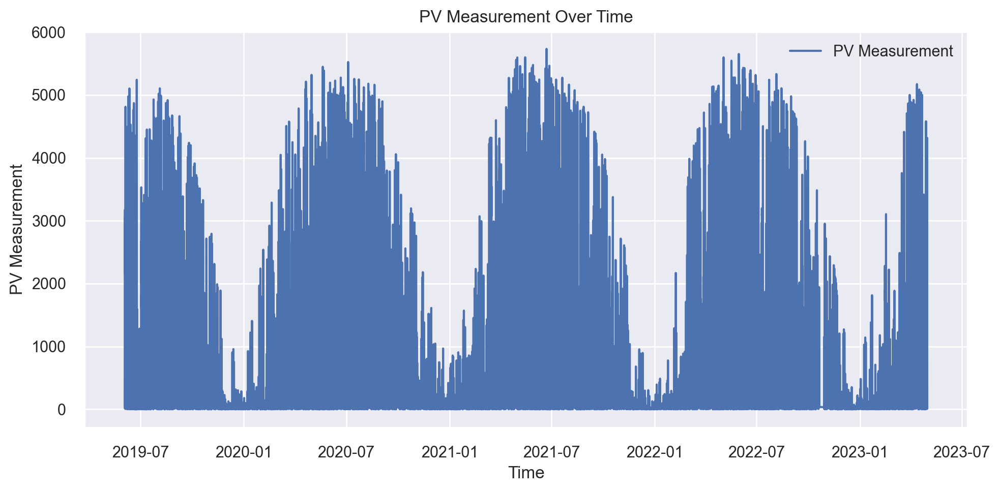

18036 X
18036 y


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     349.0873  302132.6919  549.6660  0.8443  0.9410  3.2130
1     329.5932  293473.6642  541.7321  0.8517  0.9209  3.3971
2     301.1457  241021.4128  490.9393  0.8681  0.9741  4.5572
3     311.4403  245797.1689  495.7794  0.8686  0.9880  4.4828
4     306.4837  238928.7831  488.8034  0.8800  0.8920  3.1475
5     307.2693  250067.1262  500.0671  0.8648  0.9682  4.5733
6     309.8897  255485.4378  505.4557  0.8652  0.9630  4.8014
7     316.6631  252262.6266  502.2575  0.8465  0.9121  4.2395
8     318.8978  251443.9731  501.4419  0.8623  0.9030  3.1252
9     311.1445  245106.8642  495.0827  0.8799  1.0105  5.3323
Mean  316.1615  257571.9749  507.1225  0.8631  0.9473  4.0869
Std    13.2562   20776.2401   19.9684  0.0118  0.0375  0.7580
#############################################
Catboost Done


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     358.5561  324204.3181  569.3894  0.8329  0.8611  2.4938
1     332.7604  297968.3555  545.8648  0.8495  0.8529  2.7236
2     300.8254  250442.8575  500.4427  0.8629  0.8493  2.3155
3     314.1767  258851.4879  508.7745  0.8616  0.8900  2.9680
4     313.0975  254200.9530  504.1835  0.8723  0.8346  2.6716
5     307.6067  259130.6227  509.0487  0.8600  0.8404  2.6582
6     314.6240  265350.7010  515.1220  0.8600  0.9003  3.9281
7     313.9712  259410.8179  509.3239  0.8421  0.8572  2.7180
8     319.7034  261821.3394  511.6848  0.8566  0.8494  2.2712
9     321.6419  264761.3839  514.5497  0.8702  0.8576  2.7315
Mean  319.6963  269614.2837  518.8384  0.8568  0.8593  2.7480
Std    15.2293   21957.8095   20.5183  0.0116  0.0196  0.4400
#############################################
LGBM Done


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     348.6761  306970.5102  554.0492  0.8418  0.8644  2.3604
1     326.2934  289135.1466  537.7129  0.8539  0.8367  2.5019
2     295.0030  239428.9679  489.3148  0.8690  0.8870  3.1404
3     306.6758  245949.5766  495.9330  0.8685  0.9073  3.2799
4     304.1390  240333.8792  490.2386  0.8793  0.8037  2.3016
5     301.9121  248918.6917  498.9175  0.8655  0.8634  3.0615
6     306.3967  254351.9876  504.3332  0.8658  0.8692  3.4061
7     309.3712  249621.8729  499.6217  0.8481  0.8184  2.8224
8     313.8593  250800.8374  500.8002  0.8626  0.8378  2.3509
9     311.3463  248581.9126  498.5799  0.8782  0.8784  3.2379
Mean  312.3673  257409.3383  506.9501  0.8633  0.8566  2.8463
Std    14.3913   21148.7745   20.2714  0.0115  0.0304  0.4105
#############################################
Blended
#############################################
Finalized
float64
date_forecast 

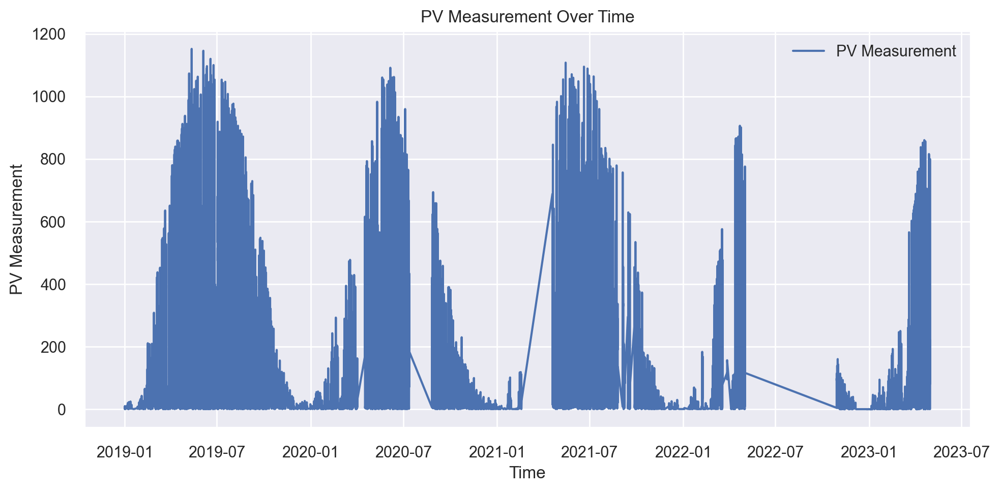

12274 X
12274 y


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     52.7812  7640.1454  87.4079  0.8944  0.7253  1.6830
1     50.1828  7028.0015  83.8332  0.9010  0.7020  1.2873
2     52.3853  7922.1193  89.0063  0.8909  0.7128  1.3216
3     47.5241  5983.8907  77.3556  0.9200  0.7546  1.4908
4     48.4709  6256.3794  79.0973  0.9016  0.7058  1.5639
5     51.9526  8457.9757  91.9673  0.8676  0.7081  1.2771
6     47.2674  5924.5099  76.9708  0.9039  0.6982  1.6098
7     46.8959  5882.0163  76.6943  0.9034  0.7023  1.3881
8     45.2272  5942.2443  77.0860  0.9194  0.7376  2.6915
9     51.5356  7008.6998  83.7180  0.8896  0.7483  1.8653
Mean  49.4223  6804.5982  82.3137  0.8992  0.7195  1.6178
Std    2.5425   900.8711   5.3907  0.0144  0.0196  0.4004
#############################################
Catboost Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     54.0814  7946.9101  89.1454  0.8901  0.7470  1.7165
1     51.2147  7339.2018  85.6691  0.8966  0.6770  1.3792
2     52.9328  8191.3714  90.5062  0.8872  0.6960  1.1755
3     47.3877  5837.3692  76.4027  0.9220  0.7318  1.6119
4     49.3654  6583.8393  81.1409  0.8964  0.6927  1.4015
5     53.4416  8741.7379  93.4973  0.8632  0.7299  1.3931
6     48.0531  6142.4790  78.3740  0.9004  0.6877  1.4990
7     48.3987  6113.6296  78.1897  0.8996  0.7003  1.5800
8     46.2983  6239.1484  78.9883  0.9154  0.6995  2.1587
9     52.1363  7360.6984  85.7945  0.8841  0.7513  1.8671
Mean  50.3310  7049.6385  83.7708  0.8955  0.7113  1.5782
Std    2.6331   958.9039   5.6649  0.0155  0.0249  0.2672
#############################################
LGBM Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     52.7159  7620.8419  87.2974  0.8946  0.7132  1.5453
1     49.9234  7003.2754  83.6856  0.9013  0.6558  1.2563
2     51.8862  7895.5516  88.8569  0.8913  0.6819  1.1791
3     46.5428  5726.1448  75.6713  0.9234  0.7186  1.4229
4     48.2296  6262.0009  79.1328  0.9015  0.6812  1.4172
5     52.0139  8410.5223  91.7089  0.8684  0.7054  1.2814
6     46.7607  5884.0308  76.7074  0.9046  0.6739  1.5158
7     46.8679  5845.6399  76.4568  0.9040  0.6864  1.3858
8     44.8475  5947.4582  77.1198  0.9193  0.6891  2.0154
9     50.8876  6999.0448  83.6603  0.8898  0.7213  1.7783
Mean  49.0676  6759.4511  82.0297  0.8998  0.6927  1.4797
Std    2.6273   919.3222   5.5296  0.0147  0.0202  0.2403
#############################################
Blended
#############################################
Finalized
float64
date_forecast    datetime64[ns]
is_day:idx              float32
dtype:

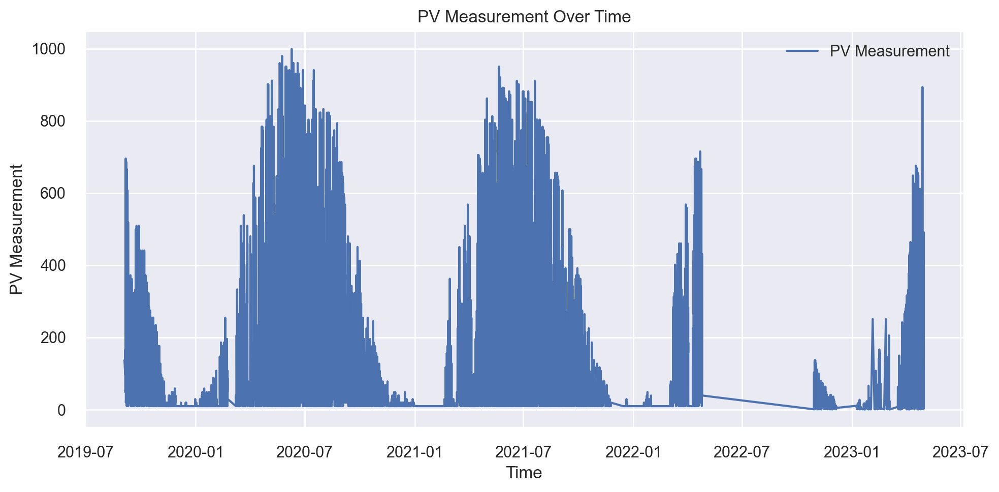

9676 X
9676 y


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     44.1195  4998.7329  70.7017  0.8896  0.5227  0.5477
1     41.7050  4669.1662  68.3313  0.9035  0.5713  0.5996
2     40.7127  4598.0110  67.8086  0.8973  0.5113  0.5327
3     45.8199  5692.4110  75.4481  0.8894  0.5410  0.6661
4     44.5615  5528.5129  74.3540  0.8893  0.4887  0.5055
5     43.7915  5037.2634  70.9737  0.8963  0.5246  0.5917
6     44.5328  5182.9657  71.9928  0.8788  0.5400  0.5992
7     39.4244  4262.1034  65.2848  0.9023  0.4836  0.4703
8     43.2874  5096.0243  71.3864  0.9007  0.5121  0.6470
9     46.8412  5387.2492  73.3979  0.8880  0.5383  0.6281
Mean  43.4796  5045.2440  70.9679  0.8935  0.5233  0.5788
Std    2.1645   418.0760   2.9660  0.0074  0.0248  0.0600
#############################################
Catboost Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     43.1983  4785.7237  69.1789  0.8943  0.5232  0.6131
1     43.1977  5064.6383  71.1663  0.8953  0.5267  0.6491
2     41.2815  4763.3508  69.0170  0.8936  0.5060  0.5441
3     47.5232  6147.8866  78.4085  0.8805  0.5337  0.6810
4     46.7716  5800.9595  76.1640  0.8839  0.4960  0.5794
5     45.2412  5072.5988  71.2222  0.8956  0.5571  0.6447
6     45.0455  5226.8086  72.2967  0.8777  0.5356  0.6269
7     40.0983  4435.5496  66.5999  0.8983  0.4872  0.4869
8     42.9256  5149.2901  71.7586  0.8997  0.5078  0.7279
9     50.5639  6433.4428  80.2087  0.8662  0.5438  0.6647
Mean  44.5847  5288.0249  72.6021  0.8885  0.5217  0.6218
Std    2.9572   607.2935   4.1186  0.0104  0.0210  0.0663
#############################################
LGBM Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     43.0280  4759.9067  68.9921  0.8949  0.5181  0.5610
1     41.6397  4717.9992  68.6877  0.9025  0.5252  0.6064
2     40.1160  4552.1730  67.4698  0.8983  0.4966  0.5244
3     45.6783  5730.2780  75.6986  0.8886  0.5188  0.6565
4     44.7366  5506.8830  74.2084  0.8898  0.4574  0.4812
5     43.6622  4926.2264  70.1871  0.8986  0.5209  0.6022
6     44.2352  5083.9867  71.3021  0.8811  0.5240  0.5872
7     38.9843  4214.3370  64.9179  0.9034  0.4760  0.4609
8     42.1957  4990.8923  70.6462  0.9027  0.4990  0.6692
9     48.0300  5752.2895  75.8438  0.8804  0.5383  0.6300
Mean  43.2306  5023.4972  70.7954  0.8940  0.5074  0.5779
Std    2.5271   481.4788   3.3930  0.0082  0.0238  0.0670
#############################################
Blended
#############################################
Finalized
float64
date_forecast    datetime64[ns]
is_day:idx              float32
dtype:

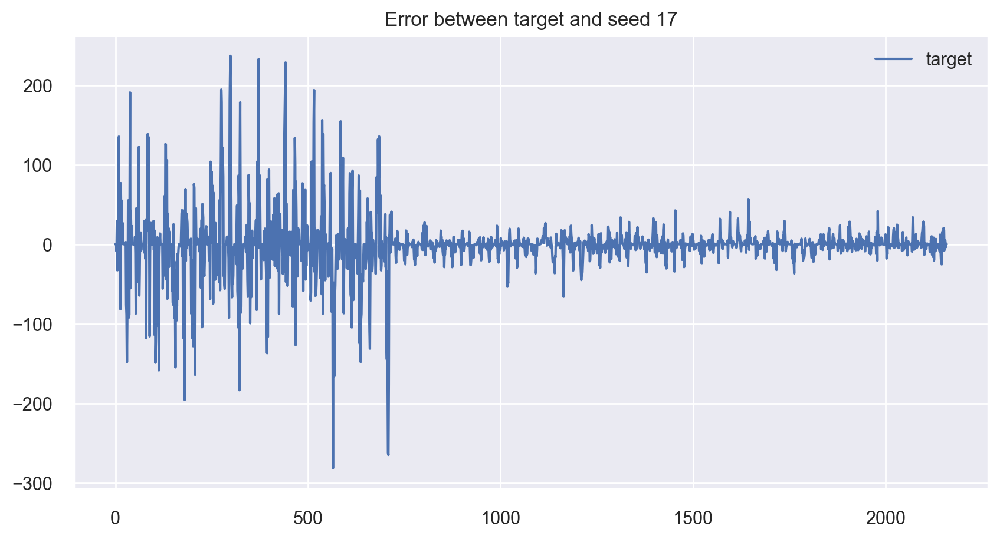

MAE for seed 17: 17.491935097739884


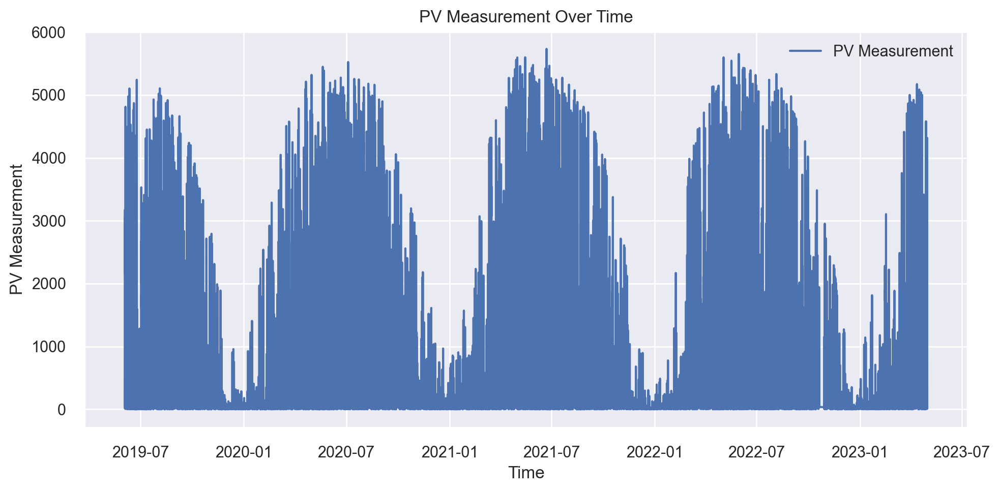

18036 X
18036 y


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     300.7708  238539.0177  488.4046  0.8737  0.9438  3.4708
1     336.8408  294908.8882  543.0551  0.8550  0.9239  3.7417
2     295.3698  221139.2496  470.2545  0.8807  0.8885  3.0915
3     321.9801  270964.5270  520.5425  0.8493  0.9565  3.9231
4     322.4862  264524.5808  514.3195  0.8624  0.9443  4.2696
5     305.5297  256091.4229  506.0548  0.8526  0.9744  4.0143
6     320.4559  269063.0788  518.7129  0.8607  0.9461  4.1101
7     319.7445  259682.6664  509.5907  0.8590  0.9633  3.9261
8     291.5498  222623.9661  471.8304  0.8760  0.9805  4.0804
9     327.0338  268729.4052  518.3912  0.8551  0.9270  3.9383
Mean  314.1761  256626.6803  506.1156  0.8625  0.9448  3.8566
Std    14.1404   21879.0984   21.7637  0.0102  0.0256  0.3276
#############################################
Catboost Done


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     310.5553  257159.5809  507.1090  0.8639  0.9217  3.6289
1     342.5238  309235.1575  556.0892  0.8479  0.8400  2.3377
2     303.9167  238088.6169  487.9433  0.8715  0.8259  2.4721
3     329.0621  296183.6474  544.2276  0.8353  0.8187  1.8291
4     326.2934  275794.1041  525.1610  0.8566  0.8301  2.7941
5     311.1446  276312.7602  525.6546  0.8410  0.8896  3.4801
6     329.7496  286349.3463  535.1162  0.8518  0.8396  2.7879
7     315.1283  255959.4837  505.9244  0.8610  0.8860  3.1576
8     296.7014  234518.2914  484.2709  0.8694  0.8723  3.0557
9     323.7308  271244.9200  520.8118  0.8537  0.8073  2.3192
Mean  318.8806  270084.5908  519.2308  0.8552  0.8531  2.7862
Std    13.1086   22817.7199   21.9995  0.0112  0.0352  0.5326
#############################################
LGBM Done


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     299.4287  241863.5789  491.7963  0.8720  0.8796  3.0627
1     335.0013  295356.4974  543.4671  0.8547  0.8270  2.3491
2     294.3314  223120.6798  472.3565  0.8796  0.8310  2.4363
3     320.3626  276825.1041  526.1417  0.8460  0.8510  2.5870
4     318.8439  263867.7791  513.6806  0.8628  0.8592  3.0440
5     302.3814  260386.6779  510.2810  0.8502  0.9017  3.3524
6     319.5290  271320.9298  520.8848  0.8596  0.8705  2.9679
7     310.3152  251427.2367  501.4252  0.8635  0.8614  2.9152
8     288.4761  221995.5684  471.1641  0.8764  0.8579  2.9237
9     320.1577  264251.3147  514.0538  0.8575  0.8142  2.6381
Mean  310.8827  257041.5367  506.5251  0.8622  0.8553  2.8276
Std    13.6950   21940.4432   21.7682  0.0105  0.0248  0.2983
#############################################
Blended
#############################################
Finalized
float64
date_forecast 

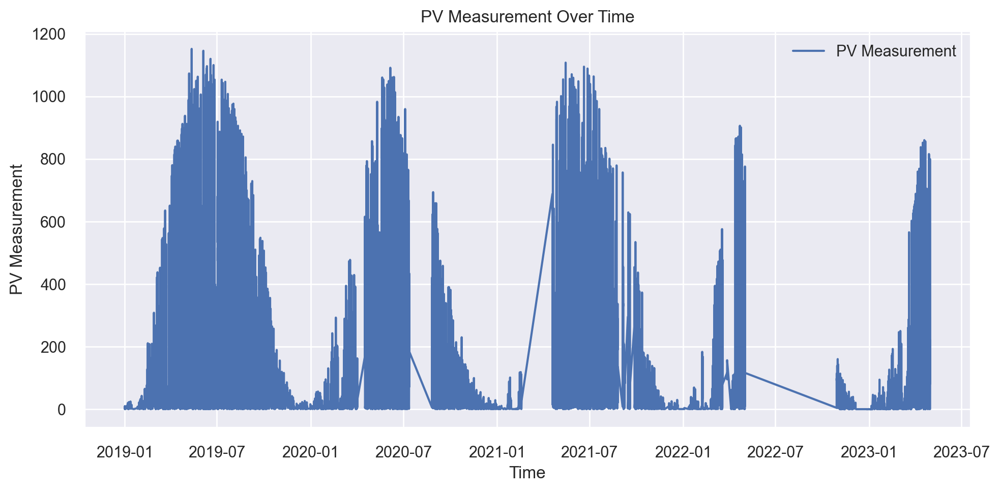

12274 X
12274 y


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     51.5875  7753.4936  88.0539  0.8803  0.7716  1.5956
1     48.2819  6718.2353  81.9648  0.9077  0.7235  1.6547
2     52.9764  7538.2479  86.8231  0.8925  0.7368  1.9822
3     49.4325  6663.4290  81.6298  0.9037  0.7399  1.5759
4     52.0006  7683.3662  87.6548  0.8834  0.6899  1.5166
5     50.0599  6793.0416  82.4199  0.9055  0.6819  1.1874
6     50.3221  7282.7030  85.3388  0.8858  0.7328  1.2771
7     46.6001  5715.0243  75.5978  0.9085  0.7399  1.6610
8     45.2430  5433.6167  73.7131  0.9224  0.7235  2.2060
9     51.5220  7662.1312  87.5336  0.8983  0.7355  2.1528
Mean  49.8026  6924.3289  83.0730  0.8988  0.7275  1.6809
Std    2.3426   782.6719   4.8179  0.0126  0.0244  0.3228
#############################################
Catboost Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     54.1838  8463.0033  91.9946  0.8694  0.7416  1.5019
1     50.0111  7031.1577  83.8520  0.9034  0.7337  1.6979
2     53.6554  7730.7908  87.9249  0.8898  0.7129  2.1104
3     51.4198  7174.0648  84.6999  0.8963  0.7491  1.6474
4     53.9115  7809.9071  88.3737  0.8815  0.6920  1.5704
5     50.4799  6794.5839  82.4293  0.9055  0.6878  1.2001
6     52.0713  7542.6911  86.8487  0.8817  0.7376  1.5275
7     47.2726  5895.7413  76.7837  0.9056  0.7440  1.7238
8     46.2999  5849.8033  76.4840  0.9164  0.7225  2.1276
9     53.3806  8199.3457  90.5502  0.8911  0.7132  2.1317
Mean  51.2686  7249.1089  84.9941  0.8941  0.7234  1.7239
Std    2.6300   840.1535   5.0113  0.0134  0.0205  0.2951
#############################################
LGBM Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     51.9954  7921.7031  89.0039  0.8777  0.7341  1.4695
1     48.2658  6691.5712  81.8020  0.9081  0.7117  1.6486
2     52.5044  7468.6514  86.4214  0.8935  0.7010  1.9923
3     49.6540  6746.6918  82.1382  0.9025  0.7205  1.4983
4     51.9451  7518.0218  86.7065  0.8859  0.6672  1.4527
5     49.5553  6638.1329  81.4747  0.9076  0.6564  1.1111
6     50.3933  7227.5736  85.0151  0.8866  0.7285  1.3532
7     45.8908  5610.0762  74.9004  0.9102  0.7157  1.6091
8     44.8888  5448.8391  73.8163  0.9221  0.7018  1.5962
9     51.6065  7772.2774  88.1605  0.8968  0.6926  2.0870
Mean  49.6699  6904.3538  82.9439  0.8991  0.7030  1.5818
Std    2.4903   807.6179   4.9659  0.0128  0.0239  0.2719
#############################################
Blended
#############################################
Finalized
float64
date_forecast    datetime64[ns]
is_day:idx              float32
dtype:

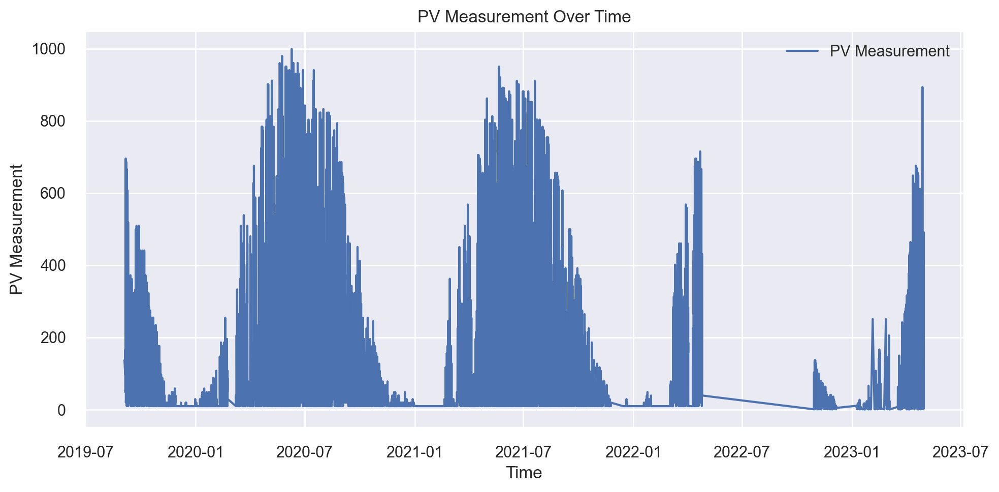

9676 X
9676 y


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     45.5474  5462.7917  73.9107  0.8895  0.5518  0.6841
1     48.9045  6004.7257  77.4902  0.8947  0.5159  0.6074
2     44.8752  5397.2454  73.4659  0.8856  0.4874  0.5081
3     40.5061  4596.1006  67.7945  0.8895  0.5536  0.6012
4     43.1726  5220.3968  72.2523  0.8765  0.5348  0.5937
5     43.8117  4862.9040  69.7345  0.8757  0.5400  0.5703
6     45.7900  5563.8775  74.5914  0.8888  0.5291  0.5389
7     42.6709  5174.4443  71.9336  0.8976  0.4723  0.4703
8     44.9058  5180.3699  71.9748  0.8942  0.5721  0.6516
9     45.3179  5287.4293  72.7147  0.8861  0.5154  0.5048
Mean  44.5502  5275.0285  72.5863  0.8878  0.5272  0.5730
Std    2.1129   363.1927   2.5024  0.0069  0.0290  0.0644
#############################################
Catboost Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     45.8701  5593.7076  74.7911  0.8868  0.5378  0.6677
1     51.0991  6462.1950  80.3878  0.8866  0.5327  0.6911
2     45.7444  5540.1682  74.4323  0.8826  0.4930  0.5518
3     42.2311  4770.8701  69.0715  0.8853  0.5513  0.6724
4     42.6387  5232.7184  72.3375  0.8762  0.4932  0.5653
5     45.6233  5124.7923  71.5877  0.8690  0.5226  0.5868
6     46.1842  5443.9240  73.7830  0.8912  0.5297  0.6288
7     43.8127  5321.1815  72.9464  0.8947  0.4819  0.5446
8     46.0410  5437.6539  73.7404  0.8890  0.5466  0.6593
9     45.9003  5435.2093  73.7239  0.8829  0.4924  0.5068
Mean  45.5145  5436.2420  73.6802  0.8844  0.5181  0.6075
Std    2.3281   410.1974   2.7344  0.0070  0.0243  0.0611
#############################################
LGBM Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     44.7584  5385.4337  73.3855  0.8910  0.5262  0.6516
1     49.2715  6045.2341  77.7511  0.8940  0.5157  0.6333
2     44.6654  5328.9727  72.9998  0.8871  0.4705  0.5163
3     40.4377  4550.5838  67.4580  0.8906  0.5253  0.5960
4     41.9152  5105.6394  71.4538  0.8792  0.4752  0.5179
5     44.0078  4842.9099  69.5910  0.8763  0.5117  0.5514
6     45.0578  5358.7111  73.2032  0.8929  0.4966  0.5596
7     42.4342  5115.5895  71.5233  0.8987  0.4576  0.4926
8     44.7738  5175.3312  71.9398  0.8943  0.5293  0.6252
9     44.9910  5234.2863  72.3484  0.8872  0.5080  0.4906
Mean  44.2313  5214.2692  72.1654  0.8891  0.5016  0.5635
Std    2.2463   368.1931   2.5348  0.0066  0.0243  0.0568
#############################################
Blended
#############################################
Finalized
float64
date_forecast    datetime64[ns]
is_day:idx              float32
dtype:

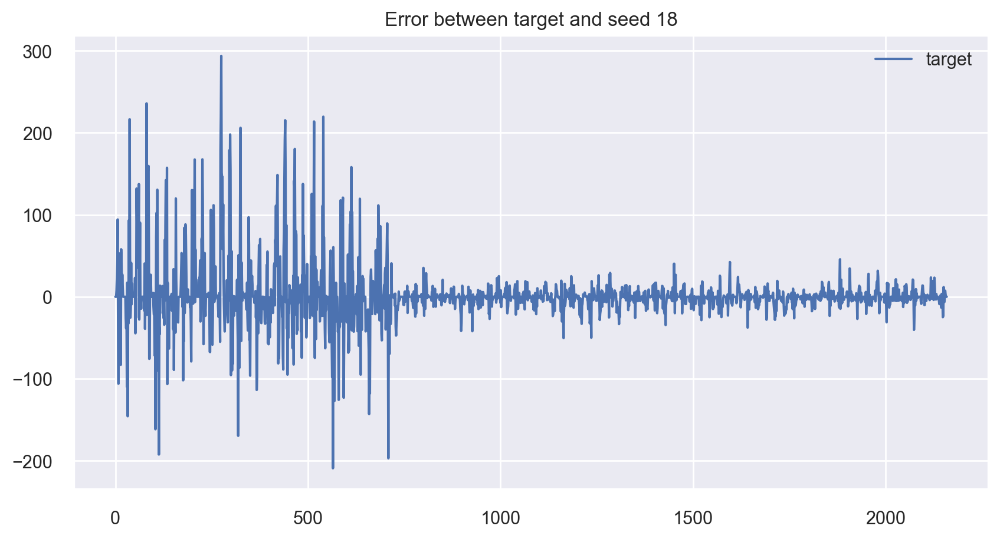

MAE for seed 18: 16.887194337423765


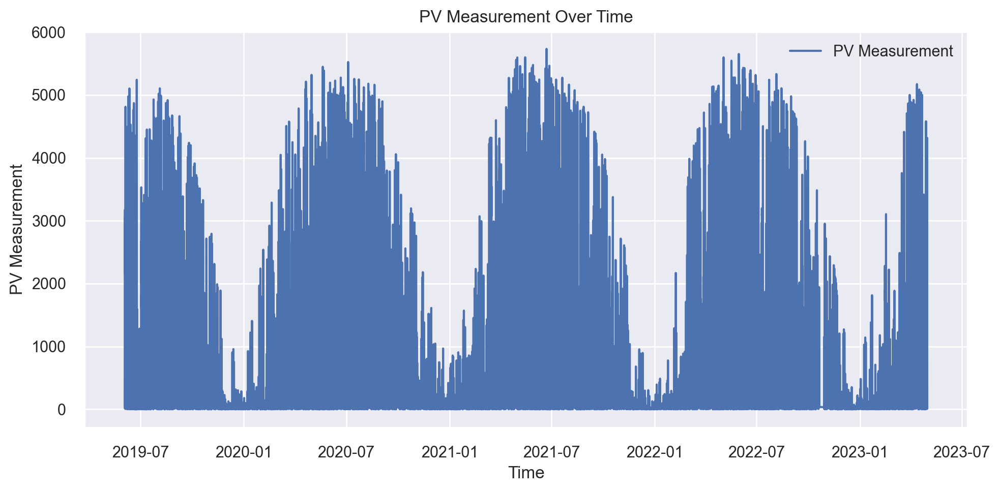

18036 X
18036 y


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     307.2728  258268.5084  508.2012  0.8634  0.9339  3.8429
1     310.5519  245299.7695  495.2775  0.8727  0.9498  3.9471
2     317.3133  262027.0748  511.8858  0.8556  0.9004  2.8578
3     324.6352  270792.5242  520.3773  0.8631  1.0006  4.5423
4     331.9144  284818.3963  533.6838  0.8500  0.9170  3.8265
5     331.4348  296363.7941  544.3931  0.8509  0.9644  3.7489
6     318.1827  253427.3769  503.4157  0.8734  0.9405  3.7024
7     307.8151  255108.4495  505.0826  0.8687  0.9557  4.1220
8     316.7142  263677.1745  513.4951  0.8679  0.8642  2.4269
9     332.0102  276657.8571  525.9828  0.8569  0.9301  3.9864
Mean  319.7845  266644.0925  516.1795  0.8622  0.9357  3.7003
Std     9.2683   14814.3632   14.2421  0.0081  0.0352  0.5831
#############################################
Catboost Done


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     314.9817  270499.8366  520.0960  0.8569  0.8690  2.7352
1     314.6536  249154.3360  499.1536  0.8707  0.8400  2.4348
2     325.4240  278559.0665  527.7870  0.8465  0.8181  2.1651
3     316.2231  260143.2308  510.0424  0.8685  0.8871  2.9095
4     339.4224  297362.1565  545.3092  0.8434  0.8175  2.6973
5     337.1253  300315.4103  548.0104  0.8489  0.8752  2.9942
6     321.9875  270937.1541  520.5162  0.8646  0.8099  2.3156
7     314.5762  273487.3930  522.9602  0.8592  0.8488  2.3240
8     328.9619  279292.3226  528.4811  0.8600  0.8175  2.1370
9     339.8115  298913.4786  546.7298  0.8453  0.8437  2.5393
Mean  325.3167  277866.4385  526.9086  0.8564  0.8427  2.5252
Std     9.9572   16091.8765   15.2894  0.0094  0.0259  0.2854
#############################################
LGBM Done


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     305.4373  258796.9577  508.7209  0.8631  0.8489  2.7155
1     307.0812  240242.2162  490.1451  0.8753  0.8490  2.8294
2     316.3181  263725.4292  513.5420  0.8547  0.8252  2.1776
3     315.1925  258859.1208  508.7820  0.8691  0.9045  3.3387
4     330.9491  284481.4897  533.3681  0.8502  0.8400  2.7333
5     328.1563  292365.0088  540.7079  0.8529  0.8595  2.5590
6     313.4172  255043.4764  505.0183  0.8725  0.8329  2.4652
7     305.5532  257846.3240  507.7857  0.8673  0.8619  2.7147
8     317.0092  265710.8623  515.4715  0.8668  0.8137  1.9503
9     330.6644  281616.2033  530.6752  0.8543  0.8589  2.7471
Mean  316.9779  265868.7088  515.4217  0.8626  0.8494  2.6231
Std     9.4097   14961.6079   14.4641  0.0085  0.0237  0.3577
#############################################
Blended
#############################################
Finalized
float64
date_forecast 

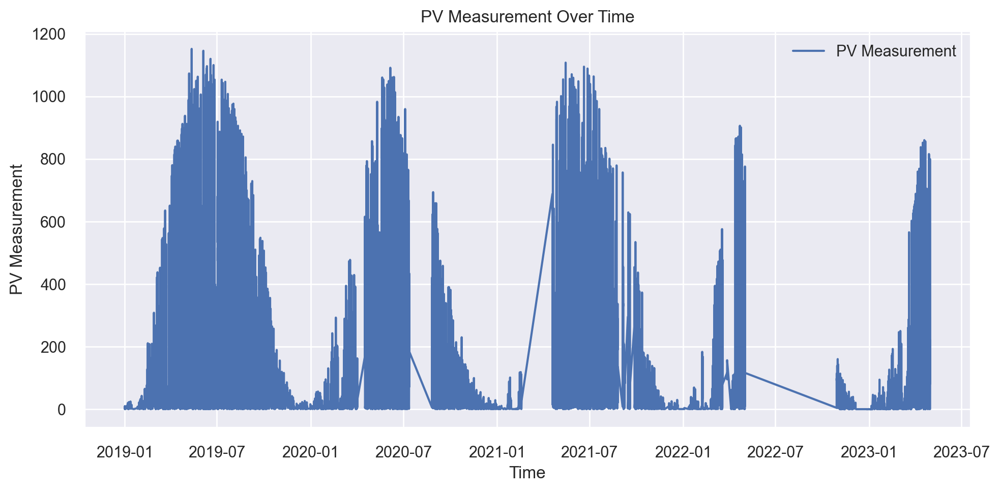

12274 X
12274 y


          MAE        MSE     RMSE      R2   RMSLE     MAPE
Fold                                                      
0     47.9331  6139.0435  78.3520  0.9108  0.7258   2.2150
1     52.8094  7501.3023  86.6101  0.8995  0.7373  43.1549
2     46.6956  6078.3658  77.9639  0.9103  0.6991   1.2285
3     50.5705  7172.3626  84.6898  0.8925  0.7172   1.5094
4     52.3924  7274.0471  85.2880  0.8923  0.7082   1.4318
5     51.9099  7717.7450  87.8507  0.8815  0.6635   1.3406
6     50.5087  7501.3759  86.6105  0.8815  0.7223   1.5540
7     53.1236  7174.0115  84.6995  0.8985  0.7734   1.6640
8     51.6163  7041.5332  83.9138  0.8954  0.7311   1.5112
9     49.1625  6103.0985  78.1223  0.9098  0.7432   1.9525
Mean  50.6722  6970.2885  83.4101  0.8972  0.7221   5.7562
Std    2.0394   595.0559   3.6123  0.0103  0.0275  12.4693
#############################################
Catboost Done


          MAE        MSE     RMSE      R2   RMSLE     MAPE
Fold                                                      
0     50.0913  6646.9017  81.5285  0.9034  0.7262   1.8531
1     54.7327  8079.8728  89.8881  0.8918  0.7443  79.8403
2     49.2814  6505.1537  80.6545  0.9040  0.7046   1.4636
3     50.8934  7512.3108  86.6736  0.8874  0.7052   1.4716
4     52.9222  7347.8708  85.7197  0.8912  0.7016   1.5693
5     53.9594  8092.7148  89.9595  0.8757  0.7023   1.5296
6     52.5817  7725.7714  87.8964  0.8779  0.7327   1.6562
7     52.2137  7357.5963  85.7764  0.8959  0.7585   1.7657
8     52.3306  7240.1313  85.0890  0.8924  0.7173   1.4201
9     49.8091  6195.5005  78.7115  0.9085  0.7296   1.9005
Mean  51.8816  7270.3824  85.1897  0.8928  0.7222   9.4470
Std    1.7196   611.6873   3.6184  0.0102  0.0185  23.4650
#############################################
LGBM Done


          MAE        MSE     RMSE      R2   RMSLE     MAPE
Fold                                                      
0     48.0516  6211.8556  78.8153  0.9097  0.6966   1.5722
1     52.8486  7563.1177  86.9662  0.8987  0.7279  61.4467
2     47.0923  6093.7914  78.0627  0.9101  0.6763   1.2951
3     49.8134  7156.4295  84.5957  0.8927  0.6915   1.4373
4     51.7232  7123.8441  84.4029  0.8945  0.6893   1.4406
5     52.1440  7735.5265  87.9518  0.8812  0.6557   1.3588
6     50.6653  7433.5282  86.2179  0.8825  0.7152   1.5666
7     51.7488  7084.0933  84.1671  0.8998  0.7537   1.6607
8     51.2428  6970.2992  83.4883  0.8964  0.7086   1.3729
9     48.7130  5980.4294  77.3332  0.9116  0.7251   1.8937
Mean  50.4043  6935.2915  83.2001  0.8977  0.7040   7.5045
Std    1.8175   594.4617   3.6100  0.0102  0.0267  17.9815
#############################################
Blended
#############################################
Finalized
float64
date_forecast    datetime64[ns]
is_day:idx              

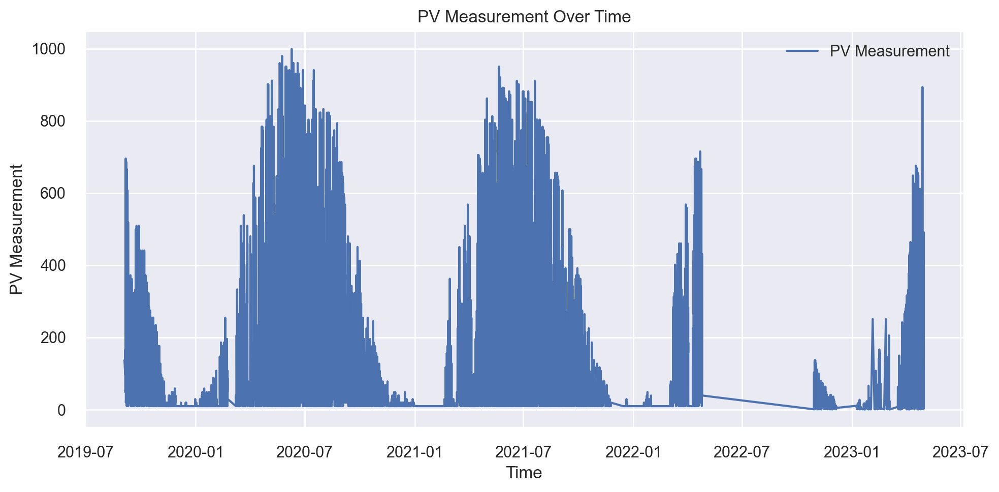

9676 X
9676 y


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     45.3483  5173.4179  71.9265  0.9071  0.5312  0.5373
1     46.8087  6028.1365  77.6411  0.8692  0.5638  0.7296
2     45.6813  5648.4493  75.1562  0.8739  0.5518  0.6455
3     44.9923  5261.6504  72.5372  0.8688  0.5067  0.4801
4     42.5718  5214.5175  72.2116  0.8914  0.5298  0.5313
5     41.3386  4389.2967  66.2518  0.9023  0.5038  0.4690
6     45.2980  5225.5402  72.2879  0.8861  0.5127  0.5936
7     40.3618  4332.2055  65.8195  0.9051  0.5060  0.5486
8     44.2791  4973.4493  70.5227  0.9023  0.5259  0.6062
9     47.3410  6141.2673  78.3662  0.8748  0.5133  0.5302
Mean  44.4021  5238.7931  72.2721  0.8881  0.5245  0.5672
Std    2.1722   567.8780   3.9423  0.0147  0.0193  0.0747
#############################################
Catboost Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     45.1820  5091.2603  71.3531  0.9085  0.5204  0.5787
1     48.1350  6435.2874  80.2202  0.8604  0.5856  0.7800
2     47.2060  6071.2926  77.9185  0.8645  0.5588  0.7049
3     46.2648  5375.4687  73.3176  0.8660  0.4952  0.4904
4     44.1837  5632.3518  75.0490  0.8827  0.5250  0.6322
5     42.0388  4525.9581  67.2752  0.8993  0.5006  0.5430
6     46.2565  5394.7067  73.4487  0.8824  0.4980  0.5741
7     41.3304  4520.1759  67.2323  0.9010  0.5186  0.6516
8     45.7883  5659.5536  75.2300  0.8888  0.5484  0.7012
9     47.9965  6351.5260  79.6965  0.8705  0.4929  0.5592
Mean  45.4382  5505.7581  74.0741  0.8824  0.5243  0.6215
Std    2.2020   638.0715   4.3342  0.0160  0.0294  0.0841
#############################################
LGBM Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     44.5293  4999.5970  70.7078  0.9102  0.4953  0.5437
1     46.8883  6096.9357  78.0829  0.8677  0.5704  0.7318
2     45.3900  5700.4666  75.5014  0.8728  0.5376  0.6503
3     45.0151  5194.6670  72.0740  0.8705  0.5015  0.4700
4     42.6010  5295.1937  72.7681  0.8897  0.4953  0.5567
5     40.6164  4313.9958  65.6810  0.9040  0.4685  0.4804
6     44.8421  5165.8376  71.8738  0.8874  0.4961  0.5629
7     40.0226  4283.8180  65.4509  0.9061  0.5046  0.5805
8     44.2618  5153.0968  71.7851  0.8988  0.5201  0.6348
9     46.9321  6092.8105  78.0565  0.8758  0.4859  0.5309
Mean  44.1099  5229.6419  72.1981  0.8883  0.5075  0.5742
Std    2.2375   593.3208   4.1316  0.0151  0.0273  0.0757
#############################################
Blended
#############################################
Finalized
float64
date_forecast    datetime64[ns]
is_day:idx              float32
dtype:

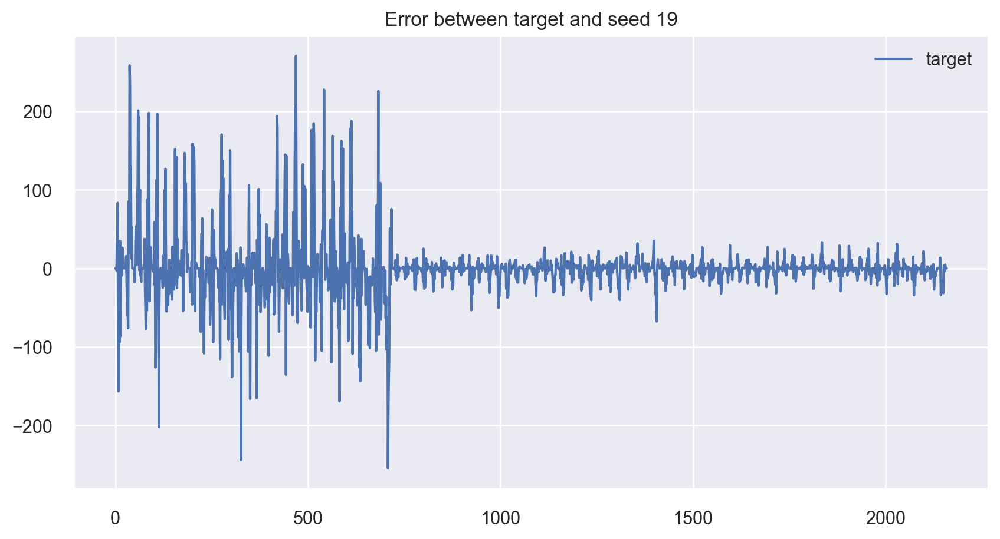

MAE for seed 19: 17.570695127257782


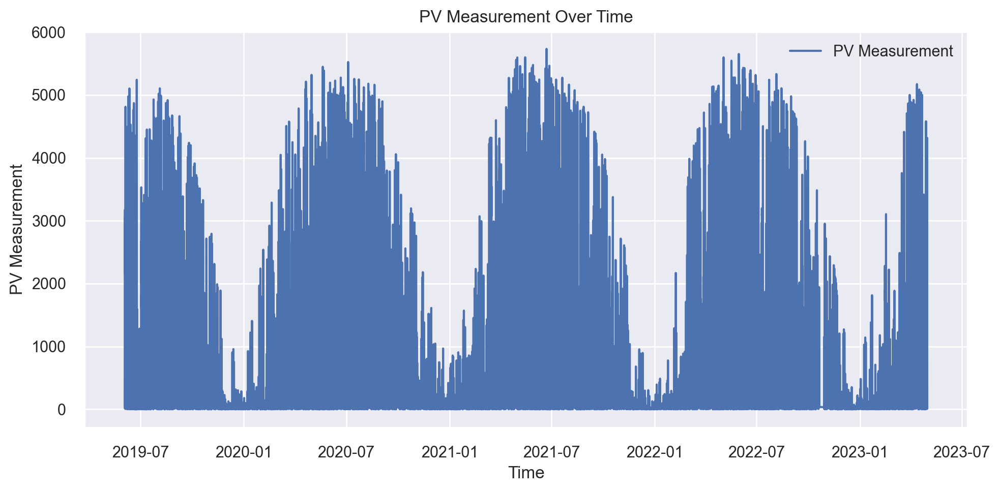

18036 X
18036 y


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     327.2432  263885.4111  513.6978  0.8659  0.8462  2.4030
1     313.0757  258188.8272  508.1228  0.8725  0.9514  3.9006
2     303.9931  233795.0930  483.5236  0.8789  1.0483  4.6666
3     329.3776  268798.1037  518.4574  0.8643  0.9169  3.9057
4     347.8560  319242.2708  565.0153  0.8455  0.9248  4.8696
5     311.7482  252166.6787  502.1620  0.8601  0.8718  3.2272
6     306.1325  235480.6788  485.2635  0.8717  0.9251  3.3980
7     313.5470  248082.7864  498.0791  0.8675  0.9195  3.5197
8     313.6583  253736.4524  503.7226  0.8647  0.9550  3.9162
9     331.7519  284814.3405  533.6800  0.8401  0.9852  4.5042
Mean  319.8383  261819.0643  511.1724  0.8631  0.9344  3.8311
Std    13.0408   23913.5919   22.8435  0.0114  0.0535  0.7025
#############################################
Catboost Done


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     332.5964  281386.4859  530.4588  0.8570  0.7814  2.3287
1     321.3179  274545.5341  523.9709  0.8644  0.8627  2.8654
2     307.4147  249152.9935  499.1523  0.8710  0.9325  3.7138
3     340.0141  280872.3039  529.9739  0.8582  0.8559  2.7432
4     348.7279  332590.6523  576.7067  0.8391  0.8446  3.1654
5     320.6445  269201.3995  518.8462  0.8507  0.8398  2.9389
6     309.9052  250137.7534  500.1377  0.8637  0.8454  2.3747
7     313.3349  253320.6527  503.3097  0.8647  0.8000  2.1038
8     312.4139  252270.8915  502.2658  0.8654  0.8429  2.2321
9     335.1483  297200.1148  545.1606  0.8332  0.8863  3.2522
Mean  324.1518  274067.8782  522.9983  0.8567  0.8491  2.7718
Std    13.4389   24865.1298   23.2529  0.0116  0.0397  0.4901
#############################################
LGBM Done


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     323.5629  265696.0982  515.4572  0.8650  0.7825  2.1556
1     310.8983  260460.8926  510.3537  0.8714  0.8622  2.9437
2     299.8885  235809.7196  485.6024  0.8779  0.9216  3.3821
3     330.2607  269216.0721  518.8604  0.8641  0.8504  2.6682
4     343.1651  319693.3241  565.4143  0.8453  0.8523  3.5091
5     310.1081  254602.1857  504.5812  0.8588  0.8052  2.2515
6     302.8241  236376.0372  486.1852  0.8712  0.8411  2.2928
7     308.2229  244949.8219  494.9241  0.8691  0.8319  2.5181
8     307.4846  246357.8927  496.3445  0.8686  0.8388  2.3552
9     328.1862  284680.3398  533.5544  0.8402  0.8881  3.2776
Mean  316.4601  261784.2384  511.1277  0.8632  0.8474  2.7354
Std    13.3109   24172.6780   23.0798  0.0113  0.0371  0.4813
#############################################
Blended
#############################################
Finalized
float64
date_forecast 

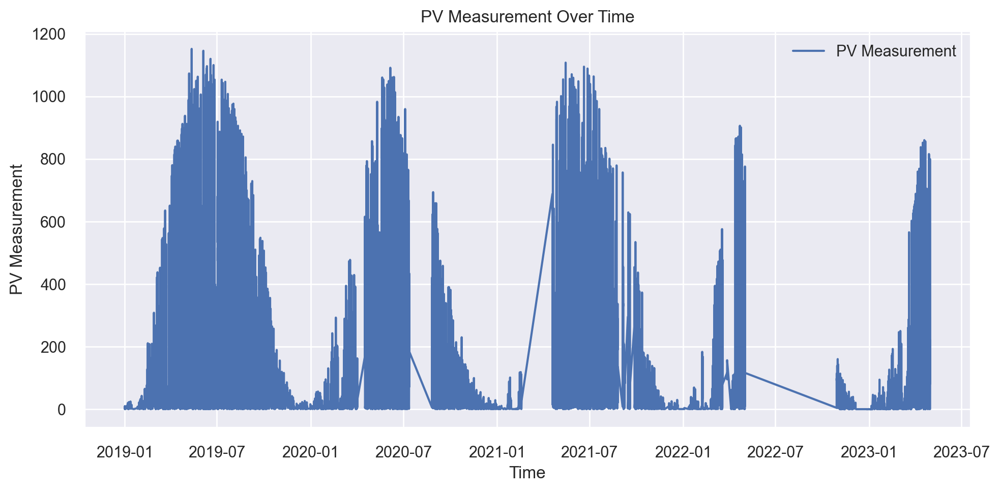

12274 X
12274 y


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     51.1289  7310.2833  85.5002  0.9012  0.7408  2.5917
1     49.1641  6370.3994  79.8148  0.9141  0.7276  1.6203
2     51.4359  7563.7186  86.9696  0.8901  0.7059  2.2462
3     46.0884  5556.2474  74.5402  0.9057  0.6958  1.5570
4     47.7334  6089.6970  78.0365  0.9155  0.7270  1.7639
5     48.2343  6411.0241  80.0689  0.9121  0.6781  1.3813
6     51.4089  7200.9970  84.8587  0.8974  0.6951  1.9590
7     49.3497  6656.2075  81.5856  0.8857  0.6890  1.3444
8     48.3373  6402.3162  80.0145  0.9073  0.7468  1.5667
9     53.7120  8327.3345  91.2542  0.8718  0.7525  1.6035
Mean  49.6593  6788.8225  82.2643  0.9001  0.7159  1.7634
Std    2.1303   768.2508   4.6264  0.0133  0.0250  0.3750
#############################################
Catboost Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     53.6038  7855.3463  88.6304  0.8938  0.7644  2.4100
1     51.1520  6667.8332  81.6568  0.9101  0.7386  1.5231
2     52.8301  8043.9410  89.6880  0.8831  0.7147  2.0482
3     47.1584  5725.3178  75.6658  0.9028  0.6984  1.5832
4     49.1978  6410.7212  80.0670  0.9110  0.7073  1.7674
5     49.4988  7021.2266  83.7928  0.9037  0.6719  1.3931
6     53.4550  7767.1470  88.1314  0.8894  0.6884  1.8521
7     49.5209  6561.1249  81.0008  0.8874  0.7183  1.4166
8     50.1941  7188.8751  84.7872  0.8959  0.7478  1.7235
9     53.4895  8602.4374  92.7493  0.8675  0.7584  1.5081
Mean  51.0100  7184.3971  84.6170  0.8945  0.7208  1.7225
Std    2.1324   833.5984   4.9364  0.0127  0.0292  0.3008
#############################################
LGBM Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     51.4236  7379.3500  85.9031  0.9002  0.7259  2.3441
1     49.2886  6341.1174  79.6311  0.9145  0.7197  1.5385
2     51.2575  7627.9009  87.3379  0.8891  0.7032  2.1112
3     45.7298  5471.1424  73.9672  0.9071  0.6794  1.4479
4     47.5199  6066.7437  77.8893  0.9158  0.6985  1.6959
5     47.9605  6535.8606  80.8447  0.9104  0.6461  1.2902
6     51.6091  7275.1136  85.2943  0.8964  0.6833  1.1905
7     48.4615  6427.7730  80.1734  0.8896  0.6913  1.3080
8     48.4074  6610.4056  81.3044  0.9043  0.7272  1.6037
9     52.7431  8310.4385  91.1616  0.8720  0.7438  1.4992
Mean  49.4401  6804.5846  82.3507  0.8999  0.7018  1.6029
Std    2.1105   792.8671   4.7904  0.0129  0.0272  0.3479
#############################################
Blended
#############################################
Finalized
float64
date_forecast    datetime64[ns]
is_day:idx              float32
dtype:

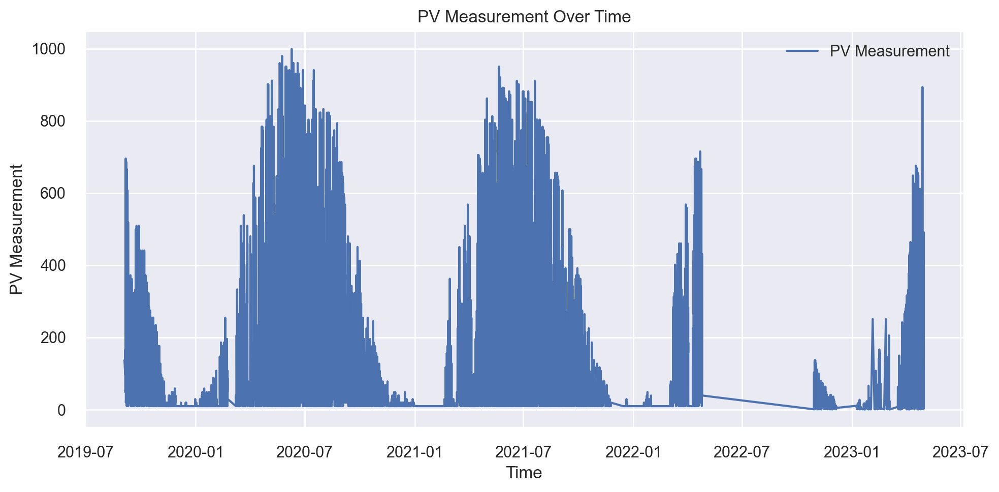

9676 X
9676 y


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     42.0990  4822.5359  69.4445  0.8994  0.5169  0.6070
1     43.5939  4777.9036  69.1224  0.8980  0.5186  0.5457
2     45.9108  5404.4556  73.5150  0.8949  0.5119  0.5538
3     42.7389  4995.9555  70.6821  0.8837  0.5683  0.6250
4     42.6698  4874.2450  69.8158  0.8938  0.5460  0.6275
5     50.0147  6434.1938  80.2134  0.8724  0.5103  0.5834
6     43.7063  5168.2772  71.8907  0.8856  0.5344  0.5362
7     42.2605  5192.1174  72.0563  0.8798  0.5188  0.5972
8     45.9769  5366.1378  73.2539  0.8783  0.5139  0.5478
9     42.6886  4873.1908  69.8082  0.8806  0.5596  0.6470
Mean  44.1659  5190.9013  71.9802  0.8867  0.5299  0.5871
Std    2.3544   465.6263   3.1219  0.0088  0.0201  0.0376
#############################################
Catboost Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     43.1248  5003.3727  70.7345  0.8957  0.5305  0.6373
1     45.4668  5404.5705  73.5158  0.8847  0.4904  0.5418
2     46.4769  5728.3619  75.6859  0.8886  0.5033  0.5738
3     43.9557  5324.1461  72.9667  0.8760  0.5432  0.6614
4     43.9390  5228.6445  72.3094  0.8861  0.5369  0.6683
5     52.2983  6988.9093  83.5997  0.8614  0.5175  0.6068
6     45.5940  5299.6687  72.7988  0.8827  0.5376  0.5984
7     42.7250  5348.9722  73.1367  0.8762  0.5208  0.6823
8     47.5957  5720.8142  75.6361  0.8703  0.5260  0.6460
9     41.5238  4629.7342  68.0422  0.8866  0.5341  0.6301
Mean  45.2700  5467.7194  73.8426  0.8808  0.5240  0.6246
Std    2.9158   590.5884   3.8721  0.0095  0.0157  0.0421
#############################################
LGBM Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     41.7178  4785.7859  69.1794  0.9002  0.5018  0.6095
1     43.6150  4952.0731  70.3710  0.8943  0.4787  0.5263
2     45.3779  5419.4225  73.6167  0.8946  0.4800  0.5308
3     42.4384  5010.5736  70.7854  0.8833  0.5201  0.6182
4     42.3634  4926.7015  70.1905  0.8927  0.5054  0.5966
5     50.5795  6538.7983  80.8628  0.8703  0.4860  0.5569
6     43.5605  5061.3947  71.1435  0.8880  0.5171  0.5485
7     41.5838  5110.4344  71.4873  0.8817  0.5098  0.6214
8     46.2052  5398.0605  73.4715  0.8776  0.5086  0.5833
9     41.3289  4643.1229  68.1405  0.8863  0.5251  0.6198
Mean  43.8770  5184.6367  71.9249  0.8869  0.5033  0.5811
Std    2.7118   505.8019   3.3841  0.0085  0.0157  0.0357
#############################################
Blended
#############################################
Finalized
float64
date_forecast    datetime64[ns]
is_day:idx              float32
dtype:

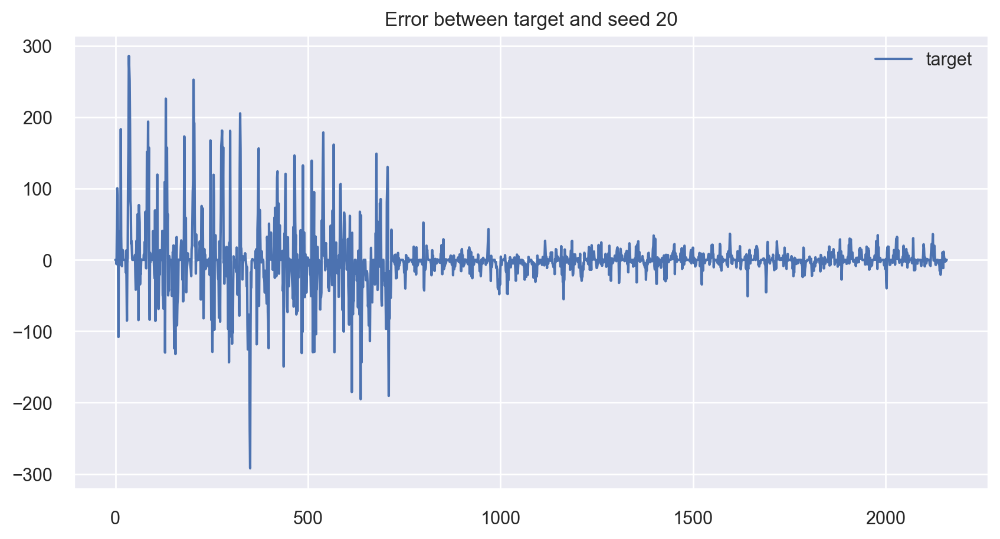

MAE for seed 20: 17.57249823912918


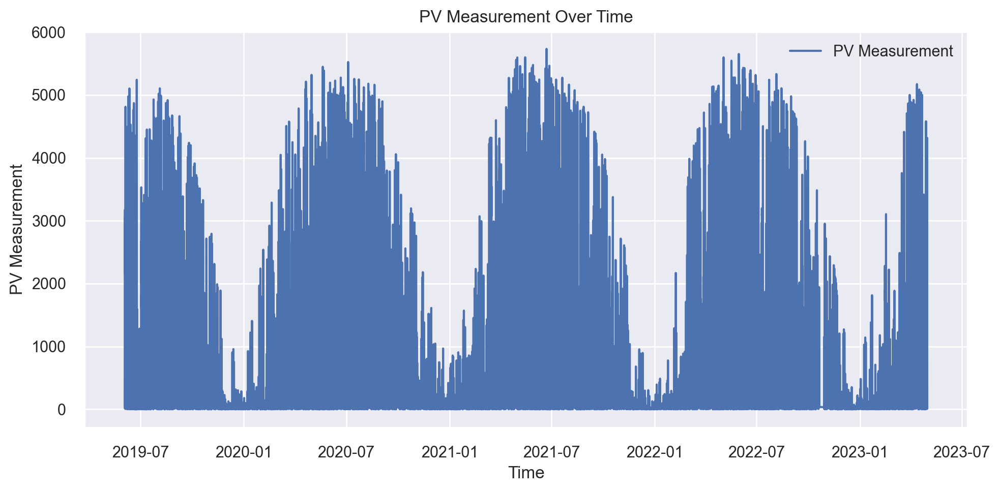

18036 X
18036 y


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     313.3774  262317.5635  512.1695  0.8622  0.9837  4.2334
1     308.8579  248044.1702  498.0403  0.8753  0.8871  3.2378
2     325.8948  269321.3981  518.9618  0.8625  0.9522  4.0066
3     321.3625  267180.7684  516.8953  0.8688  0.9306  4.9204
4     322.2391  266784.6189  516.5120  0.8555  0.9998  6.0108
5     316.8966  258534.2181  508.4626  0.8505  0.9357  3.4054
6     300.2096  233992.6133  483.7278  0.8786  0.9483  3.8647
7     329.3248  306107.3353  553.2697  0.8285  0.8945  2.3002
8     328.5246  273648.2163  523.1140  0.8611  0.8511  2.7334
9     300.9357  218425.0029  467.3596  0.8869  0.9619  4.8930
Mean  316.7623  260435.5905  509.8513  0.8630  0.9345  3.9606
Std    10.1447   22472.3647   22.0745  0.0155  0.0433  1.0570
#############################################
Catboost Done


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     324.2100  285863.9688  534.6625  0.8498  0.8907  2.7284
1     313.5845  256278.3329  506.2394  0.8712  0.8225  3.1036
2     325.0855  270934.6392  520.5138  0.8617  0.8501  2.3785
3     330.5914  278063.3776  527.3172  0.8634  0.8808  2.7564
4     327.9351  281767.2117  530.8175  0.8474  0.8884  3.3661
5     327.5841  273593.1701  523.0613  0.8418  0.8680  2.3262
6     310.4622  250302.4631  500.3024  0.8702  0.8093  1.9629
7     342.9800  337293.7979  580.7700  0.8110  0.8309  1.6723
8     337.3347  284456.6084  533.3447  0.8556  0.8084  2.0702
9     311.8693  240006.3865  489.9045  0.8757  0.8389  2.3307
Mean  325.1637  275855.9956  524.6933  0.8548  0.8488  2.4695
Std    10.1805   25178.0681   23.5140  0.0180  0.0300  0.4955
#############################################
LGBM Done


           MAE          MSE      RMSE      R2   RMSLE    MAPE
Fold                                                         
0     313.6978  267552.1987  517.2545  0.8595  0.8856  2.9511
1     304.7102  245260.6502  495.2380  0.8767  0.8100  2.7181
2     319.6377  263701.2883  513.5185  0.8654  0.8502  2.6241
3     319.5353  265523.1857  515.2894  0.8696  0.8458  3.0615
4     319.2589  267768.1466  517.4632  0.8550  0.8993  3.9221
5     317.6875  260167.8692  510.0665  0.8496  0.8763  2.3855
6     300.5274  235759.9401  485.5512  0.8777  0.8421  2.4196
7     329.7942  315495.7346  561.6901  0.8232  0.8261  1.7876
8     327.2812  272874.3384  522.3738  0.8614  0.8019  2.0568
9     299.8500  222365.2839  471.5562  0.8848  0.8739  3.0338
Mean  315.1980  261646.8636  511.0001  0.8623  0.8511  2.6960
Std     9.9161   23666.8913   22.9287  0.0166  0.0308  0.5682
#############################################
Blended
#############################################
Finalized
float64
date_forecast 

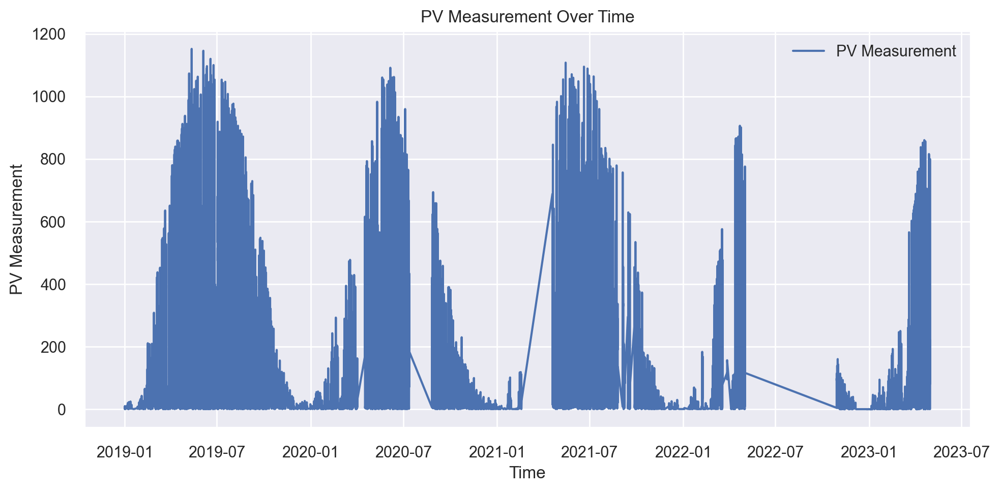

12274 X
12274 y


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     46.5101  6164.1874  78.5123  0.9154  0.7325  1.7738
1     48.3628  6187.4897  78.6606  0.9161  0.6776  1.2006
2     52.0368  7334.2650  85.6403  0.8953  0.7301  1.5110
3     52.2022  7345.1247  85.7037  0.8968  0.6329  1.1828
4     51.5282  6998.1406  83.6549  0.8901  0.6867  1.2583
5     52.2440  8198.5806  90.5460  0.8770  0.7335  2.0741
6     52.4252  7553.2053  86.9092  0.8948  0.7439  1.8641
7     48.0737  6049.5776  77.7790  0.9013  0.7753  3.1802
8     51.1242  6850.3704  82.7670  0.9002  0.7217  1.3367
9     48.4825  6075.8377  77.9477  0.9126  0.7513  3.4530
Mean  50.2990  6875.6779  82.8121  0.8999  0.7185  1.8835
Std    2.0855   704.0911   4.2236  0.0116  0.0394  0.7733
#############################################
Catboost Done


          MAE        MSE     RMSE      R2   RMSLE     MAPE
Fold                                                      
0     48.6216  6433.7177  80.2105  0.9117  0.7470   1.7644
1     49.9647  6673.9453  81.6942  0.9095  0.6614   1.1569
2     51.7472  6938.0967  83.2952  0.9009  0.6978   1.7606
3     52.6385  7761.3272  88.0984  0.8909  0.6016   1.1833
4     51.6838  7372.5307  85.8634  0.8843  0.6644   1.3094
5     53.4814  8551.7753  92.4758  0.8717  0.7299   1.9289
6     53.5095  7746.5747  88.0146  0.8921  0.7830   1.9878
7     50.3345  6782.0921  82.3535  0.8893  0.7586  61.6726
8     51.2891  6865.3472  82.8574  0.8999  0.6976   1.4087
9     50.8259  6582.4362  81.1322  0.9053  0.7563   2.8310
Mean  51.4096  7170.7843  84.5995  0.8956  0.7098   7.7004
Std    1.4756   637.4088   3.7020  0.0117  0.0530  17.9969
#############################################
LGBM Done


          MAE        MSE     RMSE      R2   RMSLE     MAPE
Fold                                                      
0     46.6922  6145.8565  78.3955  0.9156  0.7150   1.7019
1     48.3331  6231.0565  78.9370  0.9155  0.6572   1.1219
2     50.8418  6937.1273  83.2894  0.9009  0.6875   1.4417
3     51.4575  7352.1259  85.7445  0.8967  0.5959   1.1353
4     50.5445  7019.3323  83.7815  0.8898  0.6622   1.2197
5     51.9351  8192.0844  90.5101  0.8771  0.7298   1.9662
6     51.8287  7447.2381  86.2974  0.8963  0.7276   1.8146
7     48.3225  6231.6182  78.9406  0.8983  0.7462  32.3515
8     50.2051  6666.0213  81.6457  0.9029  0.6896   1.3174
9     48.6664  6112.6602  78.1835  0.9120  0.7257   3.0548
Mean  49.8827  6833.5121  82.5725  0.9005  0.6937   4.7125
Std    1.6863   654.3992   3.9102  0.0114  0.0432   9.2292
#############################################
Blended
#############################################
Finalized
float64
date_forecast    datetime64[ns]
is_day:idx              

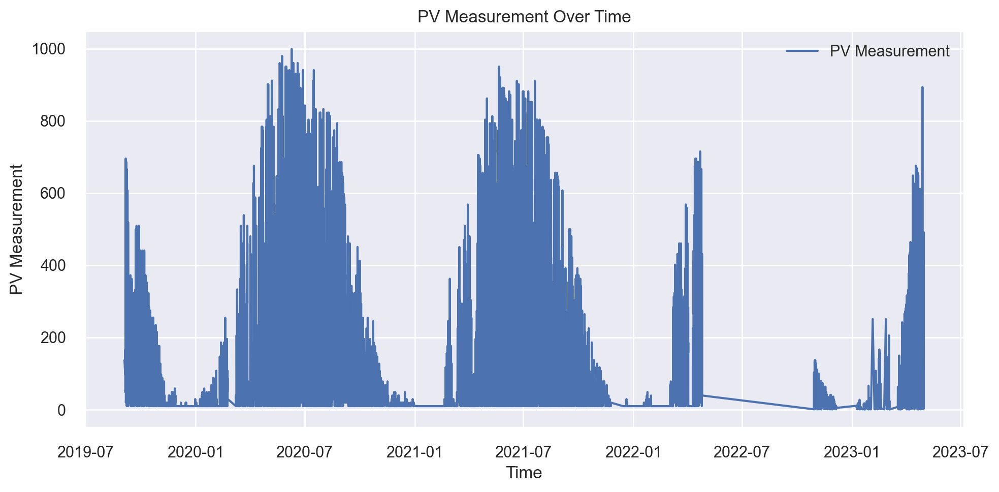

9676 X
9676 y


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     43.6652  5031.0406  70.9298  0.8920  0.5638  0.7984
1     46.3321  5910.1660  76.8776  0.8712  0.5246  0.5592
2     41.9844  4763.7853  69.0202  0.8934  0.4965  0.5189
3     41.9692  4804.1160  69.3117  0.8913  0.5013  0.5343
4     47.1327  6081.5873  77.9845  0.8628  0.5285  0.5508
5     44.0725  5057.2513  71.1144  0.8903  0.5531  0.6053
6     44.9604  5458.2865  73.8802  0.8783  0.5479  0.6504
7     44.4229  5014.1720  70.8108  0.8987  0.5527  0.5845
8     43.1202  4957.5141  70.4096  0.9034  0.5313  0.6190
9     42.4859  4993.4070  70.6640  0.8904  0.5271  0.5662
Mean  44.0145  5207.1326  72.1003  0.8872  0.5327  0.5987
Std    1.6650   433.5527   2.9463  0.0119  0.0210  0.0766
#############################################
Catboost Done


          MAE        MSE     RMSE      R2   RMSLE    MAPE
Fold                                                     
0     45.8067  5388.9334  73.4094  0.8843  0.5752  0.7911
1     46.0275  5428.9114  73.6811  0.8817  0.5030  0.5853
2     43.8586  5031.3308  70.9319  0.8874  0.5175  0.5502
3     41.7337  4610.6587  67.9018  0.8957  0.4926  0.5651
4     49.2107  6665.3896  81.6418  0.8497  0.5309  0.5983
5     44.9052  5174.9649  71.9372  0.8878  0.5761  0.7613
6     45.2101  5456.6613  73.8692  0.8783  0.5258  0.6687
7     45.1047  5222.8826  72.2695  0.8945  0.5562  0.6796
8     44.0056  5187.4954  72.0243  0.8989  0.5478  0.7007
9     44.5192  5284.4027  72.6939  0.8840  0.5360  0.6449
Mean  45.0382  5345.1631  73.0360  0.8842  0.5361  0.6545
Std    1.8077   497.4754   3.3020  0.0131  0.0267  0.0774
#############################################
LGBM Done


Processing:   0%|          | 0/6 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [50]:
from pycaret.regression import *
for seed in range(1,50):    
    locations = ['A','B','C']
    all_predictions = []

    for loc in locations:
        # Load your data
        train = pd.read_parquet(f'Data/{loc}/train_targets.parquet').fillna(0)
        X_train_estimated = pd.read_parquet(f'Data/{loc}/X_train_estimated.parquet')
        X_train_observed = pd.read_parquet(f'Data/{loc}/X_train_observed.parquet')
        X_test_estimated = pd.read_parquet(f'Data/{loc}/X_test_estimated.parquet')

        #lage dag og måned feature der man aggregerer opp 
        # Preprocess data
        X_train, X_test, is_day_feature, targets = preprocessing(train, X_train_observed, X_train_estimated, X_test_estimated)
        y_train = targets
        if X_train.empty or len(y_train) == 0:
            print(f"X_train or y_train is empty for location {loc}")

        # Ensure X and y have the same length
        print(len(X_train), 'X')
        print(len(y_train),'y')
        min_length = min(len(X_train), len(y_train))
        X_train, y_train = X_train.iloc[:min_length], y_train[:min_length]


        data = X_train.copy()
        data.columns = data.columns.str.replace('[^\w\s]', '')

        X_test.columns = X_test.columns.str.replace('[^\w\s]', '')


        data['target'] = y_train['pv_measurement']

        exp_reg = RegressionExperiment()
        exp_reg.setup(data=data, 
                    target='target', 
                    session_id=seed,
                    categorical_features=['dew_or_rimeidx', 'is_in_shadowidx', 'is_estimated'],
                    html=False,
                    experiment_name=f'exp_{loc}', 
                    use_gpu=False,
                    verbose=False,
                    n_jobs=1)
        
        # Process the location data and get the final model
        model_catboost = exp_reg.create_model('catboost', random_state = seed)
        print("#############################################")
        print("Catboost Done")
        model_lightgbm = exp_reg.create_model('lightgbm', random_state = seed)
        print("#############################################")
        print("LGBM Done")

        blended_model = exp_reg.blend_models([model_catboost, model_lightgbm])
        print("#############################################")
        print("Blended")

        # Finalize the model
        blended_model = exp_reg.finalize_model(blended_model)
        print("#############################################")
        print("Finalized")
        

        # Predict on new data
        predictions = exp_reg.predict_model(blended_model, data=X_test)
            #print(predictions.columns)
            # Assuming 'predictions' is the output from predict_model
        final_predictions = predictions['prediction_label']
        print(final_predictions.dtypes)
        print(is_day_feature.dtypes)
        # Multiply final predictions with the 'is_day:idx' values
        
        adjusted_final_predictions = final_predictions * is_day_feature['is_day:idx']
        adjusted_final_predictions = np.clip(adjusted_final_predictions, 0, None)
        # Now, 'adjusted_final_predictions' contains the adjusted target values.

            # Store predictions
        all_predictions.append(adjusted_final_predictions)  

    # To measure distance between this and the target predictions
    final_predictions = np.concatenate(all_predictions)
    df = pd.DataFrame(final_predictions, columns=['prediction'])
    df['id'] = df.index
    seed_pred = df[['id', 'prediction']]
    seed_pred.to_csv(f"seed_results/pycaret_simple_cat_lgbm_{seed}.csv", index=False)
    # multimodel_basic_cat_lgbm_reproduced_2
    target_pred = pd.read_csv('Predictions/multimodel_basic_cat_lgbm_reproduced_2.csv')
    plt.plot(target_pred['id'], target_pred['prediction'] - seed_pred['prediction'], label='target')
    plt.title(f'Error between target and seed {seed}')
    plt.legend()
    plt.show()
    print(f"MAE for seed {seed}: {np.mean(np.abs(target_pred['prediction'] - seed_pred['prediction']))}")




In [ ]:
def save_predictions(all_predictions, title):
    final_predictions = np.concatenate(all_predictions)
    df = pd.DataFrame(final_predictions, columns=['prediction'])
    df['id'] = df.index
    df = df[['id', 'prediction']]
    df.to_csv(title, index=False)

def plot_from_csv(title):
    plt.figure(figsize=(12, 6))
    df = pd.read_csv(title)
    plt.plot(df['prediction'], label=title)
    plt.xlabel('Time')
    plt.ylabel('Predictions')
    plt.title('Predictions Over Time')
    plt.legend()
    plt.show()
    

title = 'multimodel_basic_stacked_xt_cat_lgbm.csv'
save_predictions(all_predictions, title)
plot_from_csv(title)


In [ ]:
df1 = pd.read_csv('multimodel_basic_cat_lgbm_reproduced_jman.csv')
df3 = pd.read_csv('multimodel_basic_cat_lgbm_reproduced_2.csv')

df1['prediction'] = df1['prediction'].astype(float)
df3['prediction'] = df3['prediction'].astype(float)

# Plot different between df1 and df3 
plt.figure(figsize=(24, 12))
plt.plot(df1['prediction'] - df3['prediction'], label='df1 - df3', c = 'blue')
#plt.plot(df2['prediction'] - df3['prediction'], label='df2 - df3', c = 'red')   
#plt.plot(df1['prediction'] - df2['prediction'], label='df1 - df2', c = 'green')
plt.show()

In [ ]:
import pandas as pd

val_a = 3.6317187499999997
val_b = 24.31785735278335
val_c = 5.777916666666667

# Initialize a dictionary to hold the masks
masks = {}
locations = ['A', 'B', 'C']
values = {'A': val_a, 'B': val_b, 'C': val_c}  # Dictionary to hold different values for each location

for loc in locations:
    # Load your data
    train = pd.read_parquet(f'{loc}/train_targets.parquet').fillna(0)
    X_train_estimated = pd.read_parquet(f'{loc}/X_train_estimated.parquet')
    X_train_observed = pd.read_parquet(f'{loc}/X_train_observed.parquet')
    X_test_estimated = pd.read_parquet(f'{loc}/X_test_estimated.parquet')

    X_train, X_test, is_day_feature, targets = preprocessing(train, X_train_observed, X_train_estimated, X_test_estimated)
    
    # Create mask for the current location where 'is_day:idx' == 0
    masks[loc] = (X_test['is_day:idx'] == 0) or (X_test['is_day:idx'] == 0.25) or (X_test['is_day:idx'] == 0.5) or (X_test['is_day:idx'] == 0.75)

    # Add a new column with the location-specific value
    masks[loc] = masks[loc].reset_index(drop=True)
    masks[loc] = pd.concat([masks[loc], pd.Series([values[loc]] * len(masks[loc]), name='Value')], axis=1)

    # Calculate mean value for the current location under is_day:idx == 1
    print(np.mean(targets[X_train['is_day:idx'] == 0]['pv_measurement']))

# Now we concatenate the masks along with their new 'Value' column
mask0 = pd.concat([masks['A'], masks['B'], masks['C']], ignore_index=True)

print(mask0)


In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np  # Make sure to import NumPy

# Load your data
df1 = pd.read_csv('multimodel_basic_cat_lgbm_reproduced_jman.csv')

# Ensure that mask0 is a DataFrame and has a 'Value' column with the values you want to use for replacement
# The np.where function is used to replace values where the condition is true
df1['prediction'] = np.where(mask0['is_day:idx'], mask0['Value'], df1['prediction'])

plt.figure(figsize=(24, 12))
plt.plot(df1['prediction'], label='df1')

plt.legend()
plt.show()


In [ ]:
df1.to_csv('multimodel_basic_cat_lgbm_reproduced_is_day_calc.csv', index=False)

In [ ]:
df1 = pd.read_csv('multimodel_basic_cat_lgbm_reproduced_jman.csv')
df1

In [ ]:
import pandas as pd

# Assuming 'data' is a DataFrame and 'value' is the column with your numbers.
# Replace 0 with NaN for interpolation
data = df1.copy()

# count 0's 
print(data['prediction'].value_counts()[0])
print(data['prediction'].value_counts()[0] / len(data))
